In [15]:
import quandl
quandl.ApiConfig.api_key = 'N5RBJdsvdn3ry5aXWXz5'
import time
from random import randint
import itertools

from numpy.linalg import inv
from numpy import linalg as LA
import matplotlib.pylab as plt
from IPython import display

import numpy as np
import scipy as sc
import numpy.random
from pandas import Series,DataFrame
import pandas as pd
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.figsize'] = (16.0, 10.0)

## read stock symbols names from csv file 

In [16]:
symbolsdf = pd.read_csv("/home/xxx/DS/finance/WIKI-datasets-codes.csv", header=None,names=["symbol","company"])

In [17]:
symbolsdf.head()

,symbol,company
0,WIKI/AAPL,"Apple Inc (AAPL) Prices, Dividends, Splits and..."
1,WIKI/ABC,"AmerisourceBergen Corp. (ABC) Prices, Dividend..."
2,WIKI/AA,"Alcoa Inc. (AA) Prices, Dividends, Splits and ..."
3,WIKI/ABBV,"AbbVie Inc. (ABBV) Prices, Dividends, Splits a..."
4,WIKI/ACE,"ACE Ltd (ACE) Prices, Dividends, Splits and Tr..."


In [18]:
stock_symbol_list = symbolsdf["symbol"].str.split("/",expand=True)[1].values
stock_symbol_list

array(['AAPL', 'ABC', 'AA', ..., 'WELL', 'BKNG', 'CBRE'], dtype=object)

In [19]:
print len(stock_symbol_list)

3199


In [20]:
## find all possible combinations
'''
for L in range(3, 6):
    for subset in itertools.combinations(stock_symbol_list, L):
        print subset
        '''

'\nfor L in range(3, 6):\n    for subset in itertools.combinations(stock_symbol_list, L):\n        print subset\n        '

In [21]:
selected = ['NEOG', 'UNFI', 'PIR', 'GNC', 'HSH']
data = quandl.get_table('WIKI/PRICES', ticker = selected,
                        qopts = { 'columns': ['date', 'ticker', 'adj_close'] },
                        date = { 'gte': '2005-1-1', 'lte': '2018-12-31' }, paginate=True)

# reorganise data pulled by setting date as index with
# columns of tickers and their corresponding adjusted prices
clean = data.set_index('date')
table = clean.pivot(columns='ticker')
table.columns = table.columns.droplevel()
table.head()
# calculate daily and annual returns of the stocks
returns_daily = table.pct_change()
returns_annual = returns_daily.mean() * 250
table.head()

ticker,GNC,HSH,NEOG,PIR,UNFI
date,,,,,
2005-01-03,NaN,51.636390,6.461630,15.537989,30.46
2005-01-04,NaN,52.325162,6.474074,15.242711,30.12
2005-01-05,NaN,51.356576,6.107852,14.963395,29.25
2005-01-06,NaN,51.119811,6.186667,14.652156,30.30
2005-01-07,NaN,51.270479,6.065185,14.620234,29.66


In [22]:
filename = '/home/xxx/DS/finance/HISTORICAL_STOCK_PRICES-Part.csv'
print "writing to file: " + filename
table.to_csv(filename, encoding='utf-8', sep=';')

writing to file: /home/xxx/DS/finance/HISTORICAL_STOCK_PRICES-Part.csv


## download historical prices from quandl

In [30]:

dff = pd.DataFrame()

for i in xrange(0,len(stock_symbol_list),20):
    lower = i
    upper = i+20
    print lower,upper
    data = quandl.get_table('WIKI/PRICES', ticker = list(stock_symbol_list[lower:upper]),
                        qopts = { 'columns': ['date', 'ticker', 'adj_close'] },
                        date = { 'gte': '1995-1-1', 'lte': '2018-12-31' }, paginate=True)
    data.head()
    clean = data.set_index('date')
    table = clean.pivot(columns='ticker')
    table.columns = table.columns.droplevel()
    dff = pd.concat([dff, table], axis=1)
    #print dff.head()
    #table.tail()
        
dff.head()


0 20
20 40
40 60
60 80
80 100
100 120
120 140
140 160
160 180
180 200
200 220
220 240
240 260
260 280
280 300
300 320
320 340
340 360
360 380
380 400
400 420
420 440
440 460
460 480
480 500
500 520
520 540
540 560
560 580
580 600
600 620
620 640
640 660
660 680
680 700
700 720
720 740
740 760
760 780
780 800
800 820
820 840
840 860
860 880
880 900
900 920
920 940
940 960
960 980
980 1000
1000 1020
1020 1040
1040 1060
1060 1080
1080 1100
1100 1120
1120 1140
1140 1160
1160 1180
1180 1200
1200 1220
1220 1240
1240 1260
1260 1280
1280 1300
1300 1320
1320 1340
1340 1360
1360 1380
1380 1400
1400 1420
1420 1440
1440 1460
1460 1480
1480 1500
1500 1520
1520 1540
1540 1560
1560 1580
1580 1600
1600 1620
1620 1640
1640 1660
1660 1680
1680 1700
1700 1720
1720 1740
1740 1760
1760 1780
1780 1800
1800 1820
1820 1840
1840 1860
1860 1880
1880 1900
1900 1920
1920 1940
1940 1960
1960 1980
1980 2000
2000 2020
2020 2040
2040 2060
2060 2080
2080 2100
2100 2120
2120 2140
2140 2160
2160 2180
2180 2200
2200 2220

ticker,AA,AAPL,ABBV,ABC,ABT,ACE,ACN,ADBE,ADI,ADM,...,FTV,HLT,INFO,IQV,MAA,SPGI,TPR,UAA,UA_C,WELL
date,,,,,,,,,,,,,,,,,,,,,
1995-01-03,NaN,1.219186,NaN,NaN,4.285944,5.012423,NaN,3.598206,3.989606,13.612694,...,NaN,NaN,NaN,NaN,6.043462,NaN,NaN,NaN,NaN,NaN
1995-01-04,NaN,1.250952,NaN,NaN,4.301706,5.069383,NaN,3.507495,3.884428,13.693362,...,NaN,NaN,NaN,NaN,6.016352,NaN,NaN,NaN,NaN,NaN
1995-01-05,NaN,1.235069,NaN,NaN,4.268868,5.040903,NaN,3.613929,3.922674,13.525304,...,NaN,NaN,NaN,NaN,5.986981,NaN,NaN,NaN,NaN,NaN
1995-01-06,NaN,1.334180,NaN,NaN,4.203193,4.936478,NaN,3.688917,4.033829,13.357246,...,NaN,NaN,NaN,NaN,5.959871,NaN,NaN,NaN,NaN,NaN
1995-01-09,NaN,1.308767,NaN,NaN,4.195312,4.936478,NaN,3.734877,4.078649,13.357246,...,NaN,NaN,NaN,NaN,5.874020,NaN,NaN,NaN,NaN,NaN


In [31]:
dff.tail()

ticker,AA,AAPL,ABBV,ABC,ABT,ACE,ACN,ADBE,ADI,ADM,...,FTV,HLT,INFO,IQV,MAA,SPGI,TPR,UAA,UA_C,WELL
date,,,,,,,,,,,,,,,,,,,,,
2018-03-21,47.95,171.270,112.45,89.50,62.42,NaN,162.03,226.85,92.80,42.62,...,78.35,81.84,48.79,104.11,89.47,193.81,52.97,15.95,NaN,52.45
2018-03-22,44.92,168.845,98.10,85.00,60.93,NaN,150.23,220.52,90.54,41.94,...,76.69,80.44,47.77,101.88,88.16,189.08,51.95,15.73,NaN,52.75
2018-03-23,44.71,164.940,97.46,84.03,59.50,NaN,147.35,215.02,87.70,42.05,...,76.02,78.17,46.87,99.72,86.83,186.49,51.74,15.78,NaN,52.03
2018-03-26,45.77,172.770,95.28,84.95,61.07,NaN,152.85,228.91,93.11,42.83,...,78.09,79.98,48.03,101.66,87.85,191.28,53.24,16.67,NaN,52.14
2018-03-27,44.90,168.340,92.01,84.01,60.28,NaN,148.86,213.80,91.05,42.87,...,76.80,78.79,48.60,100.06,88.20,187.87,53.11,16.44,NaN,53.28


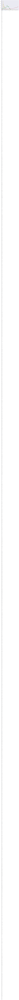

In [25]:
dff.plot()

In [32]:
filename = '/home/xxx/DS/finance/HISTORICAL_STOCK_PRICES-INCOMPLETE-0195-0408.csv'
print "writing to file: " + filename
dff.to_csv(filename, encoding='utf-8', sep=';')

writing to file: /home/xxx/DS/finance/HISTORICAL_STOCK_PRICES-INCOMPLETE-0195-0408.csv


In [146]:
stock_symboldff.columns.values

array([u'AA', u'AAPL', u'ABBV', ..., u'UAA', u'UA_C', u'WELL'], dtype=object)

In [234]:
dff.tail()

ticker,AA,AAPL,ABBV,ABC,ABT,ACE,ACN,ADBE,ADI,ADM,...,FTV,HLT,INFO,IQV,MAA,SPGI,TPR,UAA,UA_C,WELL
date,,,,,,,,,,,,,,,,,,,,,
2018-03-21,47.95,171.270,112.45,89.50,62.42,NaN,162.03,226.85,92.80,42.62,...,78.35,81.84,48.79,104.11,89.47,193.81,52.97,15.95,NaN,52.45
2018-03-22,44.92,168.845,98.10,85.00,60.93,NaN,150.23,220.52,90.54,41.94,...,76.69,80.44,47.77,101.88,88.16,189.08,51.95,15.73,NaN,52.75
2018-03-23,44.71,164.940,97.46,84.03,59.50,NaN,147.35,215.02,87.70,42.05,...,76.02,78.17,46.87,99.72,86.83,186.49,51.74,15.78,NaN,52.03
2018-03-26,45.77,172.770,95.28,84.95,61.07,NaN,152.85,228.91,93.11,42.83,...,78.09,79.98,48.03,101.66,87.85,191.28,53.24,16.67,NaN,52.14
2018-03-27,44.90,168.340,92.01,84.01,60.28,NaN,148.86,213.80,91.05,42.87,...,76.80,78.79,48.60,100.06,88.20,187.87,53.11,16.44,NaN,53.28


## read prices from localhost

In [2]:
filename = '/home/xxx/DS/finance/HISTORICAL_STOCK_PRICES.csv'
history_df = pd.read_csv(filename, sep=';')
history_df.tail()

,AA,AAPL,ABBV,ABC,ABT,ACE,ACN,ADBE,ADI,ADM,...,FTV,HLT,INFO,IQV,MAA,SPGI,TPR,UAA,UA_C,WELL
4953,47.95,171.270,112.45,89.50,62.42,NaN,162.03,226.85,92.80,42.62,...,78.35,81.84,48.79,104.11,89.47,193.81,52.97,15.95,NaN,52.45
4954,44.92,168.845,98.10,85.00,60.93,NaN,150.23,220.52,90.54,41.94,...,76.69,80.44,47.77,101.88,88.16,189.08,51.95,15.73,NaN,52.75
4955,44.71,164.940,97.46,84.03,59.50,NaN,147.35,215.02,87.70,42.05,...,76.02,78.17,46.87,99.72,86.83,186.49,51.74,15.78,NaN,52.03
4956,45.77,172.770,95.28,84.95,61.07,NaN,152.85,228.91,93.11,42.83,...,78.09,79.98,48.03,101.66,87.85,191.28,53.24,16.67,NaN,52.14
4957,44.90,168.340,92.01,84.01,60.28,NaN,148.86,213.80,91.05,42.87,...,76.80,78.79,48.60,100.06,88.20,187.87,53.11,16.44,NaN,53.28


In [3]:
stock_symbol_list = history_df.columns.values

### filter stock that exist no more

In [4]:
fdff = history_df.loc[:, history_df.iloc[-1].isna()==False].tail()
fdff.tail()

,AA,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,...,DXC,FTV,HLT,INFO,IQV,MAA,SPGI,TPR,UAA,WELL
4953,47.95,171.270,112.45,89.50,62.42,162.03,226.85,92.80,42.62,116.36,...,106.38,78.35,81.84,48.79,104.11,89.47,193.81,52.97,15.95,52.45
4954,44.92,168.845,98.10,85.00,60.93,150.23,220.52,90.54,41.94,113.14,...,103.04,76.69,80.44,47.77,101.88,88.16,189.08,51.95,15.73,52.75
4955,44.71,164.940,97.46,84.03,59.50,147.35,215.02,87.70,42.05,109.20,...,101.40,76.02,78.17,46.87,99.72,86.83,186.49,51.74,15.78,52.03
4956,45.77,172.770,95.28,84.95,61.07,152.85,228.91,93.11,42.83,114.06,...,103.94,78.09,79.98,48.03,101.66,87.85,191.28,53.24,16.67,52.14
4957,44.90,168.340,92.01,84.01,60.28,148.86,213.80,91.05,42.87,112.26,...,101.97,76.80,78.79,48.60,100.06,88.20,187.87,53.11,16.44,53.28


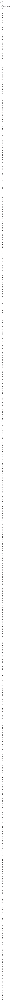

In [5]:
fdff.plot()

In [6]:
stock_symbol_list = fdff.columns.values

## now do experiments

In [7]:
## draw randomly from stock symbol list
for drawnr in range (0,10):
    random_stock_list = list(np.random.choice(stock_symbol_list, 15, replace=False))
    print random_stock_list
    #calculate_portfolio(random_stock_list)

['ALOG', 'SP', 'SWK', 'PRGX', 'CCMP', 'QTM', 'APEI', 'MKC', 'SM', 'CSU', 'BURL', 'FAST', 'CSFL', 'GST', 'SQBG']
['ARAY', 'SPSC', 'EGN', 'AINV', 'CRR', 'BEN', 'PH', 'XEL', 'FISV', 'SRCL', 'REN', 'VDSI', 'KELYA', 'GOV', 'AAP']
['CDNS', 'MANT', 'MPAA', 'ENSG', 'QTS', 'INCY', 'EDR', 'BLX', 'SPWH', 'ORLY', 'HDNG', 'TXT', 'GIII', 'CVA', 'MNRO']
['SWX', 'KTWO', 'UFI', 'AXDX', 'FCNCA', 'LII', 'HRB', 'RBCAA', 'VRTX', 'NNI', 'MRCY', 'MNTX', 'LKQ', 'ERIE', 'UBSI']
['UMH', 'RMTI', 'PERI', 'XRM', 'VOD', 'D', 'CMO', 'CLDT', 'ALEX', 'MKL', 'HBHC', 'BCOR', 'CIX', 'NWLI', 'PBCT']
['EFSC', 'GHC', 'MNST', 'NFG', 'LTC', 'CTG', 'CMRX', 'ALNY', 'GEF', 'TGTX', 'DSW', 'SNSS', 'ADP', 'EGL', 'FF']
['MPC', 'LNT', 'ROST', 'NGS', 'NWN', 'ESNT', 'AIV', 'DRH', 'TROX', 'GERN', 'OXFD', 'CBU', 'TAST', 'EMR', 'CORE']
['HK', 'KBH', 'CRZO', 'FOE', 'HIIQ', 'IMPV', 'HAYN', 'KS', 'MTW', 'PCAR', 'MXL', 'FHN', 'NTRS', 'PDFS', 'IPG']
['CMRX', 'AMTD', 'EXR', 'NATR', 'SSYS', 'AROW', 'FICO', 'TFX', 'GPX', 'TGI', 'RL', 'URG', 'PX',

## do manual tests

['CIM', 'HCP', 'SGMO', 'LSCC', 'CCL']
# 0 , RRDiff: -0.140441322575
['DX', 'TOL', 'WYN', 'AHH', 'INAP']
# 1 , RRDiff: -0.0583529025848
['CALM', 'LWAY', 'JBT', 'PB', 'WGL']
# 2 , RRDiff: 0.00458750529174
['UPL', 'WLTW', 'WTFC', 'CCL', 'LXU']
# 3 , RRDiff: -0.0523788116323
['CHSP', 'CLVS', 'NBTB', 'CBSH', 'IMGN']
# 4 , RRDiff: -0.0375943198156
['TFX', 'LANC', 'CAVM', 'ARC', 'ADMS']
# 5 , RRDiff: -0.0366842220189
['TBBK', 'AIMC', 'AIV', 'FOXF', 'PLOW']
# 6 , RRDiff: -0.00467369798162
['MXL', 'BBT', 'ADTN', 'KAMN', 'BCEI']
# 7 , RRDiff: -0.112531643342
['ETN', 'UEIC', 'CUBI', 'WFC', 'OREX']
# 8 , RRDiff: -0.0361054550141
['NEO', 'IRDM', 'IMI', 'CBT', 'EIGI']
# 9 , RRDiff: -0.0793532664711
['PFG', 'CMA', 'HELE', 'CIX', 'MOSY']
# 10 , RRDiff: -0.143656408779
['WLTW', 'XCRA', 'AAPL', 'LBAI', 'P']
# 11 , RRDiff: -0.0104441259495
['CIEN', 'UPL', 'JAKK', 'TGT', 'IDXX']
# 12 , RRDiff: -0.0700077943635
['LQDT', 'BERY', 'OIS', 'MYGN', 'LVS']
# 13 , RRDiff: 0.0304272198261
['KIM', 'FIX', 'BMS', 'FCN

# 117 , RRDiff: -0.0552793362231
['AGN', 'AGII', 'XNCR', 'ARAY', 'ARW']
# 118 , RRDiff: -0.0635801735778
['CCF', 'CALM', 'BUSE', 'LQDT', 'TBPH']
# 119 , RRDiff: -0.0292833830214
['NSTG', 'RWT', 'CHRW', 'ANGO', 'IBTX']
# 120 , RRDiff: -0.0158733261994
['EPM', 'DLB', 'BLKB', 'MTRX', 'CIT']
# 121 , RRDiff: -0.0160686650634
['ACN', 'FCSC', 'FDP', 'BBT', 'ESGR']
# 122 , RRDiff: -0.0500289746401
['GOOD', 'AME', 'CDE', 'CL', 'AMWD']
# 123 , RRDiff: -0.0324706417202
['NTRS', 'PEIX', 'TRC', 'CPRT', 'DIN']
# 124 , RRDiff: -0.0758308794809
['VFC', 'ZION', 'CSRA', 'COR', 'UMH']
# 125 , RRDiff: 0.049334392679
['ODFL', 'KIN', 'TLYS', 'IMMR', 'FFKT']
# 126 , RRDiff: -0.0630394764461
['WMB', 'AAL', 'GRC', 'LAYN', 'LBY']
# 127 , RRDiff: -0.150031931586
['OMN', 'ESE', 'DRNA', 'AT', 'GBL']
# 128 , RRDiff: -0.117477396853
['LKQ', 'CALM', 'RBCN', 'CSFL', 'HLF']
# 129 , RRDiff: 0.0144087407882
['AT', 'KELYA', 'BECN', 'RMD', 'RHI']
# 130 , RRDiff: -0.0860974861763
['ALE', 'WSO', 'MKC', 'AREX', 'CCRN']
# 131 

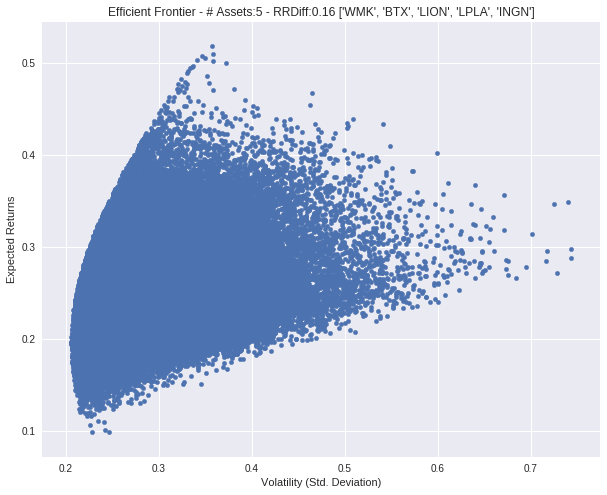

['PRAA', 'MRO', 'MXWL', 'AMCX', 'LRCX']
# 158 , RRDiff: -0.0733271726322
['IPAR', 'DUK', 'ASC', 'CCF', 'CBOE']
# 159 , RRDiff: 0.0188753088098
['AINV', 'HWKN', 'HPE', 'SONC', 'AVEO']
# 160 , RRDiff: -0.0801849636848
['SALT', 'AINV', 'WIFI', 'WPX', 'CUB']
# 161 , RRDiff: -0.0924088592238
['TRC', 'PWOD', 'AAWW', 'GSBD', 'BOOM']
# 162 , RRDiff: -0.0495037343744
['ELGX', 'BOH', 'BA', 'GTY', 'CSCO']
# 163 , RRDiff: -0.0579746214316
['TSLA', 'CPB', 'SNV', 'MGM', 'WMB']
# 164 , RRDiff: -0.0261792355838
['BELFB', 'RSYS', 'DLTR', 'GRC', 'UFS']
# 165 , RRDiff: -0.112890033479
['ULTA', 'PGEM', 'SSTK', 'COLB', 'CBT']
# 166 , RRDiff: -0.0595710111718
['MNTA', 'APTV', 'GOOD', 'MTSC', 'IGT']
# 167 , RRDiff: -0.0853967462595
['IO', 'CSX', 'TRMB', 'CAVM', 'NUAN']
# 168 , RRDiff: -0.0546201984784
['RYN', 'ROG', 'KOP', 'FINL', 'ATEC']
# 169 , RRDiff: -0.105047500921
['MOD', 'SWX', 'MDR', 'SSYS', 'ARRY']
# 170 , RRDiff: -0.0847939769676
['MTSI', 'RGR', 'MANT', 'MMI', 'MDR']
# 171 , RRDiff: -0.018499097203

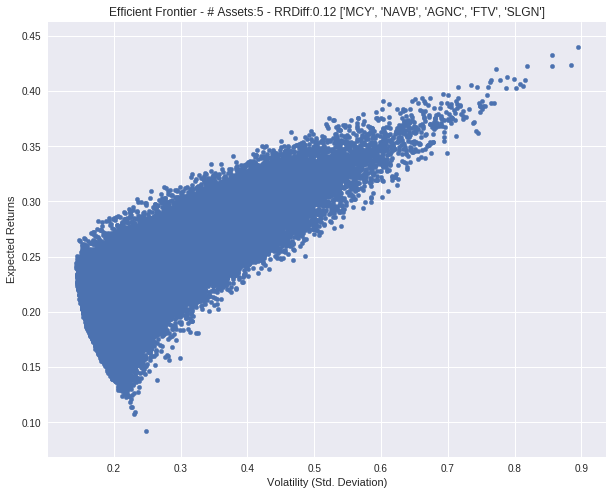

['SPWR', 'DVAX', 'AMED', 'AIG', 'WWD']
# 191 , RRDiff: -0.0704700131726
['TFX', 'ZEN', 'INGR', 'VRTS', 'HNRG']
# 192 , RRDiff: 0.0815163985625
['FSS', 'HRTG', 'DGII', 'EME', 'RGR']
# 193 , RRDiff: -0.0613538709035
['NEON', 'BRS', 'WLL', 'JBSS', 'ACTG']
# 194 , RRDiff: -0.0821235760705
['COTY', 'CUTR', 'CVCO', 'OGE', 'ASTE']
# 195 , RRDiff: -0.0436281933383
['IMGN', 'MAT', 'BMRC', 'PRA', 'TWOU']
# 196 , RRDiff: 0.106569362348


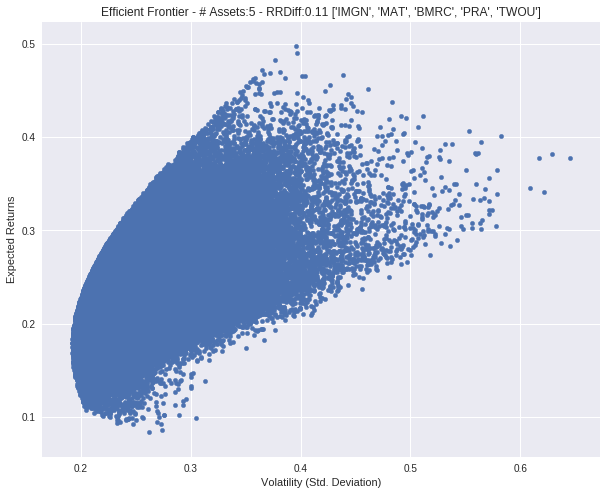

['ABBV', 'CATM', 'HTBK', 'RHI', 'MPW']
# 197 , RRDiff: 0.00216252451167
['BOH', 'DKS', 'RPXC', 'CYTK', 'AEIS']
# 198 , RRDiff: -0.0932027728768
['ANGI', 'GES', 'WAIR', 'SYKE', 'BEAT']
# 199 , RRDiff: -0.112813871495
['MOH', 'LBY', 'NWS', 'TSC', 'SF']
# 200 , RRDiff: -0.0511457652247
['O', 'MKC', 'COG', 'ANH', 'RHI']
# 201 , RRDiff: -0.0221514391535
['INDB', 'CFFI', 'GEOS', 'QUAD', 'TXN']
# 202 , RRDiff: -0.0713506673067
['RFP', 'ADS', 'HOMB', 'FPRX', 'WCG']
# 203 , RRDiff: -0.0246622531373
['PYPL', 'SLG', 'PCG', 'ARW', 'RMAX']
# 204 , RRDiff: 0.0409159927028
['ONB', 'VRNT', 'JW_A', 'LMNR', 'GEF']
# 205 , RRDiff: -0.0831221396501
['P', 'ESNT', 'MTSI', 'BRKS', 'DDD']
# 206 , RRDiff: -0.047835250464
['CSGS', 'TROX', 'HSC', 'PRGS', 'WWD']
# 207 , RRDiff: -0.0934547051229
['AVX', 'YORW', 'QADA', 'DIOD', 'HII']
# 208 , RRDiff: 0.0794573569739
['GBNK', 'MSTR', 'KOPN', 'CTO', 'ABM']
# 209 , RRDiff: -0.137356103249
['ULTI', 'DXC', 'CLDT', 'NSIT', 'CASH']
# 210 , RRDiff: 0.223350569864


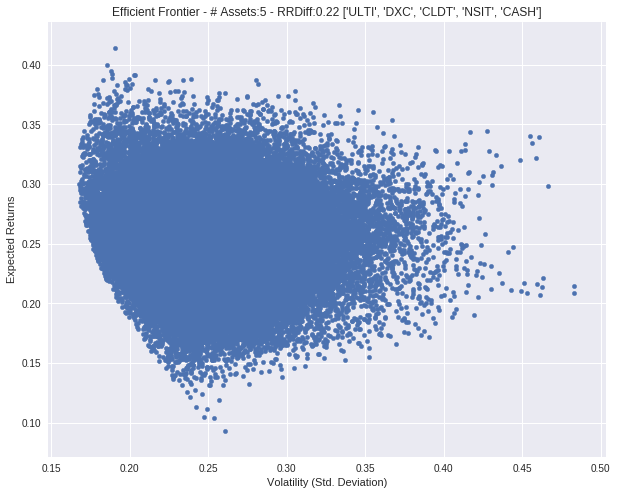

['CCBG', 'CNO', 'KEX', 'CRK', 'HIIQ']
# 211 , RRDiff: -0.0838299421573
['CNO', 'PRIM', 'APA', 'III', 'TRMK']
# 212 , RRDiff: -0.110825007215
['AVAV', 'NJR', 'GBDC', 'FNSR', 'EE']
# 213 , RRDiff: -0.029743361205
['ATLO', 'CSCO', 'ATU', 'NLSN', 'ZAGG']
# 214 , RRDiff: -0.0604121087454
['EBF', 'SVU', 'DHI', 'HCI', 'WRK']
# 215 , RRDiff: -0.0487368106105
['HMSY', 'SF', 'PLUS', 'CRM', 'SMCI']
# 216 , RRDiff: -0.0108520848659
['AMSC', 'CRMT', 'ABAX', 'AFG', 'AT']
# 217 , RRDiff: -0.0642636470389
['NANO', 'ANF', 'NWN', 'UFPI', 'URI']
# 218 , RRDiff: -0.0786112154149
['C', 'AEGN', 'CLVS', 'HTH', 'NTRI']
# 219 , RRDiff: -0.0678807218027
['WABC', 'TRST', 'CPS', 'CMS', 'PRGX']
# 220 , RRDiff: -0.050147494478
['RJF', 'PLAB', 'TK', 'PPBI', 'QUAD']
# 221 , RRDiff: -0.115621380496
['SAM', 'ECOL', 'HELE', 'REV', 'REN']
# 222 , RRDiff: -0.0273892238085
['HAFC', 'CSRA', 'PRFT', 'BDN', 'LNDC']
# 223 , RRDiff: -0.0655704345759
['BHB', 'EQT', 'ASGN', 'OCN', 'FPRX']
# 224 , RRDiff: -0.0467068846288
['ECOL',

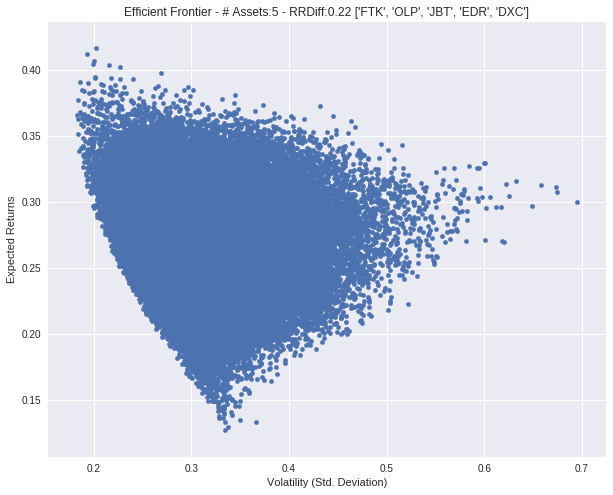

['FLS', 'BMY', 'NOC', 'UTHR', 'CXW']
# 282 , RRDiff: -0.0268845336619
['ATNI', 'FSP', 'SVU', 'BPI', 'DRH']
# 283 , RRDiff: -0.125958823113
['K', 'F', 'SRE', 'UHAL', 'NYRT']
# 284 , RRDiff: -0.0364446322649
['BLMN', 'DVA', 'FCN', 'LPG', 'AVEO']
# 285 , RRDiff: -0.0329843870812
['ELY', 'DIN', 'AINV', 'GMO', 'ITG']
# 286 , RRDiff: -0.177708207717
['NEE', 'OAS', 'TIF', 'FINL', 'DLX']
# 287 , RRDiff: -0.050013063225
['LINC', 'WMC', 'AVHI', 'TDG', 'ENS']
# 288 , RRDiff: 0.00713605388113
['CPSS', 'DF', 'WAGE', 'CVLT', 'ENTR']
# 289 , RRDiff: -0.0121470049124
['HCOM', 'GPX', 'JLL', 'TILE', 'BTU']
# 290 , RRDiff: -0.114683783238
['HAS', 'VC', 'HCKT', 'BOH', 'TRV']
# 291 , RRDiff: -0.0419318115595
['AMC', 'MCC', 'PCH', 'XLNX', 'EROS']
# 292 , RRDiff: -0.113246392487
['OLED', 'LXFT', 'HTGC', 'HBCP', 'BWINB']
# 293 , RRDiff: -0.00119855748682
['RVNC', 'VR', 'MATW', 'AVX', 'RESI']
# 294 , RRDiff: -0.0690678355467
['SCL', 'FLR', 'CVGW', 'CBSH', 'HBAN']
# 295 , RRDiff: -0.0628912966874
['MAS', 'SGEN'

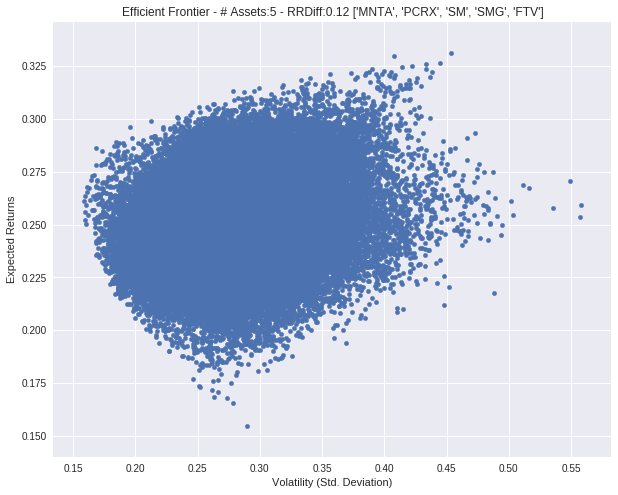

['PLD', 'AVD', 'PNFP', 'ANAT', 'RCII']
# 336 , RRDiff: -0.0817112314517
['OMED', 'CHS', 'NATR', 'ROST', 'LTC']
# 337 , RRDiff: -0.0210913479023
['TESS', 'CTXS', 'CECE', 'COF', 'AHC']
# 338 , RRDiff: -0.104456820852
['SHLM', 'ATU', 'MED', 'DSW', 'GEO']
# 339 , RRDiff: -0.0391122357455
['CMS', 'CTRE', 'RXN', 'YELP', 'RGLD']
# 340 , RRDiff: -0.0447655865052
['DRQ', 'CMCO', 'IRET', 'APC', 'SJW']
# 341 , RRDiff: -0.0992358253818
['EFX', 'MDXG', 'EXPO', 'GLT', 'PRGX']
# 342 , RRDiff: -0.026129571909
['DWSN', 'MKL', 'HR', 'ZEN', 'AMRC']
# 343 , RRDiff: 0.0449019940651
['IRET', 'PATK', 'DCT', 'MOV', 'NSC']
# 344 , RRDiff: -0.082186305256
['TRMB', 'URG', 'CARB', 'SGEN', 'RRD']
# 345 , RRDiff: -0.0762987932523
['NR', 'AREX', 'RPAI', 'AOSL', 'AFH']
# 346 , RRDiff: -0.0463412967257
['IMMR', 'AXAS', 'AYI', 'QNST', 'MINI']
# 347 , RRDiff: -0.086506015542
['FOXA', 'OPK', 'ARII', 'PRA', 'DOC']
# 348 , RRDiff: -0.0395143068135
['AP', 'NHC', 'VOD', 'CTRL', 'AEL']
# 349 , RRDiff: -0.116861841619
['BTU', 

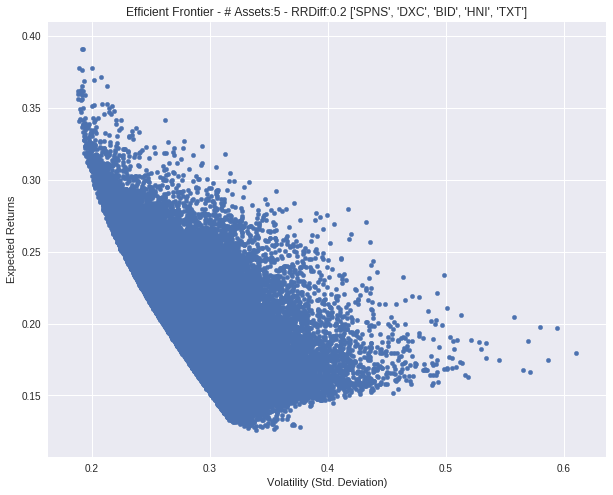

['SNA', 'GD', 'RAD', 'SWX', 'GM']
# 393 , RRDiff: -0.0629160804555
['ARCC', 'DXPE', 'GLUU', 'TNDM', 'EXPE']
# 394 , RRDiff: -0.0989599053964
['SCG', 'YRCW', 'EBAY', 'CTT', 'ROSE']
# 395 , RRDiff: -0.0842006321186
['MED', 'HSTM', 'BKU', 'BLL', 'CA']
# 396 , RRDiff: 0.01480215176
['ASNA', 'Y', 'RH', 'PSEC', 'OIS']
# 397 , RRDiff: -0.0687535004142
['ASNA', 'JWN', 'UTX', 'CLR', 'CHSP']
# 398 , RRDiff: -0.0647327574905
['DVA', 'GSIT', 'EXPE', 'AEO', 'OXY']
# 399 , RRDiff: -0.0577195965949
['SHO', 'FRAN', 'ATEN', 'ADM', 'SATS']
# 400 , RRDiff: -0.148748291318
['ALKS', 'AMTD', 'ENTA', 'SRE', 'BKU']
# 401 , RRDiff: 0.0250360164564
['PG', 'STI', 'IRDM', 'ACAD', 'SHEN']
# 402 , RRDiff: -0.0701222162377
['MKSI', 'BIDU', 'BPTH', 'NFBK', 'EBS']
# 403 , RRDiff: 0.00160822866898
['PEI', 'GTY', 'ACC', 'EMN', 'CNSL']
# 404 , RRDiff: -0.0960515840276
['SAM', 'USAP', 'SALM', 'CTO', 'MTN']
# 405 , RRDiff: -0.0556015212847
['LSTR', 'MSM', 'MODN', 'MXWL', 'SCCO']
# 406 , RRDiff: -0.0333465916768
['EGOV', 'E

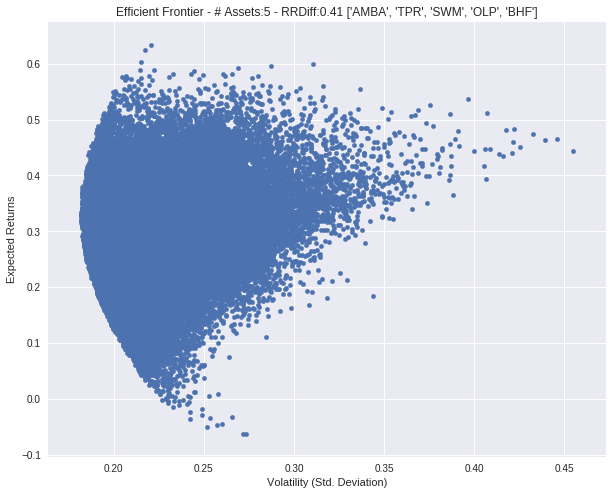

['PNFP', 'ADM', 'BRK_A', 'NAT', 'MTGE']
# 443 , RRDiff: -0.0251488966122
['WMT', 'SRCE', 'AL', 'DHIL', 'AOSL']
# 444 , RRDiff: -0.0704039056486
['JBT', 'RTN', 'MHO', 'BMRC', 'CSU']
# 445 , RRDiff: -0.0373826682812
['KMG', 'LFUS', 'LADR', 'BKCC', 'NLY']
# 446 , RRDiff: -0.0381706429173
['DRI', 'VIVO', 'TGTX', 'SHOO', 'BMI']
# 447 , RRDiff: 0.0312401216986
['WLTW', 'PDFS', 'PMT', 'MYRG', 'FFKT']
# 448 , RRDiff: -0.0330900290481
['NDLS', 'CHE', 'TIF', 'LNDC', 'ALGN']
# 449 , RRDiff: -0.0472945957044
['FFNW', 'UPS', 'TBBK', 'BLK', 'MANT']
# 450 , RRDiff: -0.0579229908233
['LH', 'TFX', 'X', 'ACET', 'TISI']
# 451 , RRDiff: -0.0156911817195
['PJC', 'ACM', 'CMCO', 'ECL', 'MWA']
# 452 , RRDiff: -0.089131184055
['RAIL', 'PCTI', 'BP', 'UHT', 'FVE']
# 453 , RRDiff: -0.0939172984513
['MDSO', 'MEI', 'ENPH', 'RGA', 'RF']
# 454 , RRDiff: -0.0231146305773
['ATRC', 'OHI', 'BCO', 'LZB', 'FELE']
# 455 , RRDiff: -0.10485813733
['ETR', 'PF', 'URI', 'SBH', 'AVNW']
# 456 , RRDiff: 0.025468430857
['DRE', 'BREW

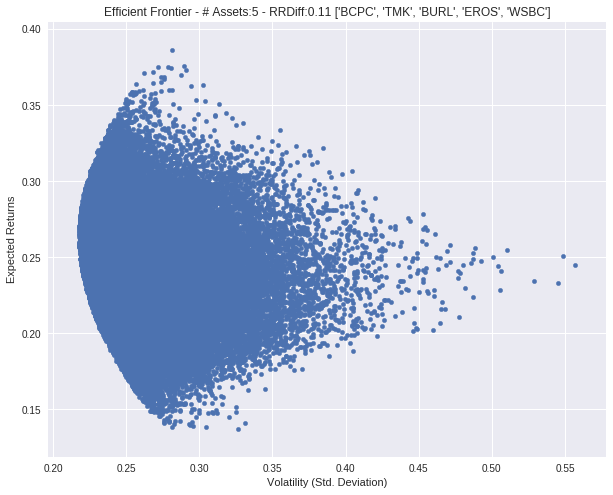

['LFVN', 'M', 'PE', 'SHW', 'MACK']
# 470 , RRDiff: -0.0558568876841
['VIVO', 'RDNT', 'LXFT', 'SHEN', 'SNA']
# 471 , RRDiff: 0.00940707855462
['EPAY', 'CMCO', 'BFS', 'TIS', 'FTK']
# 472 , RRDiff: -0.0835409515277
['NUAN', 'CTL', 'SGYP', 'GCAP', 'RXN']
# 473 , RRDiff: -0.0984621518728
['TRXC', 'CVCO', 'HI', 'SXC', 'FITB']
# 474 , RRDiff: -0.0327901283513
['OSTK', 'GPOR', 'IDA', 'BEN', 'ZBRA']
# 475 , RRDiff: -0.0611723219224
['DOX', 'CXO', 'SJI', 'YUM', 'HIG']
# 476 , RRDiff: -0.0243616795798
['LPI', 'HBNC', 'MKTX', 'MOV', 'DXPE']
# 477 , RRDiff: -0.000415346157487
['LWAY', 'NEOG', 'PSX', 'MOG_A', 'HLT']
# 478 , RRDiff: 0.0771213146666
['ATU', 'BA', 'PDCE', 'AMZN', 'UAA']
# 479 , RRDiff: -0.0425382884716
['SONC', 'MDSO', 'NKTR', 'NEM', 'UTI']
# 480 , RRDiff: -0.0319392337017
['UHT', 'LUB', 'XONE', 'TNET', 'PFPT']
# 481 , RRDiff: 0.0607814012753
['TER', 'PETS', 'DLX', 'DENN', 'OMEX']
# 482 , RRDiff: -0.0434912332452
['COUP', 'NKE', 'RTEC', 'JBT', 'SLRC']
# 483 , RRDiff: 0.026168358832
['I

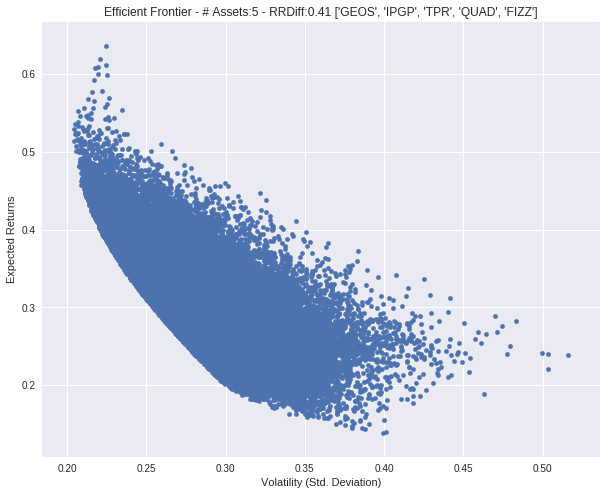

['CMI', 'PDM', 'CAC', 'ECHO', 'FRO']
# 503 , RRDiff: -0.0641609894053
['LNC', 'AEL', 'PES', 'TWX', 'LPLA']
# 504 , RRDiff: -0.0987260763783
['DPS', 'SYNA', 'HALO', 'TK', 'ANAT']
# 505 , RRDiff: -0.0191263875774
['ZBRA', 'MEI', 'TLYS', 'BDGE', 'EBS']
# 506 , RRDiff: -0.0614404604925
['MATX', 'HALL', 'TRST', 'MBI', 'DHT']
# 507 , RRDiff: -0.158456882592
['AVT', 'CIM', 'WAGE', 'BOFI', 'LXFT']
# 508 , RRDiff: 0.00823054508651
['X', 'QUIK', 'TZOO', 'GEOS', 'SEM']
# 509 , RRDiff: -0.119351334203
['JBLU', 'TFX', 'CMP', 'PH', 'MBI']
# 510 , RRDiff: -0.0632500851421
['AL', 'HK', 'VSI', 'IPCC', 'DLX']
# 511 , RRDiff: -0.0759857126058
['HMN', 'GNTX', 'PENN', 'FFIC', 'SYMC']
# 512 , RRDiff: -0.0473424827262
['SYKE', 'UFPT', 'HMST', 'TTEK', 'MAN']
# 513 , RRDiff: -0.0293927736727
['AMRC', 'AGN', 'ZGNX', 'LUV', 'NVAX']
# 514 , RRDiff: -0.0852994280835
['MITK', 'HTZ', 'HLT', 'GNC', 'DAKT']
# 515 , RRDiff: 0.0814045835945
['NVDA', 'HF', 'ACTG', 'DHT', 'EAT']
# 516 , RRDiff: -0.056785740211
['HK', 'ASG

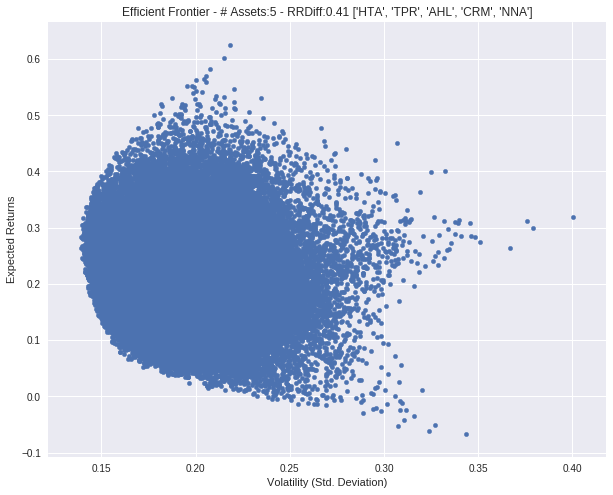

['CIT', 'TRMB', 'BDC', 'NEU', 'JKHY']
# 535 , RRDiff: -0.0504176032246
['CI', 'RNR', 'CRMT', 'AXDX', 'NFLX']
# 536 , RRDiff: 0.0502159247178
['FFBC', 'PH', 'IVR', 'CMI', 'STMP']
# 537 , RRDiff: -0.0317237102889
['NRG', 'UIHC', 'HIIQ', 'ABM', 'H']
# 538 , RRDiff: -0.024663449234
['CGNX', 'CCXI', 'BDC', 'CHKP', 'RMD']
# 539 , RRDiff: -0.0541173956737
['NAV', 'FFNW', 'JOUT', 'SKYW', 'WASH']
# 540 , RRDiff: -0.102120162916
['EDR', 'XOXO', 'WTR', 'ANSS', 'L']
# 541 , RRDiff: -0.0362091753592
['LKFN', 'ASNA', 'MAIN', 'UDR', 'PROV']
# 542 , RRDiff: -0.0203189313936
['BERY', 'NWLI', 'NETE', 'PNK', 'HRTG']
# 543 , RRDiff: 0.0947927936704
['SIGA', 'FIVN', 'HCC', 'RBCAA', 'LXU']
# 544 , RRDiff: 0.0766525562278
['AGCO', 'HTA', 'ROST', 'WYN', 'SYMC']
# 545 , RRDiff: -0.00906628398255
['ADM', 'HRL', 'SUPN', 'ALNY', 'OII']
# 546 , RRDiff: 0.0300294187721
['RTIX', 'TTS', 'BC', 'URG', 'WGL']
# 547 , RRDiff: -0.0929188183435
['NWS', 'BID', 'DCT', 'BMY', 'FIBK']
# 548 , RRDiff: -0.0655218382481
['MGLN', 

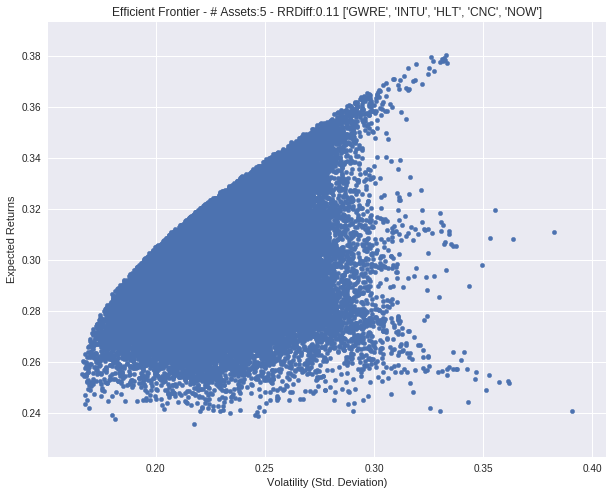

['BRT', 'ECL', 'FWRD', 'CAH', 'TSN']
# 573 , RRDiff: -0.0459886022417
['ENT', 'JBL', 'EPZM', 'ALKS', 'USLM']
# 574 , RRDiff: -0.104637324602
['MPAA', 'KBH', 'MRK', 'ECOM', 'KRC']
# 575 , RRDiff: -0.0991899949755
['RST', 'BMRN', 'SFNC', 'MDT', 'RSG']
# 576 , RRDiff: -0.0808284415712
['JBL', 'TBPH', 'PII', 'EHTH', 'BEN']
# 577 , RRDiff: -0.107184527993
['ATSG', 'VOD', 'DRE', 'PDM', 'RP']
# 578 , RRDiff: -0.0306199719535
['CHRW', 'OMI', 'HRS', 'CPA', 'VCYT']
# 579 , RRDiff: -0.0473773458402
['SPB', 'BRKR', 'UPL', 'BRKS', 'LMNX']
# 580 , RRDiff: -0.0362000484794
['HAFC', 'XRM', 'ROG', 'COF', 'ATLO']
# 581 , RRDiff: -0.140687618219
['DRH', 'BLKB', 'PRFT', 'IRBT', 'AAMC']
# 582 , RRDiff: 0.0143851680684
['GGG', 'CCBG', 'SUN', 'K', 'PDFS']
# 583 , RRDiff: -0.0551039701239
['EFII', 'NWY', 'TMK', 'EV', 'CVG']
# 584 , RRDiff: -0.119415231779
['MET', 'AEO', 'CBK', 'SALT', 'ELY']
# 585 , RRDiff: -0.152538016573
['THR', 'KODK', 'AAOI', 'FARO', 'UHT']
# 586 , RRDiff: -0.0217347785191
['FSP', 'KLAC',

/home/xxx/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:45: RuntimeWarning: invalid value encountered in sqrt


# 635 , RRDiff: 0.305331890641


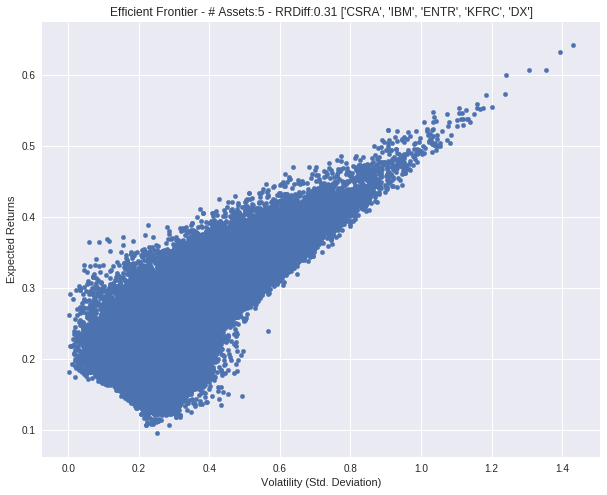

['RNG', 'CBZ', 'LH', 'NTGR', 'CL']
# 636 , RRDiff: 0.0334801815884
['TOL', 'WM', 'LMNR', 'NEON', 'MITT']
# 637 , RRDiff: -0.0344757997229
['FITB', 'GM', 'HWKN', 'MAT', 'VMC']
# 638 , RRDiff: -0.11342619371
['RTRX', 'BKU', 'ZEN', 'EIX', 'MKSI']
# 639 , RRDiff: 0.0993233511793
['EW', 'CUR', 'ATVI', 'ARQL', 'BBX']
# 640 , RRDiff: -0.00563699206344
['PNK', 'NTGR', 'DLX', 'CRAY', 'SF']
# 641 , RRDiff: -0.0998207335013
['MSTR', 'CAR', 'MDT', 'SMTC', 'PGC']
# 642 , RRDiff: -0.103683623002
['ADTN', 'CIM', 'TAL', 'MGM', 'FNF']
# 643 , RRDiff: 0.0496273242555
['BEAT', 'CONN', 'LYB', 'LDOS', 'RGA']
# 644 , RRDiff: -0.00610452243923
['FMC', 'TDG', 'NSTG', 'KAI', 'LLY']
# 645 , RRDiff: 0.00374234245828
['REG', 'FNB', 'RYN', 'XL', 'MPX']
# 646 , RRDiff: -0.116412202463
['MGM', 'MMS', 'TDY', 'MRO', 'TFX']
# 647 , RRDiff: -0.0556698771436
['MSA', 'WU', 'RGR', 'RRC', 'LE']
# 648 , RRDiff: -0.0791968266914
['GRMN', 'WSTL', 'ESGR', 'OCLR', 'MFA']
# 649 , RRDiff: -0.0463809945536
['PETS', 'FTI', 'PCRX', '

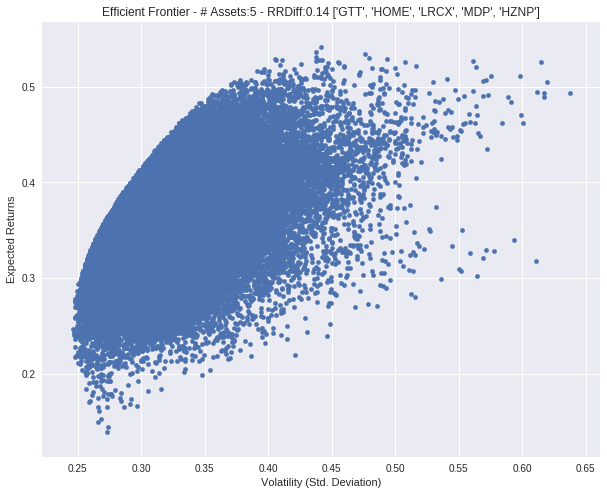

['BELFB', 'HAYN', 'GNRC', 'ALKS', 'KFRC']
# 667 , RRDiff: -0.0626461844568
['KAMN', 'EXLS', 'AYR', 'STAR', 'PPBI']
# 668 , RRDiff: -0.117649095817
['JPM', 'CNSL', 'CBB', 'BBX', 'MNI']
# 669 , RRDiff: -0.168114406928
['AGTC', 'OHI', 'CERS', 'NDLS', 'LXRX']
# 670 , RRDiff: -0.216810883152
['HCA', 'IO', 'LEA', 'WMT', 'BCO']
# 671 , RRDiff: 0.0233208697824
['ERA', 'CTBI', 'MON', 'OXY', 'GRUB']
# 672 , RRDiff: 0.0144532561845
['DISH', 'TRUE', 'AKRX', 'PNC', 'F']
# 673 , RRDiff: -0.0396887183044
['EBIO', 'OREX', 'OAS', 'MRK', 'MG']
# 674 , RRDiff: -0.145774919507
['NNA', 'XON', 'AREX', 'KIM', 'SENEA']
# 675 , RRDiff: -0.147191076069
['NFX', 'SGEN', 'VRSN', 'AMAT', 'SCCO']
# 676 , RRDiff: -0.0510219929719
['CYH', 'CHGG', 'WINA', 'SYF', 'AKR']
# 677 , RRDiff: -0.00720113121879
['NI', 'SEIC', 'WHF', 'P', 'THG']
# 678 , RRDiff: -0.0563368883777
['XEC', 'IRM', 'LLNW', 'CFFN', 'CVGI']
# 679 , RRDiff: -0.0455650219267
['ECL', 'AMSC', 'SPNS', 'OPHT', 'SRCE']
# 680 , RRDiff: -0.0845227192364
['AMT', 

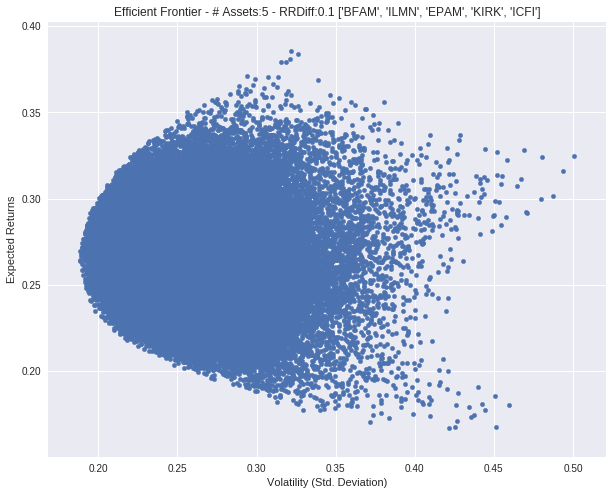

['CUTR', 'AMG', 'SWX', 'ITIC', 'WAFD']
# 699 , RRDiff: -0.0447227756766
['LII', 'CLNE', 'CMC', 'NL', 'VNO']
# 700 , RRDiff: -0.0965856562818
['PES', 'ZUMZ', 'JLL', 'CFFN', 'NEON']
# 701 , RRDiff: -0.0350791158746
['CLI', 'AXAS', 'BLMN', 'BIIB', 'UTMD']
# 702 , RRDiff: 0.00806275645796
['HEAR', 'NUE', 'MASI', 'CRI', 'CVEO']
# 703 , RRDiff: -0.0549190496813
['MLHR', 'PACB', 'DXCM', 'ESL', 'MAT']
# 704 , RRDiff: -0.141012207468
['BLL', 'TAHO', 'F', 'PJC', 'BBX']
# 705 , RRDiff: -0.0824008687594
['UBA', 'BMY', 'NDLS', 'ARR', 'CSRA']
# 706 , RRDiff: -0.0554926153113
['RHP', 'AES', 'MNTA', 'EGN', 'TECD']
# 707 , RRDiff: -0.11658464317
['MBI', 'IT', 'FLT', 'NUS', 'BKU']
# 708 , RRDiff: 0.0302052290718
['CLVS', 'HON', 'NVR', 'SAIA', 'CMP']
# 709 , RRDiff: 0.0245201510953
['RRD', 'TREC', 'PCAR', 'AWI', 'TXN']
# 710 , RRDiff: -0.0743363094894
['PAY', 'CBT', 'CROX', 'SHLO', 'CELG']
# 711 , RRDiff: -0.0430691789293
['ANGO', 'INTX', 'GNMK', 'CA', 'AWK']
# 712 , RRDiff: -0.0240437702625
['MLR', 'GCA

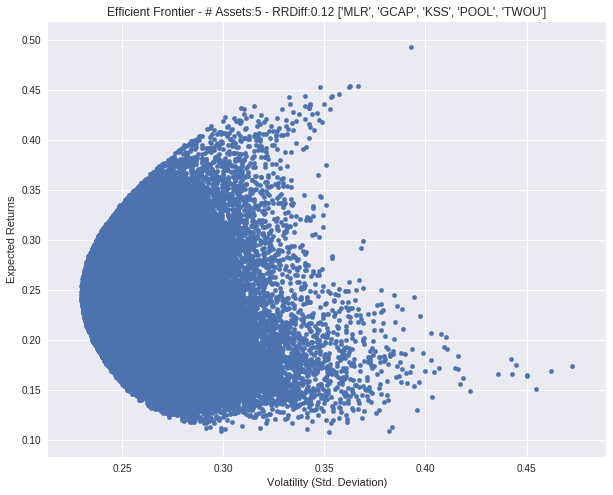

['CIEN', 'BDGE', 'INTX', 'INN', 'RTN']
# 714 , RRDiff: -0.0683200790304
['OGS', 'KNX', 'IO', 'BSRR', 'NYT']
# 715 , RRDiff: 0.0250847652857
['GPN', 'THS', 'SBNY', 'PACW', 'PRSC']
# 716 , RRDiff: -0.024006106254
['MPWR', 'THFF', 'GPS', 'SPR', 'SEE']
# 717 , RRDiff: -0.09696474804
['SM', 'SYF', 'IT', 'SFE', 'TTS']
# 718 , RRDiff: -0.0812800604966
['PENN', 'CTRL', 'ROCK', 'KW', 'ARWR']
# 719 , RRDiff: -0.0117786921538
['TUP', 'MRC', 'VICL', 'VRSK', 'GSBD']
# 720 , RRDiff: -0.00212428078898
['UGI', 'HR', 'ZBRA', 'LCNB', 'CUZ']
# 721 , RRDiff: -0.0338178966849
['NOW', 'PAY', 'CPF', 'DATA', 'CHCO']
# 722 , RRDiff: 0.0176301765538
['CCOI', 'AMPE', 'APAM', 'CELG', 'AMCX']
# 723 , RRDiff: -0.0047827656112
['SPR', 'SVVC', 'LSCC', 'SPNS', 'GBX']
# 724 , RRDiff: -0.13386856325
['GTS', 'NDAQ', 'APC', 'WCG', 'HAFC']
# 725 , RRDiff: -0.0851213182319
['M', 'SD', 'MS', 'BRKS', 'WSFS']
# 726 , RRDiff: -0.133473373123
['ECPG', 'LINC', 'SAIC', 'ENSG', 'MAN']
# 727 , RRDiff: 0.0126760153979
['WBS', 'EROS',

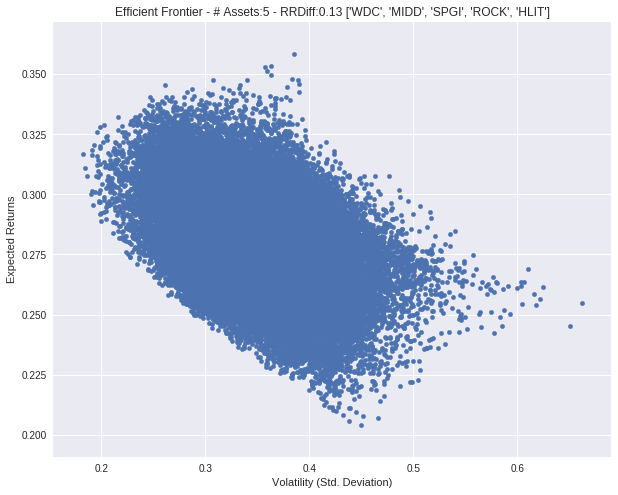

['INN', 'STNG', 'VRTX', 'CUB', 'BC']
# 751 , RRDiff: -0.0718949538975
['CNO', 'BOFI', 'EAT', 'NEWM', 'NPK']
# 752 , RRDiff: 0.00121153610714
['PWOD', 'CYH', 'AGYS', 'BELFB', 'TRK']
# 753 , RRDiff: -0.14262742525
['VRNS', 'NANO', 'TROX', 'LL', 'BC']
# 754 , RRDiff: -0.102781272963
['CBB', 'KFRC', 'VMI', 'IBKR', 'MDT']
# 755 , RRDiff: -0.0923861899282
['PH', 'VPG', 'IIVI', 'KNX', 'SAVE']
# 756 , RRDiff: -0.0324174798474
['MCD', 'SIR', 'ACHN', 'PICO', 'CHMG']
# 757 , RRDiff: -0.0412409516845
['MDR', 'CHSP', 'ATNM', 'PZN', 'NTAP']
# 758 , RRDiff: -0.0870569364531
['LHO', 'FIS', 'CUR', 'BPI', 'FDUS']
# 759 , RRDiff: -0.0716689659254
['FWRD', 'GTXI', 'AAPL', 'AGII', 'MDLZ']
# 760 , RRDiff: -0.0214657313861
['JOUT', 'CTSH', 'MGNX', 'CNMD', 'NPTN']
# 761 , RRDiff: -0.0409762728859
['IR', 'AAP', 'CKH', 'SIRI', 'TNAV']
# 762 , RRDiff: -0.0828077244456
['CVI', 'HRC', 'AT', 'ACTG', 'UA']
# 763 , RRDiff: -0.134128073438
['MGRC', 'HRB', 'RCL', 'AEGN', 'ETR']
# 764 , RRDiff: -0.0705628271305
['PCYG',

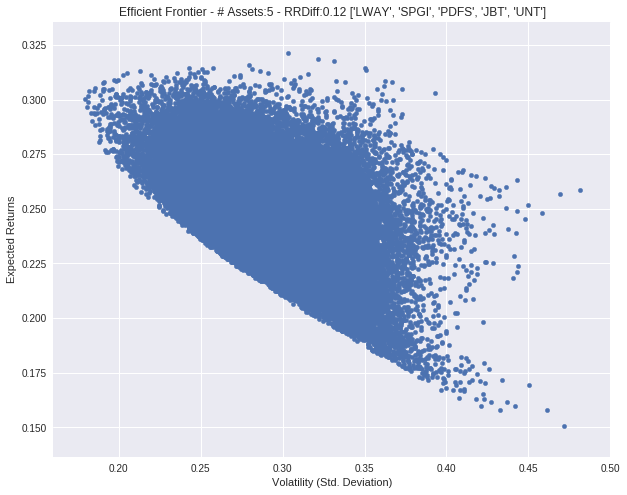

['CTIC', 'BRO', 'SCSC', 'PRO', 'SEB']
# 802 , RRDiff: -0.0492416668324
['BIOL', 'UVE', 'POST', 'MAA', 'WWW']
# 803 , RRDiff: 0.0585444271621
['WLK', 'IPI', 'TFX', 'ASPS', 'MCK']
# 804 , RRDiff: -0.0335841580048
['PPG', 'CMRX', 'CCO', 'AFSI', 'AEP']
# 805 , RRDiff: -0.0801627621074
['PFMT', 'NUS', 'BDSI', 'SPNS', 'ESCA']
# 806 , RRDiff: -0.10082678999
['XRAY', 'FARO', 'FIX', 'TTS', 'CYTX']
# 807 , RRDiff: -0.0811221514443
['DE', 'WFC', 'AA', 'NJR', 'MSEX']
# 808 , RRDiff: 0.15195835678


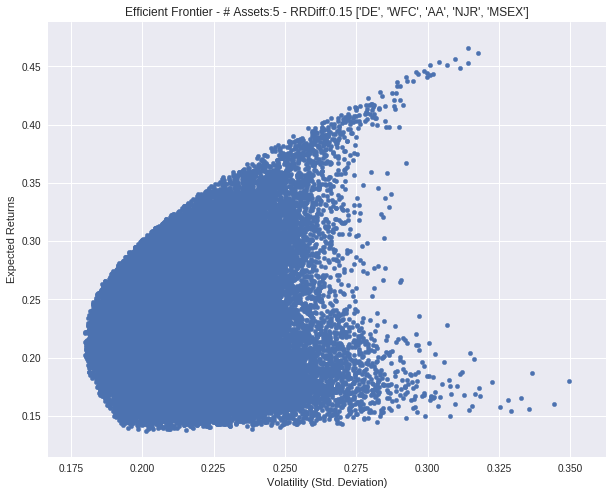

['COP', 'III', 'TRUE', 'SCM', 'MDXG']
# 809 , RRDiff: -0.0631139853058
['SCVL', 'GLRE', 'TAP', 'PRKR', 'S']
# 810 , RRDiff: -0.125313930954
['WTI', 'NWY', 'EGLT', 'NEM', 'AMRS']
# 811 , RRDiff: -0.233098434971
['ITT', 'CNS', 'SREV', 'PRGS', 'OZRK']
# 812 , RRDiff: -0.0585661844095
['CUTR', 'MCHX', 'TYPE', 'BRS', 'ZEN']
# 813 , RRDiff: 0.0114777105177
['FDUS', 'LYB', 'INTX', 'SGEN', 'EFSC']
# 814 , RRDiff: -0.0107736485182
['AREX', 'ESNT', 'RSPP', 'BPFH', 'SDRL']
# 815 , RRDiff: -0.0478528282763
['FFIN', 'MNTX', 'DEI', 'FDS', 'SIF']
# 816 , RRDiff: -0.0527707991826
['CEVA', 'EA', 'WOR', 'AVGO', 'HPQ']
# 817 , RRDiff: 0.0440165980972
['CSRA', 'TTEK', 'DATA', 'PFIS', 'STRT']
# 818 , RRDiff: -0.0508668470637
['TTI', 'GOOG', 'EZPW', 'GOV', 'ANAT']
# 819 , RRDiff: -0.0277333479976
['CERS', 'LOPE', 'TTGT', 'PBH', 'NXST']
# 820 , RRDiff: -0.0168778163526
['DEI', 'ALGT', 'WEN', 'LEG', 'ESE']
# 821 , RRDiff: -0.0631332640959
['VRTS', 'LGND', 'BFS', 'HRL', 'SJM']
# 822 , RRDiff: 0.00344710396164


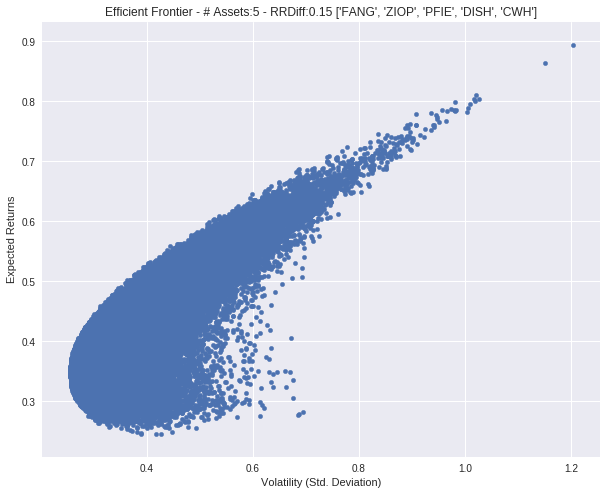

['CCL', 'KNX', 'SBSI', 'RGLS', 'CORE']
# 847 , RRDiff: -0.0746619710042
['AON', 'HBHC', 'RGA', 'INSM', 'PETX']
# 848 , RRDiff: -0.0772696624466
['KWR', 'VRTS', 'AMCX', 'ITRI', 'ELLI']
# 849 , RRDiff: 0.0819211564353
['MN', 'VECO', 'CHE', 'IMMR', 'FCNCA']
# 850 , RRDiff: -0.068169544751
['THO', 'DSPG', 'KORS', 'SIGI', 'ASPS']
# 851 , RRDiff: -0.0171409582414
['QTS', 'RAVN', 'VRX', 'WAGE', 'COBZ']
# 852 , RRDiff: 0.020875870254
['NES', 'CSU', 'OGE', 'ACLS', 'FELE']
# 853 , RRDiff: -0.0881026669052
['RESI', 'SBUX', 'BLK', 'ESRX', 'PLAB']
# 854 , RRDiff: -0.0207485192261
['WHF', 'HZO', 'ARQL', 'RM', 'SYF']
# 855 , RRDiff: -0.0414865976721
['RHP', 'HUM', 'DEPO', 'WRI', 'JMBA']
# 856 , RRDiff: -0.0958262557528
['Y', 'NNI', 'CLH', 'HPE', 'AINV']
# 857 , RRDiff: -0.057078613276
['AMBC', 'PZG', 'TNC', 'ACHC', 'ZTS']
# 858 , RRDiff: 0.0140801363699
['GBLI', 'NCLH', 'TPH', 'PKE', 'RDI']
# 859 , RRDiff: -0.0659227931332
['FFG', 'FNSR', 'PFG', 'RUTH', 'SNMX']
# 860 , RRDiff: -0.195756263302
['AVT',

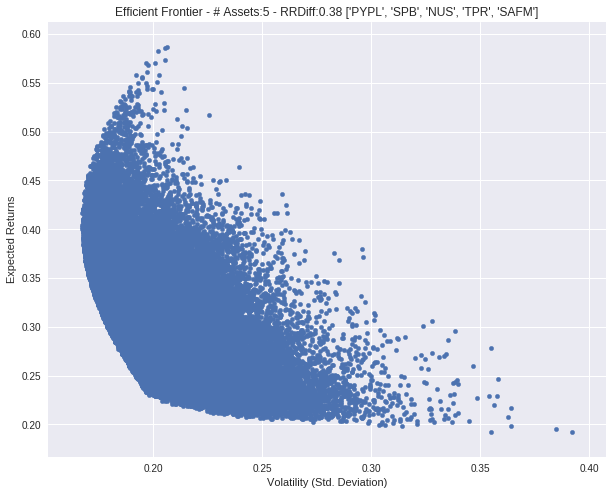

['CXW', 'ACTG', 'NEOG', 'AZO', 'ABMD']
# 905 , RRDiff: 0.00415174967396
['HY', 'FLS', 'CNO', 'SAM', 'PTCT']
# 906 , RRDiff: -0.00455533343195
['KPTI', 'IBTX', 'HOS', 'GHC', 'SLCA']
# 907 , RRDiff: -0.0510967029498
['TCRD', 'USG', 'LOW', 'ALL', 'BANF']
# 908 , RRDiff: -0.0780957324145
['GRIF', 'CBM', 'CPLA', 'DF', 'COF']
# 909 , RRDiff: -0.103000153729
['AKS', 'NOG', 'APAM', 'EPM', 'INTC']
# 910 , RRDiff: -0.100269992642
['FRME', 'CHSP', 'CBM', 'ORIT', 'WWW']
# 911 , RRDiff: -0.0891492575181
['TRK', 'LMNX', 'AGTC', 'AOI', 'CVS']
# 912 , RRDiff: -0.149195755595
['CHDN', 'TRN', 'FLDM', 'JBL', 'VVUS']
# 913 , RRDiff: -0.127652683006
['HDNG', 'UBSI', 'CLD', 'WAT', 'UAA']
# 914 , RRDiff: -0.0935871500262
['FAST', 'MAR', 'ABAX', 'IRM', 'KSU']
# 915 , RRDiff: -0.0312737714599
['PSB', 'DAR', 'IRWD', 'Z', 'ECYT']
# 916 , RRDiff: 0.0408755530893
['KAI', 'GORO', 'SCHL', 'LL', 'REN']
# 917 , RRDiff: -0.0985005226873
['SKYW', 'GPX', 'AHL', 'HTZ', 'IVAC']
# 918 , RRDiff: -0.124591643194
['HSII', 'ALG

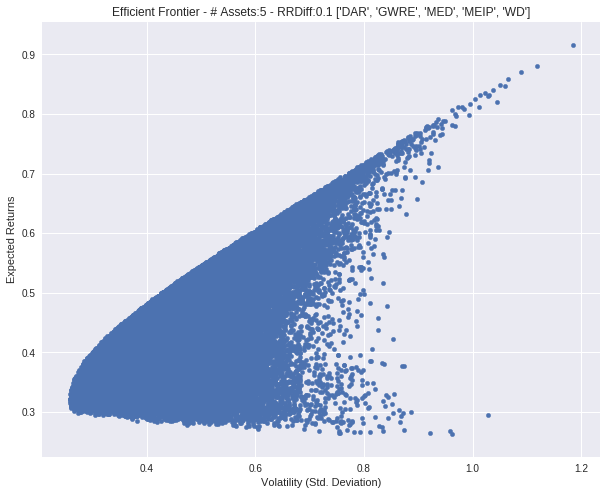

['AREX', 'DHT', 'AP', 'BFIN', 'OXM']
# 936 , RRDiff: -0.174410560492
['SGEN', 'LHO', 'DGICA', 'SMG', 'DLX']
# 937 , RRDiff: -0.0860453001033
['AAN', 'CATM', 'HOME', 'WEX', 'TXRH']
# 938 , RRDiff: 0.0890371093369
['CSBK', 'LINC', 'CHD', 'BRKR', 'PCH']
# 939 , RRDiff: -0.0450677772689
['AREX', 'SCL', 'WERN', 'ANF', 'EGHT']
# 940 , RRDiff: -0.0787806222716
['PHM', 'TAST', 'EBIO', 'HTBI', 'SAMG']
# 941 , RRDiff: -0.0060688417811
['UFPI', 'CUB', 'CAH', 'OLP', 'TBBK']
# 942 , RRDiff: -0.0806423399338
['EVR', 'HOLX', 'AGCO', 'KOP', 'TIF']
# 943 , RRDiff: -0.0789641356187
['XRM', 'UBA', 'VPG', 'SKYW', 'IQV']
# 944 , RRDiff: -0.114850035316
['ENTR', 'PNW', 'MMC', 'INTC', 'TMP']
# 945 , RRDiff: -0.061380814735
['MAIN', 'AMKR', 'FBP', 'AAN', 'BWINB']
# 946 , RRDiff: -0.0332050857404
['DIS', 'PSMT', 'NWS', 'REG', 'RVNC']
# 947 , RRDiff: -0.0779063030209
['WEYS', 'KLAC', 'SHO', 'FDP', 'HTBK']
# 948 , RRDiff: -0.106876088696
['HAIN', 'KND', 'RECN', 'SEMG', 'BDGE']
# 949 , RRDiff: -0.10468217837
['MD

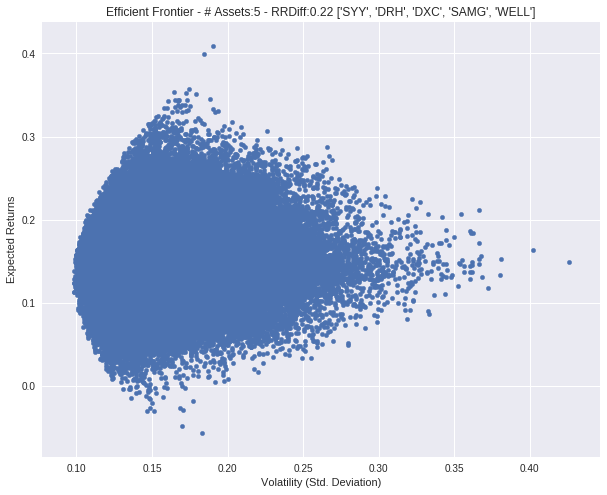

['NEOG', 'EXPR', 'HPP', 'GST', 'BEN']
# 965 , RRDiff: -0.0496693902847
['NP', 'H', 'MLHR', 'SPB', 'CACC']
# 966 , RRDiff: -0.00287361052358
['INSY', 'KSS', 'DST', 'NRZ', 'ESRT']
# 967 , RRDiff: -0.0163861774867
['NSP', 'WLH', 'CTG', 'WDFC', 'BKD']
# 968 , RRDiff: -0.091490565821
['ETFC', 'CARB', 'BHE', 'PCG', 'CSGP']
# 969 , RRDiff: -0.0613870959693
['MNTX', 'NTRI', 'EXC', 'UDR', 'WINA']
# 970 , RRDiff: -0.0295744242099
['MNKD', 'SCS', 'TROX', 'GSIT', 'ANGI']
# 971 , RRDiff: -0.140594669991
['DEI', 'GIS', 'LLY', 'PRFT', 'DK']
# 972 , RRDiff: -0.0624764349335
['AWK', 'GLF', 'BK', 'CRR', 'LII']
# 973 , RRDiff: -0.0105825334844
['ADMS', 'NSM', 'BIOS', 'HT', 'SPNS']
# 974 , RRDiff: -0.0958888998379
['BBY', 'FITB', 'LAD', 'HMTV', 'KWR']
# 975 , RRDiff: -0.0795062523365
['RTN', 'ZEN', 'LEE', 'ITT', 'HLIT']
# 976 , RRDiff: 0.0131691016858
['BANR', 'MNRO', 'VPG', 'THFF', 'AP']
# 977 , RRDiff: -0.0923804409446
['RAD', 'LEG', 'FLDM', 'LOW', 'PETS']
# 978 , RRDiff: -0.0862624322208
['NUS', 'CY', 

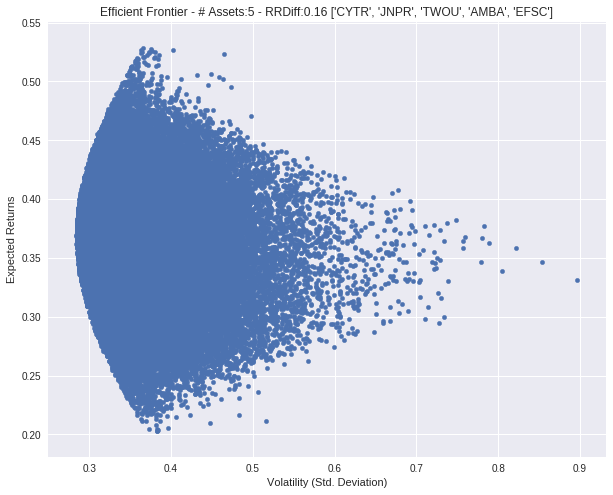

['BPI', 'MORN', 'SWKS', 'SMTC', 'ICPT']
# 991 , RRDiff: -0.0513687801779
['TAP', 'COHR', 'LSTR', 'SNCR', 'CMO']
# 992 , RRDiff: -0.0386770091912
['AKAO', 'AIG', 'CY', 'MKTX', 'ARCW']
# 993 , RRDiff: -0.0415508325711
['ECHO', 'LII', 'FBHS', 'ACTG', 'SSP']
# 994 , RRDiff: 0.0149034803885
['UAL', 'ZTS', 'RDNT', 'SBUX', 'CLGX']
# 995 , RRDiff: 0.0471950452832
['MRTN', 'CWT', 'PFBC', 'WNC', 'SRI']
# 996 , RRDiff: -0.0815544083259
['PERI', 'WMT', 'KEY', 'EXPR', 'IPHS']
# 997 , RRDiff: -0.103840203465
['HUM', 'YUM', 'JPM', 'AFG', 'OREX']
# 998 , RRDiff: -0.0592999147369
['ECYT', 'CCXI', 'WBA', 'RUBI', 'UTHR']
# 999 , RRDiff: -0.0643665875555
['AME', 'BDN', 'CPE', 'CCK', 'DHI']
# 1000 , RRDiff: -0.062317180905
['EGHT', 'MTX', 'UHAL', 'PENN', 'DPS']
# 1001 , RRDiff: 0.0211821785324
['SON', 'BHE', 'FNHC', 'AMNB', 'GERN']
# 1002 , RRDiff: -0.0670159267346
['SYNA', 'PRFT', 'RAIL', 'WSBC', 'LORL']
# 1003 , RRDiff: -0.116113627222
['JBT', 'FIVN', 'MCC', 'GT', 'HPE']
# 1004 , RRDiff: 0.0532159962372


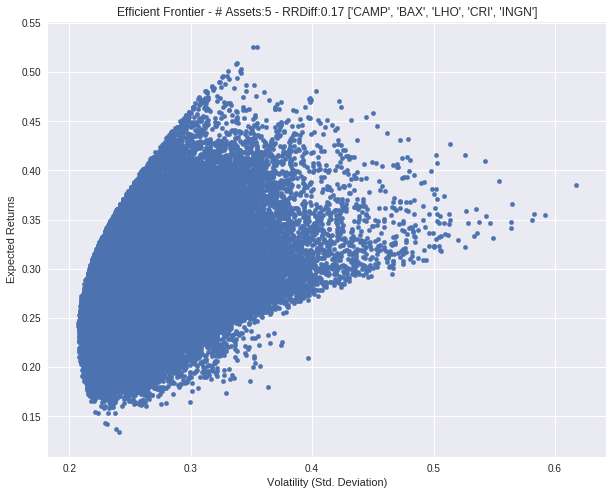

['TNC', 'VFC', 'CRAI', 'MRIN', 'DBD']
# 1043 , RRDiff: -0.092852969759
['COLB', 'DGICA', 'MDR', 'LUV', 'VRNT']
# 1044 , RRDiff: -0.0938551490782
['STI', 'JPM', 'STAA', 'NTAP', 'DF']
# 1045 , RRDiff: -0.139242732226
['PB', 'BURL', 'OCLR', 'JNJ', 'TTPH']
# 1046 , RRDiff: 0.0875485536462
['BRSS', 'ULTI', 'LMT', 'LPI', 'AVGO']
# 1047 , RRDiff: 0.0785392618923
['LSCC', 'CRAI', 'PEBO', 'NMFC', 'VTNR']
# 1048 , RRDiff: 0.00720681115208
['BLK', 'TAST', 'AKAM', 'OGE', 'CUBI']
# 1049 , RRDiff: 0.00109390512166
['DAKT', 'BTX', 'PQ', 'IMI', 'PERI']
# 1050 , RRDiff: -0.171297498114
['GWRE', 'GOOD', 'MDC', 'ISCA', 'DO']
# 1051 , RRDiff: -0.011996531301
['PLT', 'FLIC', 'SYNA', 'ANDE', 'DRH']
# 1052 , RRDiff: -0.0506225512824
['ARNC', 'USCR', 'UTHR', 'MCF', 'CME']
# 1053 , RRDiff: 0.0480503658772
['STNG', 'STL', 'HE', 'CAMP', 'PFSI']
# 1054 , RRDiff: -0.0308624032624
['FNF', 'GSAT', 'BR', 'STAG', 'VSTM']
# 1055 , RRDiff: -0.00876690004332
['XOM', 'KTOS', 'CXW', 'ZUMZ', 'CCI']
# 1056 , RRDiff: -0.10320

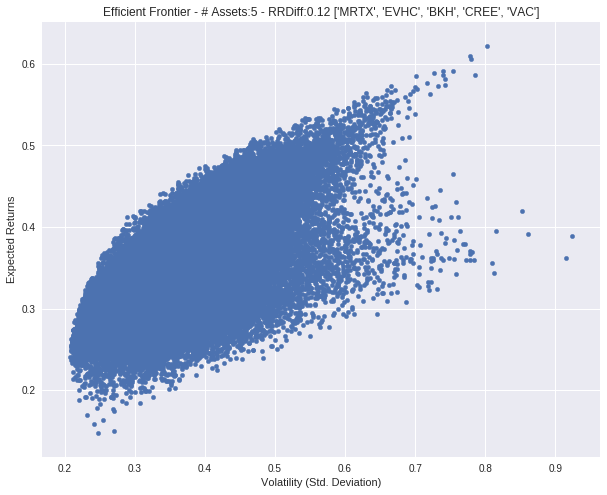

['ZBRA', 'DGICA', 'PRI', 'UNFI', 'NGHC']
# 1069 , RRDiff: 0.0050249120205
['GD', 'IRET', 'TKR', 'HLIT', 'FAST']
# 1070 , RRDiff: -0.0628183126098
['ASCMA', 'BLMN', 'NIHD', 'ECPG', 'HTBI']
# 1071 , RRDiff: -0.00332855630717
['EFSC', 'FWRD', 'THO', 'KWR', 'HXL']
# 1072 , RRDiff: -0.0645422578647
['NNA', 'TZOO', 'ORIT', 'XLNX', 'EBTC']
# 1073 , RRDiff: -0.0996320168094
['ACHC', 'PRK', 'LLY', 'VHC', 'MCS']
# 1074 , RRDiff: -0.0485975667594
['HFC', 'APOG', 'HUBG', 'FFG', 'ESPR']
# 1075 , RRDiff: 0.0335596976849
['BXC', 'HAIN', 'ICUI', 'MLM', 'CLCT']
# 1076 , RRDiff: -0.0647119637379
['DDS', 'SANM', 'NGVC', 'TAX', 'PGEM']
# 1077 , RRDiff: -0.159943979764
['WAB', 'NSP', 'TROX', 'FF', 'DAVE']
# 1078 , RRDiff: -0.0752508091016
['SIF', 'OHI', 'ATVI', 'FISI', 'FDX']
# 1079 , RRDiff: -0.0504450179967
['GALT', 'CHH', 'ROSE', 'STML', 'AGCO']
# 1080 , RRDiff: -0.0358350040771
['GEF', 'OPK', 'SLCA', 'FARM', 'MCHP']
# 1081 , RRDiff: -0.0819152443698
['PRFT', 'FRO', 'CRIS', 'XRAY', 'AFH']
# 1082 , RRDif

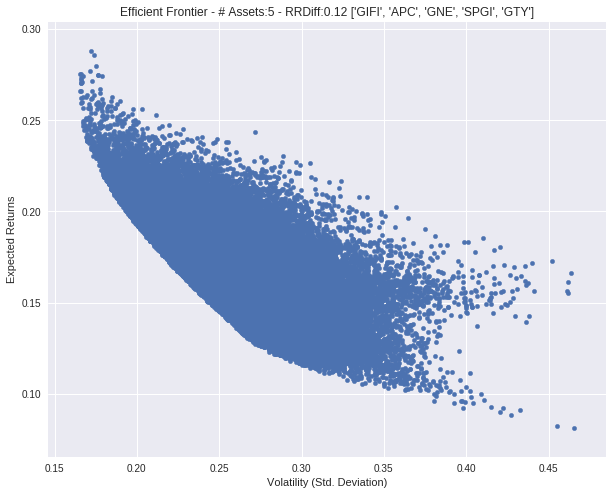

['DNKN', 'BMY', 'EXEL', 'JONE', 'SEMG']
# 1157 , RRDiff: -0.0544926490871
['ENDP', 'ALNY', 'AKAM', 'GGG', 'OXY']
# 1158 , RRDiff: -0.0557257715813
['SALM', 'CBOE', 'EFII', 'AMBR', 'CECE']
# 1159 , RRDiff: -0.0217777391554
['VRSN', 'ORLY', 'BMY', 'OFLX', 'SAFT']
# 1160 , RRDiff: -0.0215926929624
['CYTR', 'REXR', 'PATK', 'JOE', 'TRST']
# 1161 , RRDiff: 0.0230201431443
['DRH', 'CVGI', 'ADC', 'CCMP', 'CTBI']
# 1162 , RRDiff: -0.0996196800193
['BKNG', 'BGS', 'RDI', 'PTSI', 'HOFT']
# 1163 , RRDiff: -0.0629141507624
['MRIN', 'OSUR', 'CBPX', 'SSNC', 'TNK']
# 1164 , RRDiff: 0.00458362643587
['RS', 'RMTI', 'HTLD', 'CLUB', 'LXP']
# 1165 , RRDiff: -0.0945704679457
['AAON', 'CVBF', 'VFC', 'BDX', 'HES']
# 1166 , RRDiff: -0.0326368456266
['VRNS', 'VFC', 'MGLN', 'NWE', 'VHC']
# 1167 , RRDiff: -0.0100974515451
['SFE', 'HPT', 'WTFC', 'EGY', 'NP']
# 1168 , RRDiff: -0.119278484137
['NEWM', 'LABL', 'WFC', 'QTWO', 'NBHC']
# 1169 , RRDiff: 0.0424320536812
['STL', 'REIS', 'FDEF', 'WIX', 'ANIP']
# 1170 , RRDif

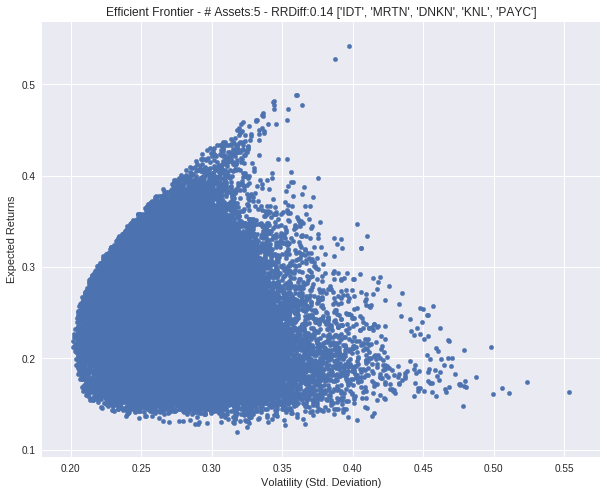

['IDRA', 'NETE', 'STBA', 'AZO', 'JBT']
# 1215 , RRDiff: 0.0852937199444
['CHTR', 'BOKF', 'DIN', 'SYX', 'RS']
# 1216 , RRDiff: 0.0402307895443
['CRD_B', 'ITW', 'RMAX', 'MSG', 'STAG']
# 1217 , RRDiff: 0.0626347103112
['CAH', 'KRA', 'OSIS', 'CCO', 'EXTR']
# 1218 , RRDiff: -0.0797962532811
['FFIN', 'TAP', 'MBI', 'LMT', 'MMS']
# 1219 , RRDiff: -0.033838881052
['GCO', 'BGFV', 'DRNA', 'GPN', 'CARA']
# 1220 , RRDiff: -0.0443469863281
['FBNK', 'LEA', 'SEIC', 'OCN', 'MOD']
# 1221 , RRDiff: 0.0177574196091
['BGCP', 'SLB', 'BRKS', 'DRI', 'ENPH']
# 1222 , RRDiff: -0.087318653775
['FLT', 'ULTI', 'CHSP', 'BKU', 'CENTA']
# 1223 , RRDiff: 0.0462849524261
['MTZ', 'LUK', 'FNSR', 'PEB', 'LHO']
# 1224 , RRDiff: -0.108586091028
['SUPN', 'CHUY', 'NPK', 'LKQ', 'ATHN']
# 1225 , RRDiff: 0.0414763347639
['IDTI', 'AET', 'HRL', 'BCOV', 'HCI']
# 1226 , RRDiff: 0.00992981190999
['TZOO', 'TUP', 'RS', 'XEL', 'CTAS']
# 1227 , RRDiff: -0.0659404500308
['EME', 'ED', 'ABM', 'AMNB', 'GABC']
# 1228 , RRDiff: -0.036962592901

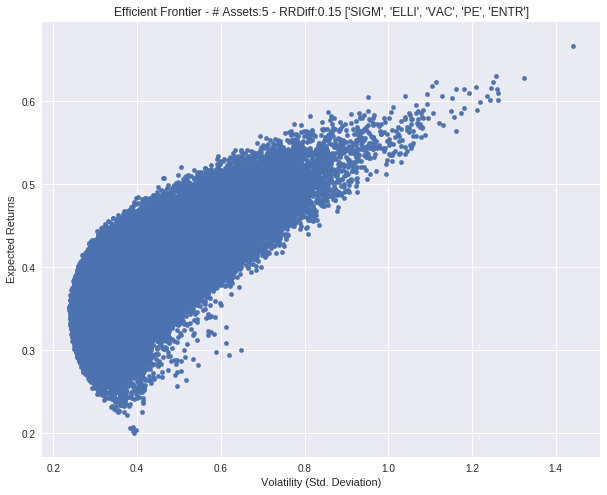

['VZ', 'CNK', 'TRI', 'DLB', 'FCEL']
# 1299 , RRDiff: -0.0903368781509
['MACK', 'PLT', 'CCE', 'EGLT', 'CI']
# 1300 , RRDiff: -0.135368120338
['HAFC', 'SCG', 'IBKR', 'IIVI', 'AGO']
# 1301 , RRDiff: -0.0721942999033
['YUM', 'MAIN', 'DRNA', 'EGOV', 'GBX']
# 1302 , RRDiff: -0.0232463517337
['HCKT', 'MA', 'USM', 'EWBC', 'STI']
# 1303 , RRDiff: 0.0192544252246
['HLT', 'CASH', 'MIDD', 'TNAV', 'GT']
# 1304 , RRDiff: 0.0727013561329
['BP', 'FDUS', 'FCE_A', 'BAX', 'IMKTA']
# 1305 , RRDiff: -0.0673572776218
['KNL', 'KSS', 'IART', 'TTMI', 'TTS']
# 1306 , RRDiff: -0.0948882346062
['RHT', 'TTPH', 'JNJ', 'PKD', 'EL']
# 1307 , RRDiff: -0.0487541358029
['UFPI', 'EWBC', 'GNCA', 'AXE', 'CLDT']
# 1308 , RRDiff: -0.10578402353
['RRTS', 'ICUI', 'MXWL', 'CGNX', 'GMED']
# 1309 , RRDiff: 0.00533227712606
['TLYS', 'BPTH', 'BKU', 'FFNW', 'PRKR']
# 1310 , RRDiff: -0.0756193362107
['LGND', 'DLTR', 'FCFS', 'TREE', 'INTL']
# 1311 , RRDiff: 0.0717109092427
['OKE', 'SWX', 'RVLT', 'BKH', 'FLT']
# 1312 , RRDiff: 0.036457

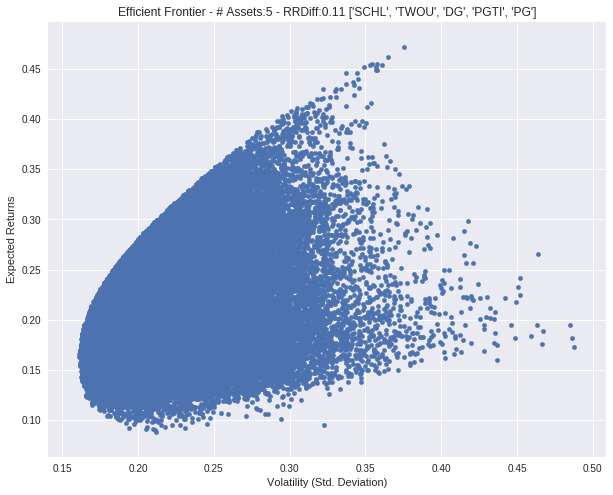

['RBC', 'NLY', 'MBI', 'MNRO', 'AMPE']
# 1364 , RRDiff: -0.0147006927676
['HBCP', 'CLDX', 'CBSH', 'PH', 'KEX']
# 1365 , RRDiff: -0.0230550646994
['WELL', 'MLAB', 'PETX', 'INSY', 'MVC']
# 1366 , RRDiff: -0.069642794453
['FNLC', 'CFFN', 'HDNG', 'ARCB', 'SUNS']
# 1367 , RRDiff: -0.0366666627112
['IPHS', 'PCG', 'CLGX', 'KLAC', 'UBNT']
# 1368 , RRDiff: -0.0236132779702
['ACN', 'GSBC', 'CTO', 'QSII', 'KRC']
# 1369 , RRDiff: -0.0341015564393
['PRGX', 'PAYC', 'RSG', 'TIF', 'CMRX']
# 1370 , RRDiff: 0.139864435842


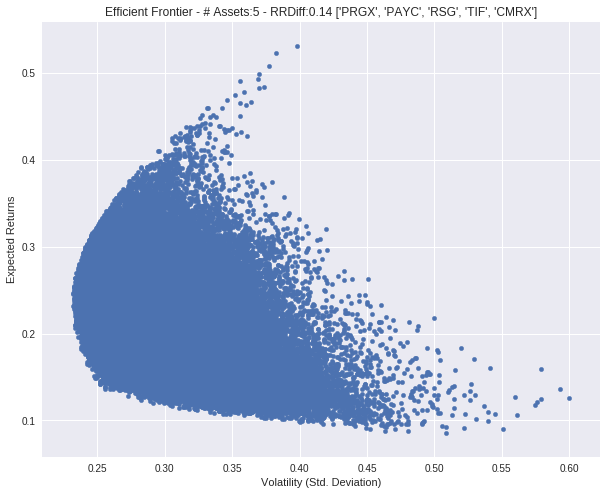

['JAKK', 'FFKT', 'PCG', 'KEY', 'STE']
# 1371 , RRDiff: -0.112029767814
['ASC', 'TXN', 'RTEC', 'AFL', 'TRNO']
# 1372 , RRDiff: -0.0687966272098
['ONB', 'EBAY', 'DVN', 'TAHO', 'TXN']
# 1373 , RRDiff: -0.119902192038
['NL', 'ENSG', 'WETF', 'CTS', 'KTWO']
# 1374 , RRDiff: -0.0828251219588
['MSCC', 'VVC', 'CFFN', 'TBI', 'NWE']
# 1375 , RRDiff: -0.0287662657849
['HBHC', 'BGC', 'HCA', 'SIVB', 'CRAI']
# 1376 , RRDiff: -0.0253661207301
['RF', 'OSK', 'HIL', 'PBCT', 'CDE']
# 1377 , RRDiff: -0.0904547748331
['CUBI', 'MAA', 'ELY', 'PRGO', 'IDXX']
# 1378 , RRDiff: 0.0120081440251
['FOR', 'LSCC', 'ICFI', 'SGMS', 'GMED']
# 1379 , RRDiff: 0.00818887390224
['LAD', 'LAYN', 'BBGI', 'CTS', 'NLNK']
# 1380 , RRDiff: -0.105544952068
['UBA', 'AHP', 'LFVN', 'CVEO', 'ORI']
# 1381 , RRDiff: -0.0964702212291
['BPFH', 'SAM', 'HCI', 'ROSE', 'HR']
# 1382 , RRDiff: -0.0152013719492
['GIS', 'PGTI', 'BWINB', 'STBA', 'LXFT']
# 1383 , RRDiff: -0.0441699641615
['FIZZ', 'AMD', 'HIFS', 'PIR', 'NAVI']
# 1384 , RRDiff: -0.0060

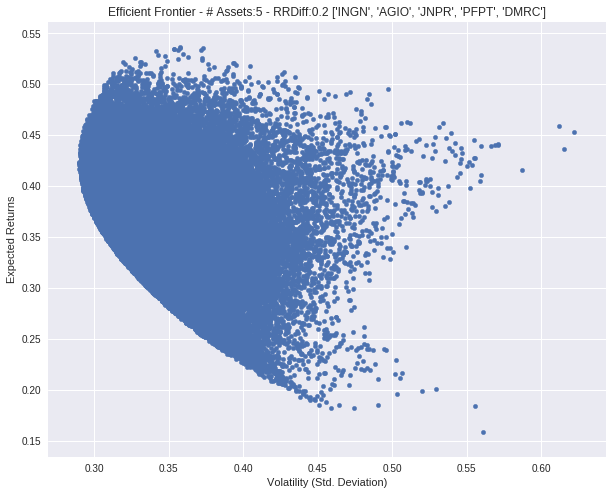

['OMI', 'GRMN', 'SREV', 'PBCT', 'ROL']
# 1415 , RRDiff: -0.0444915150279
['SLG', 'LPG', 'SRDX', 'GOOGL', 'NEWM']
# 1416 , RRDiff: 0.017121034063
['BKD', 'PAYC', 'AEL', 'MNK', 'DRE']
# 1417 , RRDiff: 0.128567621561


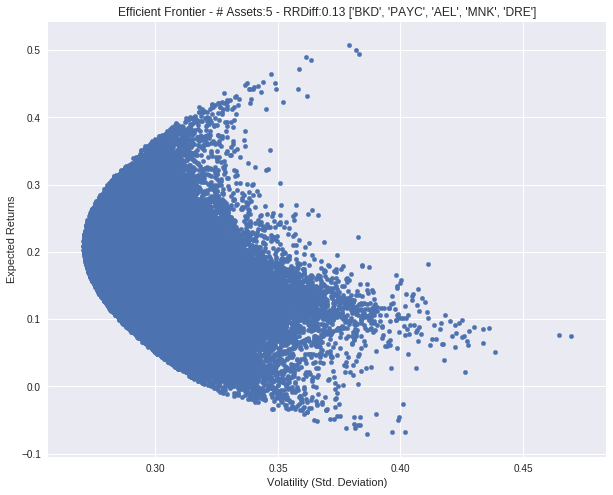

['DX', 'MCRI', 'UVE', 'MNKD', 'HP']
# 1418 , RRDiff: 0.0222718546728
['CTXS', 'LGIH', 'PCAR', 'NTRI', 'SFE']
# 1419 , RRDiff: 0.0668421424091
['ARE', 'ACIW', 'UFS', 'ATU', 'CASY']
# 1420 , RRDiff: -0.0852621851474
['AIN', 'KHC', 'CTRE', 'EBS', 'ENTG']
# 1421 , RRDiff: -0.0671763946403
['CLUB', 'LWAY', 'CSS', 'IT', 'OCLR']
# 1422 , RRDiff: -0.123837565538
['MTD', 'AFH', 'BG', 'VICR', 'LMT']
# 1423 , RRDiff: -0.00486659736692
['TG', 'WCG', 'NEO', 'TYL', 'PHH']
# 1424 , RRDiff: 0.0142171787333
['GBX', 'DCT', 'NSP', 'AWK', 'EXPE']
# 1425 , RRDiff: -0.0117873211585
['NCLH', 'BIIB', 'TTPH', 'QTWO', 'ATR']
# 1426 , RRDiff: 0.0303096319495
['SBGI', 'TJX', 'KOS', 'HSC', 'ARCB']
# 1427 , RRDiff: -0.0844051734077
['PEGI', 'GGG', 'ORN', 'PRK', 'CBU']
# 1428 , RRDiff: -0.0963269332003
['AMRC', 'CALX', 'DXYN', 'CYS', 'SXI']
# 1429 , RRDiff: -0.0774313159421
['GPK', 'VNCE', 'CTIC', 'MSI', 'ASC']
# 1430 , RRDiff: -0.217276305987
['TLYS', 'CVBF', 'GT', 'SF', 'ELLI']
# 1431 , RRDiff: 0.034281676789
['AB

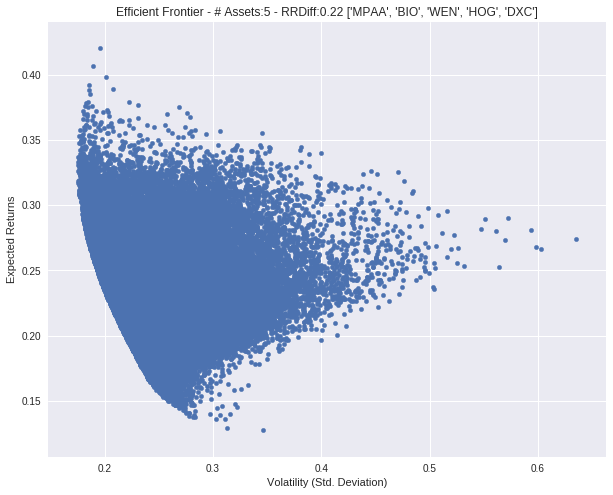

['ALGN', 'MVC', 'CVBF', 'CBK', 'ROK']
# 1479 , RRDiff: -0.100978851897
['SVVC', 'TRST', 'MNTA', 'DCO', 'CLGX']
# 1480 , RRDiff: -0.12781054582
['RLI', 'FLDM', 'KRO', 'AI', 'BPTH']
# 1481 , RRDiff: -0.0343024252709
['QNST', 'LB', 'WSFS', 'GTN', 'LMT']
# 1482 , RRDiff: -0.0489646827451
['NUE', 'MRIN', 'RYN', 'CWT', 'GOGO']
# 1483 , RRDiff: -0.0936625014685
['OPB', 'AMCX', 'AMTD', 'SENEA', 'IMKTA']
# 1484 , RRDiff: -0.0801443129136
['BK', 'USB', 'CLI', 'DRNA', 'GILD']
# 1485 , RRDiff: -0.0807995919115
['SNH', 'CME', 'HSII', 'MBFI', 'PODD']
# 1486 , RRDiff: -0.0484138429542
['PTSI', 'TIVO', 'AMED', 'BRS', 'BREW']
# 1487 , RRDiff: -0.0512866485458
['APEI', 'THFF', 'TRC', 'MBWM', 'CVGI']
# 1488 , RRDiff: -0.145907273011
['THFF', 'DHI', 'FTK', 'ODP', 'WDR']
# 1489 , RRDiff: -0.162861601859
['CYTX', 'ANIK', 'ZEN', 'CENX', 'KEX']
# 1490 , RRDiff: 0.0300636593255
['ENTA', 'PPBI', 'GMO', 'PCTY', 'GST']
# 1491 , RRDiff: 0.0236342861141
['SON', 'ROIC', 'AGO', 'CBOE', 'WPP']
# 1492 , RRDiff: 0.00070

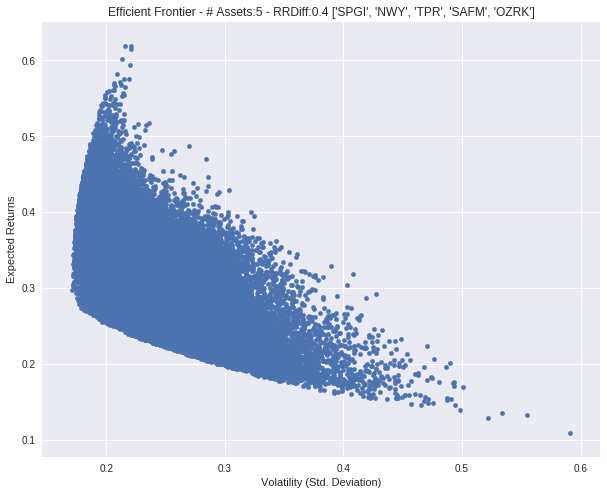

['NAVG', 'FLS', 'MATX', 'QTWO', 'NTAP']
# 1522 , RRDiff: 0.0113165564121
['SGY', 'MLR', 'SPR', 'NDLS', 'COTY']
# 1523 , RRDiff: -0.123418759943
['ITG', 'ARCC', 'RAD', 'TRUE', 'PFE']
# 1524 , RRDiff: -0.13229951882
['FNB', 'HTH', 'ZEUS', 'GIFI', 'PEIX']
# 1525 , RRDiff: -0.162120756671
['LAZ', 'INGN', 'IPCC', 'BLUE', 'STAA']
# 1526 , RRDiff: 0.208562396405


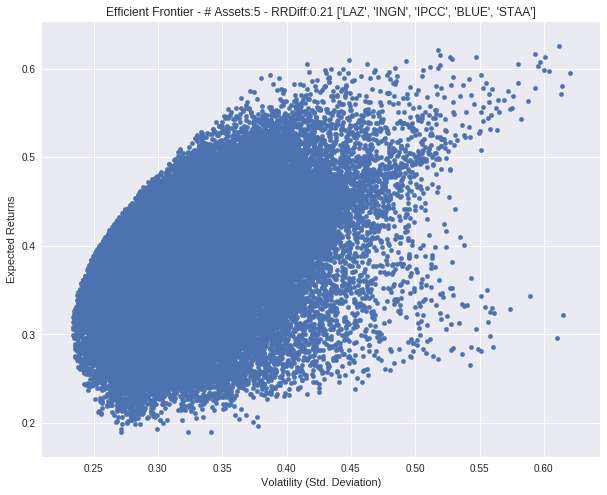

['STRL', 'BPTH', 'UTX', 'WHR', 'KAR']
# 1527 , RRDiff: 0.0297348161956
['ATSG', 'PYPL', 'HIBB', 'TSS', 'ZOES']
# 1528 , RRDiff: 0.038648913361
['THR', 'GMED', 'TPRE', 'BECN', 'PTX']
# 1529 , RRDiff: -0.00753631903879
['ODFL', 'LINC', 'STZ', 'MIDD', 'SPWH']
# 1530 , RRDiff: 0.0340359874955
['WAGE', 'MNKD', 'PTX', 'MBII', 'CAMP']
# 1531 , RRDiff: -0.0440155556292
['CME', 'NDAQ', 'HBIO', 'CEVA', 'WEN']
# 1532 , RRDiff: -0.0354463860186
['B', 'GDP', 'UBSH', 'FET', 'MANT']
# 1533 , RRDiff: -0.11918846378
['MCO', 'WEN', 'OXFD', 'I', 'WPP']
# 1534 , RRDiff: -0.0807950889232
['GFF', 'OXM', 'CCRN', 'USLM', 'USB']
# 1535 , RRDiff: -0.0943890611154
['PBF', 'CHMG', 'TAX', 'DXC', 'FII']
# 1536 , RRDiff: 0.215592460696


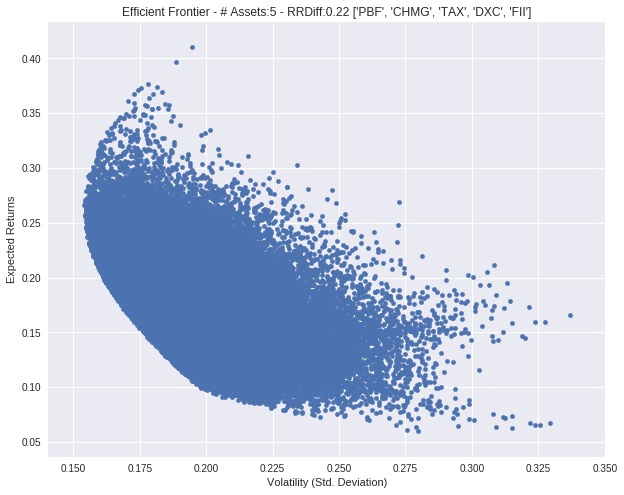

['LB', 'FLWS', 'X', 'COWN', 'CGNX']
# 1537 , RRDiff: -0.135390329736
['HCCI', 'UBSI', 'TREC', 'MRTX', 'AFAM']
# 1538 , RRDiff: 0.0169217980807
['HPT', 'VHC', 'DSW', 'FTV', 'SBAC']
# 1539 , RRDiff: 0.1256735251


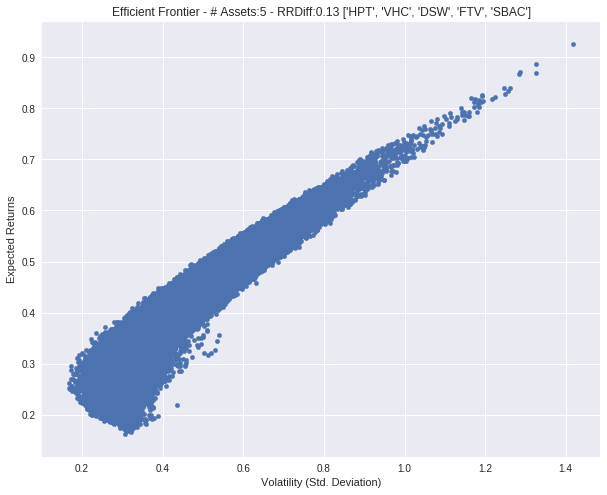

['MSA', 'PRAA', 'APAM', 'GLW', 'X']
# 1540 , RRDiff: -0.0869552584768
['ECYT', 'PLCE', 'BBW', 'CWT', 'UTHR']
# 1541 , RRDiff: -0.0524384625708
['TWX', 'SBH', 'BCRX', 'WMC', 'INO']
# 1542 , RRDiff: -0.0957589376964
['JJSF', 'OSUR', 'RL', 'QGEN', 'KELYA']
# 1543 , RRDiff: -0.0713726692582
['LSCC', 'ETFC', 'SQBG', 'RUBI', 'PRA']
# 1544 , RRDiff: -0.106548475184
['FET', 'MTH', 'GHDX', 'TG', 'GLNG']
# 1545 , RRDiff: -0.131177982497
['LB', 'LNG', 'SBSI', 'SNCR', 'CORE']
# 1546 , RRDiff: -0.0497364009988
['S', 'HOS', 'JLL', 'ISRG', 'EMR']
# 1547 , RRDiff: -0.0793545930365
['CRAY', 'SDRL', 'KR', 'CMP', 'STWD']
# 1548 , RRDiff: -0.0428269558665
['MPC', 'ALGT', 'FBIZ', 'EPAM', 'CVCO']
# 1549 , RRDiff: 0.0901476695914
['GFN', 'GLF', 'AMWD', 'TDW', 'PKOH']
# 1550 , RRDiff: -0.119449517231
['ETFC', 'BGG', 'DDS', 'XON', 'NEON']
# 1551 , RRDiff: -0.150215270026
['DWDP', 'TXN', 'USCR', 'VLY', 'CATO']
# 1552 , RRDiff: -0.0353844366823
['SWM', 'IPGP', 'CONE', 'CECO', 'CSGP']
# 1553 , RRDiff: 0.031815475

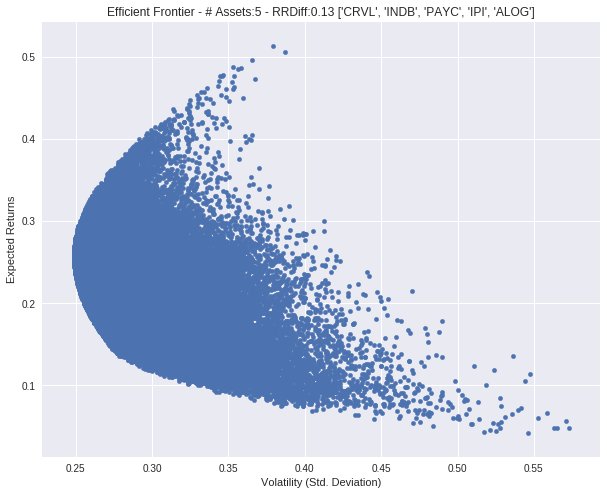

['MDSO', 'MRCY', 'LQ', 'SVVC', 'ELY']
# 1586 , RRDiff: -0.0577743435406
['SLB', 'BCEI', 'NRZ', 'VIAB', 'ECL']
# 1587 , RRDiff: -0.016236533079
['BCRX', 'CERN', 'WBA', 'ATRO', 'NWPX']
# 1588 , RRDiff: -0.04006477563
['SGEN', 'ODC', 'SSTK', 'HEES', 'GTXI']
# 1589 , RRDiff: -0.0651502568511
['IIIN', 'SAM', 'ADMS', 'TKR', 'CFG']
# 1590 , RRDiff: 0.0219856594475
['VSAR', 'C', 'SPA', 'MGEE', 'GALT']
# 1591 , RRDiff: -0.0631373257105
['GPRE', 'AWK', 'TAT', 'ICON', 'INWK']
# 1592 , RRDiff: -0.020912350639
['GES', 'AKBA', 'PYPL', 'PRIM', 'REX']
# 1593 , RRDiff: 0.0293643215275
['TIVO', 'SGY', 'CKH', 'SON', 'HF']
# 1594 , RRDiff: -0.104612620182
['TTI', 'FULT', 'CSRA', 'SHO', 'HOME']
# 1595 , RRDiff: 0.0734781910921
['VFC', 'PFE', 'ACOR', 'MG', 'VSEC']
# 1596 , RRDiff: -0.0501407495903
['PE', 'AMPE', 'OLP', 'BGCP', 'CTBI']
# 1597 , RRDiff: -0.0521862458052
['SHO', 'SYMC', 'KTOS', 'UVV', 'PKD']
# 1598 , RRDiff: -0.116023004942
['WRK', 'HCA', 'NRCIA', 'KSU', 'ADSK']
# 1599 , RRDiff: -0.00363498835

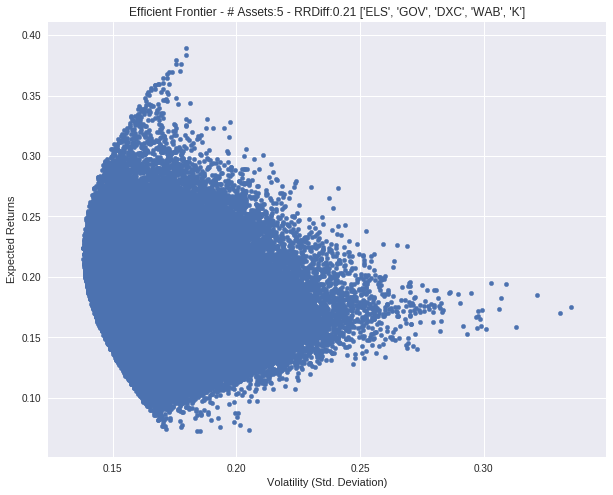

['PTCT', 'BRSS', 'YORW', 'GWRE', 'MLAB']
# 1641 , RRDiff: 0.0775756942497
['FBC', 'EBAY', 'VFC', 'COP', 'UHAL']
# 1642 , RRDiff: -0.0524425851695
['PPG', 'TR', 'CECO', 'CECE', 'VLY']
# 1643 , RRDiff: -0.0925238805155
['HEES', 'ROK', 'AGX', 'PCYG', 'BXP']
# 1644 , RRDiff: -0.00658334161091
['NYMT', 'NSC', 'BBT', 'SNSS', 'CSV']
# 1645 , RRDiff: -0.115441582576
['ITCI', 'TNK', 'BRKS', 'SIF', 'FNHC']
# 1646 , RRDiff: -0.0996671218779
['QUIK', 'FF', 'CPS', 'LFUS', 'EME']
# 1647 , RRDiff: -0.0167333597792
['ZEUS', 'SENEA', 'HXL', 'TMHC', 'FOE']
# 1648 , RRDiff: -0.110447691742
['KVHI', 'CASS', 'SHLD', 'KELYA', 'SUI']
# 1649 , RRDiff: -0.0600100661564
['SFLY', 'EBAY', 'CHCO', 'SO', 'PKG']
# 1650 , RRDiff: -0.0217035156241
['IP', 'HWKN', 'NUVA', 'MDP', 'LGIH']
# 1651 , RRDiff: 0.0488111282208
['AME', 'XRM', 'MDLZ', 'INTL', 'CONE']
# 1652 , RRDiff: 0.0388327703805
['RL', 'HTH', 'ADTN', 'KR', 'DAVE']
# 1653 , RRDiff: -0.0940756475753
['DORM', 'ADM', 'TXT', 'AMBR', 'PDLI']
# 1654 , RRDiff: -0.085

# 1755 , RRDiff: -0.120065565591
['AES', 'WR', 'TYL', 'FIVE', 'TTMI']
# 1756 , RRDiff: -0.0230334368677
['NKTR', 'PEGI', 'MDXG', 'SBRA', 'UIHC']
# 1757 , RRDiff: -0.0659593664145
['VLGEA', 'MOV', 'ORA', 'DGX', 'CRL']
# 1758 , RRDiff: -0.0271218736644
['TDY', 'FLS', 'PCTY', 'CRY', 'UBNT']
# 1759 , RRDiff: 0.00821966142862
['VICL', 'BRS', 'JW_A', 'ENS', 'GRUB']
# 1760 , RRDiff: -0.0251325224108
['DECK', 'CA', 'LFUS', 'CASS', 'AVY']
# 1761 , RRDiff: -0.0318081705523
['FN', 'GMO', 'REG', 'GSM', 'ZEN']
# 1762 , RRDiff: 0.0293093275532
['XYL', 'FBNC', 'BPFH', 'NYMT', 'MKL']
# 1763 , RRDiff: 0.00274750129266
['DYN', 'HPQ', 'WLH', 'CBZ', 'XNCR']
# 1764 , RRDiff: -0.0669402697747
['CSBK', 'MTRX', 'ETR', 'CECE', 'TSLA']
# 1765 , RRDiff: 0.00721137867542
['HTH', 'SPNS', 'VGR', 'GIFI', 'CECE']
# 1766 , RRDiff: -0.095867317002
['RPT', 'FFBC', 'OMC', 'FHN', 'GPRE']
# 1767 , RRDiff: -0.12813003659
['SHLO', 'ACTG', 'LKQ', 'LNT', 'WLB']
# 1768 , RRDiff: -0.0255077554925
['SEIC', 'ARR', 'AZPN', 'DXYN', 

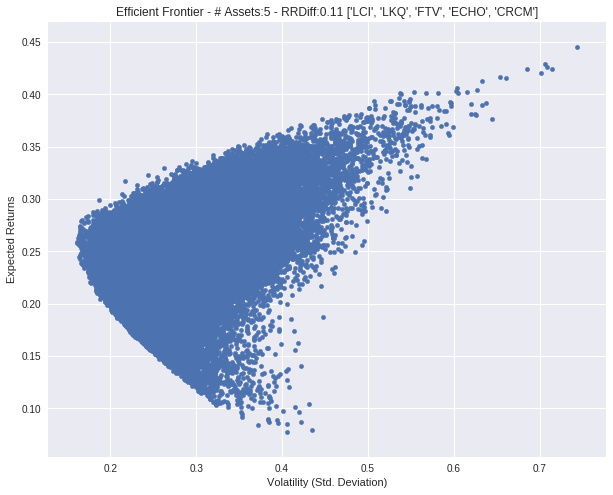

['GCAP', 'ACXM', 'HTLF', 'SEE', 'CATM']
# 1804 , RRDiff: -0.130203402404
['ACN', 'ROLL', 'VSI', 'NEWM', 'SGMO']
# 1805 , RRDiff: -0.00318946620144
['NEWM', 'COLM', 'UVSP', 'EQR', 'IGT']
# 1806 , RRDiff: -0.0174633430951
['A', 'ORIT', 'PHM', 'COKE', 'MPAA']
# 1807 , RRDiff: -0.0929607671534
['FII', 'PYPL', 'PDLI', 'HT', 'IRWD']
# 1808 , RRDiff: 0.0123324149228
['ATNM', 'MDSO', 'IMPV', 'SKYW', 'IMMU']
# 1809 , RRDiff: -0.0361794937465
['GVA', 'KND', 'FRME', 'AXS', 'SLRC']
# 1810 , RRDiff: -0.0577855285221
['MIND', 'MSM', 'MCY', 'LRCX', 'HSC']
# 1811 , RRDiff: -0.0909230218637
['OFC', 'ENZ', 'VLY', 'VRNT', 'RNET']
# 1812 , RRDiff: -0.108225326096
['TRGP', 'GOGO', 'DMRC', 'CVS', 'OXY']
# 1813 , RRDiff: -0.0724757454248
['AAWW', 'LWAY', 'EPR', 'LEE', 'BDC']
# 1814 , RRDiff: -0.102392471464
['COR', 'TAL', 'AIG', 'GRUB', 'ECOL']
# 1815 , RRDiff: 0.154882865932


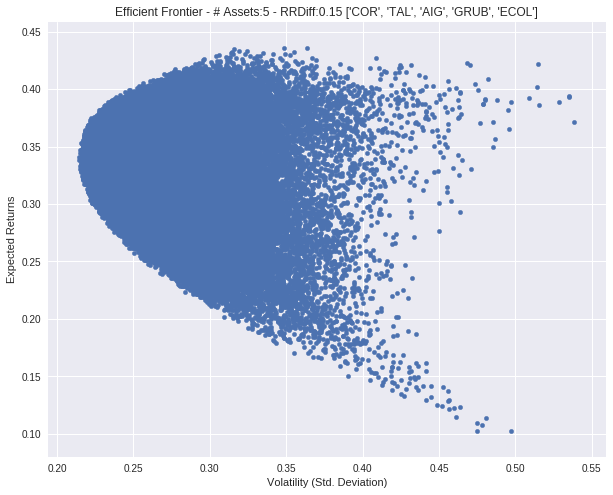

['ODC', 'OPY', 'GLRE', 'CMCO', 'BKNG']
# 1816 , RRDiff: -0.12560464344
['LBY', 'IR', 'VC', 'LYB', 'DATA']
# 1817 , RRDiff: -0.00175200497427
['VHC', 'DWSN', 'NPTN', 'BANR', 'IDCC']
# 1818 , RRDiff: -0.0199157425536
['AKAM', 'CCNE', 'USCR', 'AXL', 'SHOS']
# 1819 , RRDiff: -0.0385913787479
['OXM', 'VSAR', 'BRK_B', 'SONC', 'ACIW']
# 1820 , RRDiff: -0.0832169820411
['ANH', 'RSO', 'SUI', 'DWDP', 'MTGE']
# 1821 , RRDiff: -0.0351797060976
['LQDT', 'JMBA', 'ADTN', 'NAT', 'TRNO']
# 1822 , RRDiff: -0.0831691782262
['USAP', 'CRMT', 'AMD', 'RTN', 'PWOD']
# 1823 , RRDiff: -0.0609523827157
['ADS', 'PRI', 'CASH', 'CRI', 'CLNE']
# 1824 , RRDiff: 0.019712537067
['CTRL', 'CACI', 'BUSE', 'TSLA', 'TIPT']
# 1825 , RRDiff: 0.00910825937444
['HOFT', 'EFX', 'VSH', 'PRGX', 'BCOR']
# 1826 , RRDiff: -0.0850904529798
['RTEC', 'SPNS', 'ZUMZ', 'BGG', 'KIN']
# 1827 , RRDiff: -0.154325909238
['TBBK', 'ACET', 'ECL', 'INFI', 'SNX']
# 1828 , RRDiff: -0.0579592131802
['GNCA', 'GVA', 'ATSG', 'WERN', 'ICPT']
# 1829 , RRDif

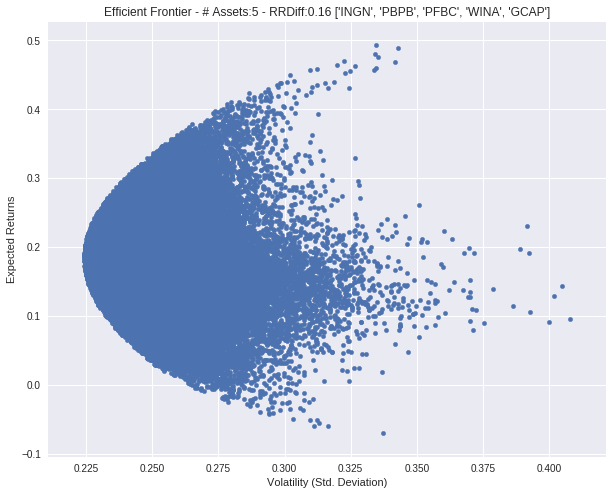

['VPG', 'FCSC', 'MGM', 'IIVI', 'TTEC']
# 1838 , RRDiff: -0.101433764575
['CPA', 'TSS', 'BBY', 'FORM', 'IPHI']
# 1839 , RRDiff: -0.0727620443465
['VCRA', 'HIIQ', 'TXN', 'HALO', 'IVAC']
# 1840 , RRDiff: -0.0562806611902
['CTAS', 'EEFT', 'ZIXI', 'P', 'LAD']
# 1841 , RRDiff: -0.0811771750384
['AXE', 'CUI', 'XRM', 'CHUY', 'DTE']
# 1842 , RRDiff: -0.0269282984542
['MCK', 'BKU', 'TECH', 'EDR', 'LEN']
# 1843 , RRDiff: -0.0634201447988
['STAG', 'TPC', 'VVI', 'ACRX', 'LPSN']
# 1844 , RRDiff: -0.0282069246019
['HTLF', 'SREV', 'EEFT', 'YORW', 'CIX']
# 1845 , RRDiff: -0.0482713409707
['OMER', 'AXL', 'RRGB', 'SLRC', 'MINI']
# 1846 , RRDiff: -0.0406558690275
['AIMC', 'JEC', 'CLFD', 'ACN', 'SBNY']
# 1847 , RRDiff: -0.0382612701615
['VZ', 'LRN', 'PIR', 'CIT', 'XEL']
# 1848 , RRDiff: -0.0768557785697
['FARO', 'ESGR', 'ERII', 'IRDM', 'EPZM']
# 1849 , RRDiff: -0.0679917190323
['UFPI', 'FMC', 'UEC', 'AYI', 'UBSH']
# 1850 , RRDiff: -0.10203558032
['GLUU', 'CHKP', 'ACIW', 'MTDR', 'ASH']
# 1851 , RRDiff: -0.0

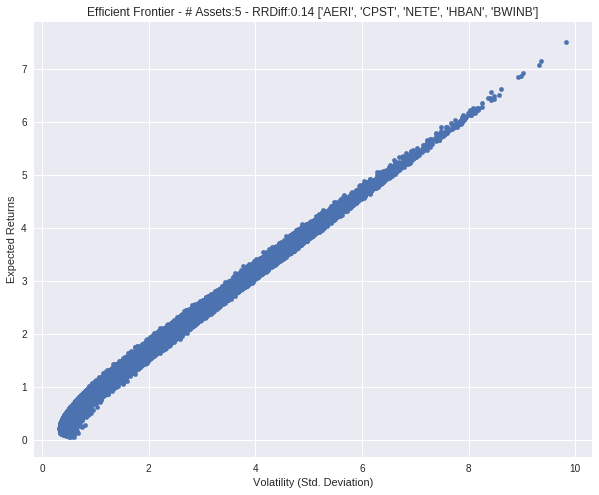

['FFBC', 'AWI', 'ISBC', 'ZION', 'WM']
# 1855 , RRDiff: -0.0953979827373
['KODK', 'DLX', 'CPST', 'ORCL', 'LEA']
# 1856 , RRDiff: -0.00305234368646
['TSN', 'BFIN', 'DISH', 'RGS', 'TREC']
# 1857 , RRDiff: -0.0854934106164
['MSG', 'TSC', 'SB', 'GT', 'KEYW']
# 1858 , RRDiff: 0.0149482270101
['DOC', 'CMA', 'IBKC', 'MKTX', 'SNCR']
# 1859 , RRDiff: -0.0222697094815
['CB', 'KVHI', 'KOS', 'AWR', 'RUSHA']
# 1860 , RRDiff: -0.0509096075728
['FRO', 'SNPS', 'CATM', 'KSU', 'ACET']
# 1861 , RRDiff: -0.0843793780784
['CRAY', 'SENEA', 'PYPL', 'PRGX', 'POWL']
# 1862 , RRDiff: 0.0111185997326
['HAFC', 'ALSN', 'NETE', 'WMB', 'HI']
# 1863 , RRDiff: -0.00292650925027
['TXN', 'CPB', 'PNW', 'BDSI', 'SUNS']
# 1864 , RRDiff: -0.0517299486801
['CBL', 'PFS', 'KEX', 'PLAB', 'TECD']
# 1865 , RRDiff: -0.124547817284
['HAYN', 'LEG', 'MLHR', 'GRPN', 'LXU']
# 1866 , RRDiff: -0.148660793227
['EBAY', 'ATHN', 'SAIC', 'JCP', 'PTX']
# 1867 , RRDiff: -0.00199872170908
['BPTH', 'XOM', 'EL', 'ELLI', 'FLS']
# 1868 , RRDiff: 0.07

# 1969 , RRDiff: -0.0724934287714
['KELYA', 'VRNT', 'DX', 'TCO', 'RHI']
# 1970 , RRDiff: -0.0937892249373
['XEC', 'PLD', 'UNP', 'ACIW', 'BAS']
# 1971 , RRDiff: -0.0755644060505
['PWOD', 'MOH', 'ITIC', 'COBZ', 'COHR']
# 1972 , RRDiff: -0.0321071838229
['TBPH', 'BGC', 'MITK', 'KFY', 'NBIX']
# 1973 , RRDiff: -0.0491172365384
['FNLC', 'DUK', 'DJCO', 'AON', 'STAA']
# 1974 , RRDiff: -0.0359487527729
['TK', 'REN', 'SNPS', 'BGS', 'GRC']
# 1975 , RRDiff: -0.10006478161
['UCFC', 'LRCX', 'JLL', 'NKSH', 'VRA']
# 1976 , RRDiff: -0.0625314409021
['ESL', 'ROL', 'IVAC', 'AMC', 'KELYA']
# 1977 , RRDiff: -0.0737591928531
['GNE', 'RAIL', 'TRK', 'CENX', 'TTPH']
# 1978 , RRDiff: -0.178933840939
['USLM', 'CPB', 'GAIA', 'BHLB', 'EGAN']
# 1979 , RRDiff: -0.0565198412781
['EXPR', 'FOLD', 'TXN', 'KORS', 'CBI']
# 1980 , RRDiff: -0.0660906685293
['VLO', 'MLR', 'RMAX', 'CMS', 'GNMK']
# 1981 , RRDiff: -0.0123224783121
['TSN', 'LPI', 'AT', 'GHM', 'MA']
# 1982 , RRDiff: 0.0187638824731
['BLKB', 'GNE', 'BSX', 'VRNT', 

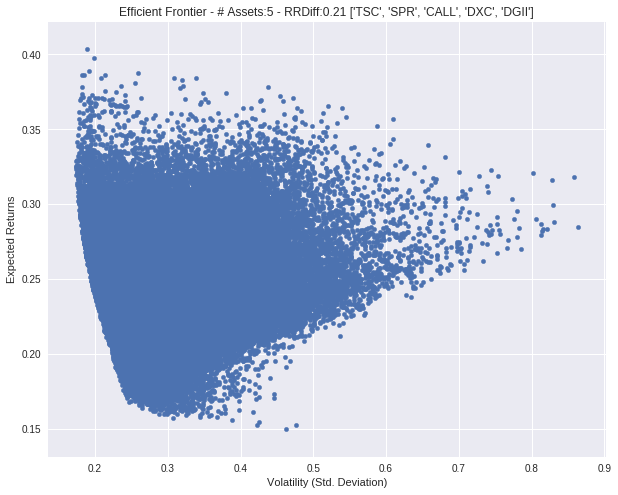

['UMPQ', 'WIFI', 'ADC', 'HMSY', 'AIR']
# 1991 , RRDiff: -0.0595360398965
['IMGN', 'GRIF', 'HUBG', 'PNC', 'PX']
# 1992 , RRDiff: -0.0515921873218
['MMSI', 'ETN', 'SIF', 'DHT', 'LSTR']
# 1993 , RRDiff: -0.0429476682457
['CTO', 'RPAI', 'ROP', 'TTI', 'DAN']
# 1994 , RRDiff: -0.0272724275899
['JBLU', 'CMI', 'PPC', 'RNR', 'CHTR']
# 1995 , RRDiff: 0.0544059653995
['BBOX', 'INFN', 'STAR', 'AHH', 'AEL']
# 1996 , RRDiff: -0.0815461617215
['IDXX', 'FLDM', 'AMC', 'RIGL', 'ELY']
# 1997 , RRDiff: -0.0896967329466
['RAD', 'PHIIK', 'IPHI', 'SPPI', 'HSY']
# 1998 , RRDiff: -0.0873247717842
['ALXN', 'FRGI', 'CLI', 'IBCP', 'SPSC']
# 1999 , RRDiff: -0.0257244538538
['NC', 'LPG', 'SWK', 'EROS', 'EXPO']
# 2000 , RRDiff: -0.0399410840864
['FSS', 'SXT', 'SIX', 'TFSL', 'PLOW']
# 2001 , RRDiff: 0.068957979525
['ERIE', 'EROS', 'PII', 'PPL', 'LB']
# 2002 , RRDiff: -0.0444806915448
['SPG', 'ARQL', 'WWE', 'HBIO', 'FLWS']
# 2003 , RRDiff: -0.089559465499
['WHG', 'FDP', 'EXPD', 'CALD', 'FLIR']
# 2004 , RRDiff: -0.0528

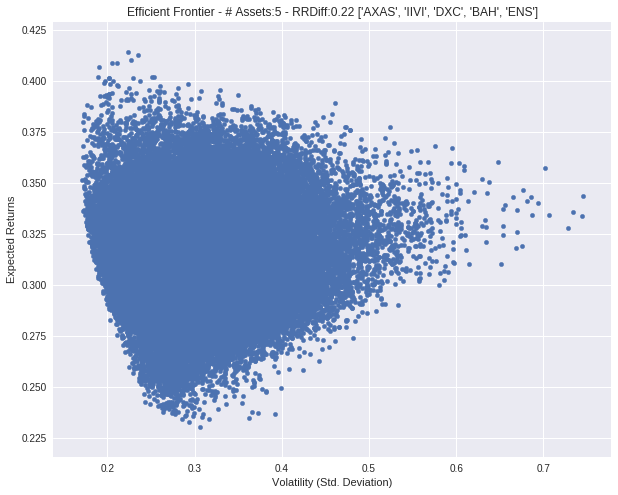

['WMT', 'PPL', 'LNG', 'DIS', 'HOLX']
# 2036 , RRDiff: -0.0379247251852
['OREX', 'PFIE', 'NYRT', 'DECK', 'SJM']
# 2037 , RRDiff: 0.072481378332
['ANF', 'RDNT', 'UCFC', 'VAC', 'BG']
# 2038 , RRDiff: 0.103797630698


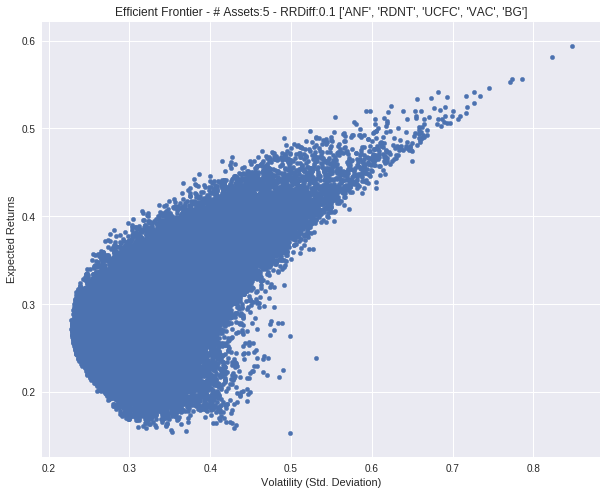

['AWI', 'EW', 'NNI', 'TIVO', 'CI']
# 2039 , RRDiff: -0.0359634916466
['OGE', 'JLL', 'TWX', 'USPH', 'FRGI']
# 2040 , RRDiff: -0.0497567321873
['RNST', 'HBHC', 'EROS', 'BCPC', 'P']
# 2041 , RRDiff: -0.0423203939578
['IFF', 'MSI', 'RRGB', 'OMEX', 'RUTH']
# 2042 , RRDiff: -0.068523730711
['ACET', 'SNH', 'ARQL', 'CASS', 'UTX']
# 2043 , RRDiff: -0.0675796260793
['CMCSA', 'KRG', 'GLAD', 'CSBK', 'ONB']
# 2044 , RRDiff: -0.147898304966
['MPW', 'PRK', 'NFG', 'GARS', 'UA']
# 2045 , RRDiff: -0.106723467554
['TWMC', 'MTG', 'SYNT', 'WSR', 'CTBI']
# 2046 , RRDiff: -0.072740298797
['PFIS', 'AGX', 'TER', 'PTIE', 'NAV']
# 2047 , RRDiff: -0.0816898648942
['SEIC', 'NWHM', 'SSP', 'NKE', 'LOPE']
# 2048 , RRDiff: -0.00916620135998
['TXRH', 'AIMC', 'DISCA', 'FRME', 'SAFT']
# 2049 , RRDiff: -0.0551369230158
['NLSN', 'ARNC', 'NKSH', 'ROK', 'IBOC']
# 2050 , RRDiff: -0.0761941809828
['LFUS', 'SMCI', 'MSA', 'MYL', 'SON']
# 2051 , RRDiff: -0.0787988237154
['BLX', 'TDG', 'BHGE', 'WYNN', 'STAA']
# 2052 , RRDiff: 0.01

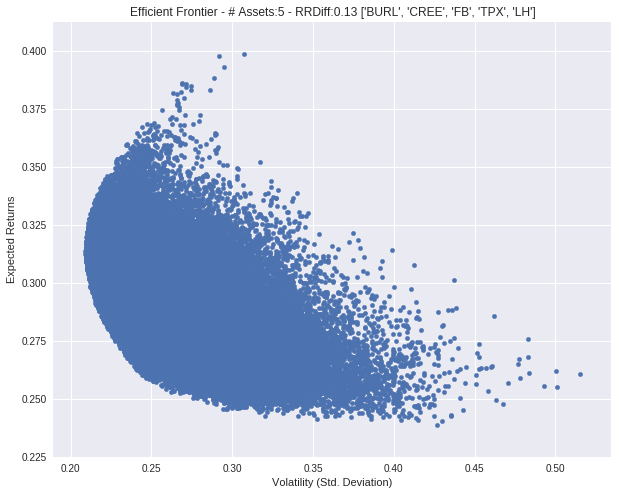

['EBTC', 'GNC', 'EME', 'TSS', 'CLUB']
# 2097 , RRDiff: -0.0830774802249
['ATEC', 'BEN', 'THS', 'ALEX', 'ABCB']
# 2098 , RRDiff: -0.126269456922
['VIVO', 'WGO', 'HOFT', 'FLWS', 'TUES']
# 2099 , RRDiff: -0.0989688549775
['DMRC', 'AMSF', 'KSS', 'MTZ', 'ALK']
# 2100 , RRDiff: -0.0849664997098
['FIX', 'BBX', 'HZNP', 'PODD', 'NVAX']
# 2101 , RRDiff: -0.0978886869468
['PZZA', 'CTWS', 'MNK', 'ADUS', 'AMAT']
# 2102 , RRDiff: -0.0339242192437
['BDSI', 'NOW', 'STRL', 'PEP', 'ESCA']
# 2103 , RRDiff: 0.0531888904774
['NLY', 'HLIT', 'PLCE', 'SAFT', 'MWA']
# 2104 , RRDiff: -0.0469566489539
['WAL', 'ERA', 'ASNA', 'RRD', 'DAN']
# 2105 , RRDiff: -0.210118009162
['HPP', 'LPI', 'PIR', 'DLR', 'IBKC']
# 2106 , RRDiff: -0.0358667750706
['DHI', 'ITG', 'MMI', 'ROLL', 'RGS']
# 2107 , RRDiff: -0.0185039297226
['GPOR', 'MDCO', 'WCG', 'DENN', 'LAZ']
# 2108 , RRDiff: -0.0765817741331
['CSV', 'HNI', 'SPR', 'ORBC', 'CZNC']
# 2109 , RRDiff: -0.131593180813
['ENR', 'GPRE', 'ENV', 'BCOR', 'ILMN']
# 2110 , RRDiff: -0.024

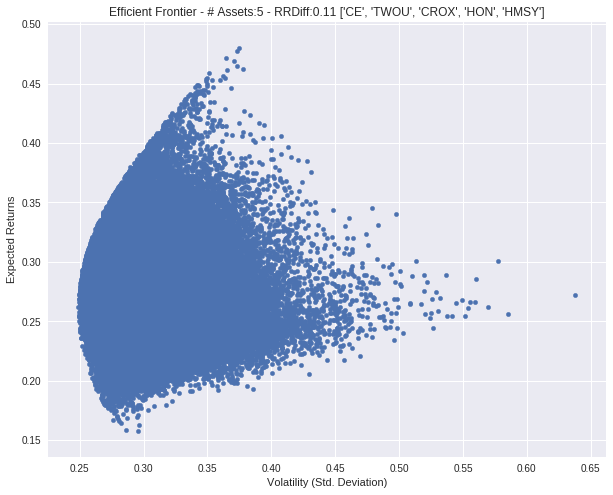

['CR', 'WCG', 'NSIT', 'TRI', 'BGCP']
# 2181 , RRDiff: -0.0883936020503
['YUM', 'UMPQ', 'TNC', 'EIGI', 'MSCC']
# 2182 , RRDiff: -0.0638407037912
['CALL', 'DKS', 'NSP', 'MBUU', 'CL']
# 2183 , RRDiff: -0.0117497662569
['CVGW', 'LAYN', 'ANH', 'APOG', 'TXRH']
# 2184 , RRDiff: -0.0418334956665
['LBTYA', 'APD', 'ANCX', 'EROS', 'COKE']
# 2185 , RRDiff: -0.0458158600192
['FNB', 'MVC', 'ACCO', 'HST', 'ALEX']
# 2186 , RRDiff: -0.160431162003
['VMC', 'MPO', 'TR', 'KR', 'XOMA']
# 2187 , RRDiff: -0.112431026388
['KND', 'ESIO', 'RAIL', 'GILD', 'OMI']
# 2188 , RRDiff: -0.0853473889709
['RVLT', 'GSVC', 'AEO', 'MSG', 'PEIX']
# 2189 , RRDiff: 0.0053259548163
['DE', 'CSOD', 'ERIE', 'EXLS', 'TSS']
# 2190 , RRDiff: -0.0516726915727
['TNET', 'FBIZ', 'SP', 'FORM', 'QADA']
# 2191 , RRDiff: 0.0199779884641
['VMI', 'LECO', 'SBSI', 'ROLL', 'HCI']
# 2192 , RRDiff: -0.0109209896833
['USNA', 'TXMD', 'ITT', 'INTL', 'RRC']
# 2193 , RRDiff: -0.0163010353348
['CPST', 'NBIX', 'TEN', 'FN', 'CPB']
# 2194 , RRDiff: -0.08156

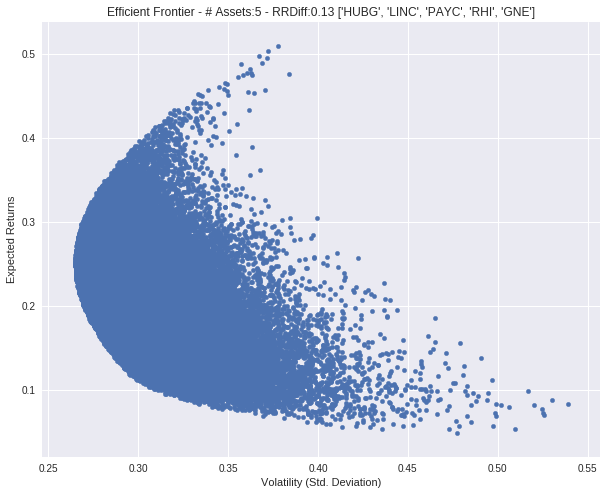

['TCBI', 'PBF', 'HLIT', 'UNM', 'BCPC']
# 2197 , RRDiff: -0.0340958493551
['NHI', 'GERN', 'NETE', 'TAHO', 'XOMA']
# 2198 , RRDiff: -0.0130752213393
['HSII', 'STBA', 'WETF', 'EXC', 'AXDX']
# 2199 , RRDiff: -0.06424948419
['OC', 'DORM', 'MDCO', 'GPI', 'WD']
# 2200 , RRDiff: 0.00215345668111
['AVB', 'MOS', 'MFA', 'ILMN', 'PNW']
# 2201 , RRDiff: -0.0428253040112
['INTU', 'MAR', 'WTS', 'DDS', 'BGG']
# 2202 , RRDiff: -0.0736562844411
['PDLI', 'TIS', 'SGMS', 'RSG', 'WSTL']
# 2203 , RRDiff: -0.052525828993
['WAFD', 'WGO', 'SYX', 'CNO', 'DSW']
# 2204 , RRDiff: -0.144685180305
['KMI', 'BMTC', 'FLIR', 'F', 'OPY']
# 2205 , RRDiff: -0.0928473829979
['FICO', 'INFO', 'CUI', 'DWSN', 'CKH']
# 2206 , RRDiff: -0.012280544679
['DEI', 'INTC', 'BRT', 'PLPC', 'ANF']
# 2207 , RRDiff: -0.0998260846833
['NJR', 'CCI', 'NKSH', 'NRIM', 'JW_A']
# 2208 , RRDiff: -0.0280075742972
['WIRE', 'MKC', 'EA', 'BANC', 'AZO']
# 2209 , RRDiff: -0.0105730194289
['GBLI', 'GOLD', 'GPRE', 'IMMR', 'ICPT']
# 2210 , RRDiff: -0.03377531

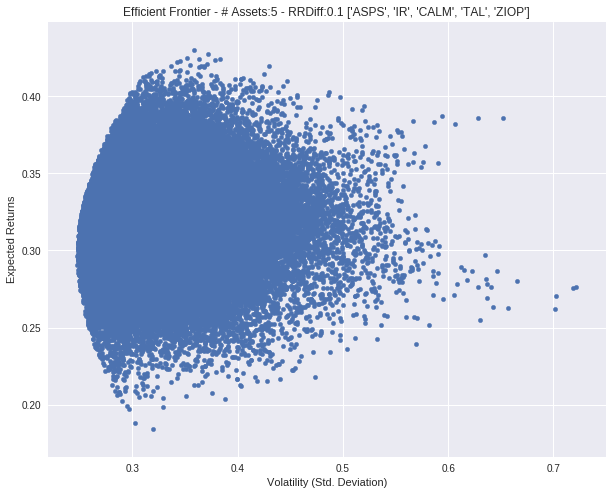

['IMMR', 'GPC', 'CFX', 'IBOC', 'TZOO']
# 2218 , RRDiff: -0.0828422734387
['IPCC', 'TIPT', 'CVA', 'LYB', 'AAPL']
# 2219 , RRDiff: 0.0432301535201
['KRC', 'CHTR', 'PLAB', 'DY', 'STZ']
# 2220 , RRDiff: 0.0509821436406
['DAL', 'MRIN', 'BUSE', 'FIVN', 'ECPG']
# 2221 , RRDiff: 0.0280592852022
['TRK', 'WU', 'EBS', 'AEP', 'CNP']
# 2222 , RRDiff: -0.0918738330907
['TROW', 'KO', 'CHCO', 'XOXO', 'BBRG']
# 2223 , RRDiff: -0.0882942707349
['KMX', 'TREX', 'ISRG', 'TAL', 'GRIF']
# 2224 , RRDiff: 0.101198144483


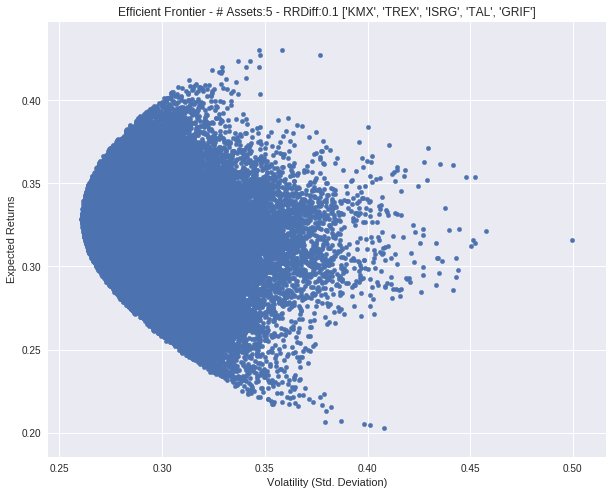

['EVR', 'BFS', 'VLY', 'MCRI', 'BWINB']
# 2225 , RRDiff: -0.0944917024779
['MNTX', 'ARCC', 'CLFD', 'EGHT', 'SPLK']
# 2226 , RRDiff: -0.0197781779855
['IDA', 'FNLC', 'NUE', 'AMT', 'SBH']
# 2227 , RRDiff: -0.063366076403
['INAP', 'NLY', 'FLWS', 'OMED', 'HF']
# 2228 , RRDiff: -0.0821771469524
['BPFH', 'CPRT', 'MITK', 'CHSP', 'GARS']
# 2229 , RRDiff: -0.00113983707315
['VMW', 'CTIC', 'BIOL', 'VVI', 'BHGE']
# 2230 , RRDiff: -0.145010644119
['WRK', 'CSOD', 'JCOM', 'BIOL', 'PKI']
# 2231 , RRDiff: -0.0762040959408
['RTEC', 'SAIC', 'IRWD', 'WAB', 'MPO']
# 2232 , RRDiff: -0.00637733154246
['PROV', 'ADSK', 'DHR', 'WSR', 'EV']
# 2233 , RRDiff: -0.0432523892866
['PAYX', 'FRSH', 'LECO', 'FTV', 'MOS']
# 2234 , RRDiff: 0.0946506333809
['ARAY', 'HELE', 'IDXX', 'LECO', 'LYTS']
# 2235 , RRDiff: -0.0569631612253
['FMI', 'UVSP', 'SWX', 'ENT', 'SRCE']
# 2236 , RRDiff: -0.0710854016656
['DXPE', 'FLS', 'WAGE', 'HFWA', 'UMBF']
# 2237 , RRDiff: -0.000829493981956
['TXN', 'CBI', 'ORBC', 'NXTM', 'BBY']
# 2238 , RR

# 2339 , RRDiff: -0.057796959245
['TLYS', 'WST', 'MG', 'AGO', 'TSC']
# 2340 , RRDiff: -0.054022550579
['AWK', 'AMAT', 'WTFC', 'MCY', 'LL']
# 2341 , RRDiff: -0.0113531069806
['CAT', 'CSOD', 'CCL', 'PPBI', 'BBT']
# 2342 , RRDiff: -0.0757981699185
['THG', 'MNR', 'TREE', 'NEWM', 'AMAG']
# 2343 , RRDiff: 0.0549049294233
['JNJ', 'ANIK', 'WEX', 'WTS', 'BGS']
# 2344 , RRDiff: -0.0269226415786
['PKG', 'SHLO', 'RWT', 'TAST', 'SATS']
# 2345 , RRDiff: -0.0696689542297
['MGI', 'NAT', 'RRC', 'CCF', 'PNNT']
# 2346 , RRDiff: -0.0808467900282
['WABC', 'UMPQ', 'FDX', 'GEO', 'ACGL']
# 2347 , RRDiff: -0.0597924571553
['DXPE', 'IT', 'JCOM', 'FCFS', 'HCKT']
# 2348 , RRDiff: -0.0400397169343
['FMI', 'KODK', 'SBSI', 'BKNG', 'DECK']
# 2349 , RRDiff: -0.0117409244802
['GRIF', 'SYY', 'FE', 'MRTN', 'CGNX']
# 2350 , RRDiff: -0.0414034960421
['APAM', 'AA', 'HNRG', 'UTI', 'AIG']
# 2351 , RRDiff: 0.159835345877


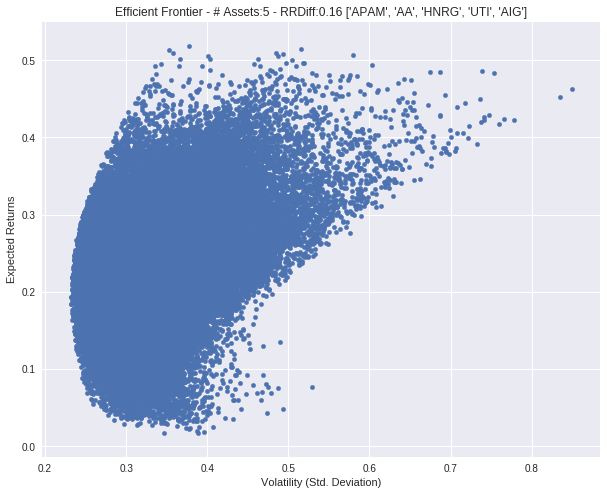

['BGCP', 'TBNK', 'SHLO', 'MRTX', 'MEIP']
# 2352 , RRDiff: -0.00818618632444
['BBSI', 'CBS', 'AWR', 'AZPN', 'ORBC']
# 2353 , RRDiff: -0.0383982162103
['NVAX', 'RGS', 'OC', 'BRSS', 'GNCA']
# 2354 , RRDiff: -0.0313740152971
['FFIC', 'RMBS', 'CLX', 'ABM', 'PB']
# 2355 , RRDiff: -0.0617894357
['ODFL', 'FANG', 'AROW', 'ACXM', 'FNHC']
# 2356 , RRDiff: 0.0978584084177
['GILD', 'CTRE', 'NCLH', 'LPG', 'SAFM']
# 2357 , RRDiff: -0.000108332949305
['TCBK', 'ALGT', 'DJCO', 'MTZ', 'SYY']
# 2358 , RRDiff: -0.0248619265892
['STRT', 'CIDM', 'SGMO', 'RSYS', 'CRUS']
# 2359 , RRDiff: -0.156930427485
['BECN', 'ADBE', 'AEE', 'AL', 'MLHR']
# 2360 , RRDiff: -0.0529813639004
['FII', 'CSRA', 'TXT', 'AMBC', 'PGC']
# 2361 , RRDiff: -0.0845777520503
['COL', 'PRKR', 'LTM', 'BHGE', 'FISV']
# 2362 , RRDiff: -0.0912863534569
['KMPR', 'TNDM', 'WM', 'SON', 'FCSC']
# 2363 , RRDiff: -0.121683524541
['PNR', 'IFF', 'DVA', 'ECOM', 'STFC']
# 2364 , RRDiff: -0.0825397806327
['XLNX', 'AHT', 'EA', 'PEG', 'NTGR']
# 2365 , RRDiff: 

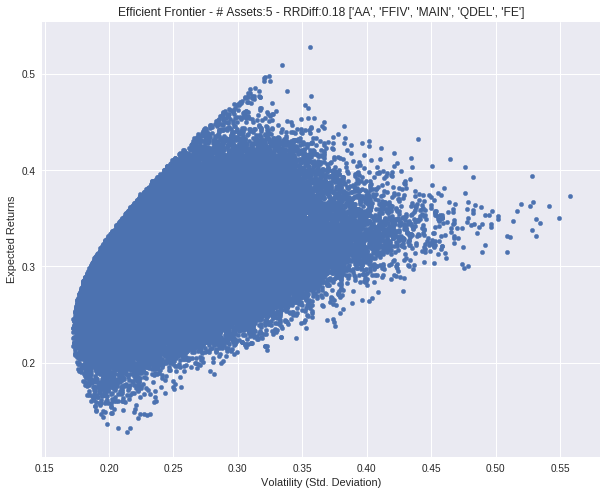

['DNKN', 'SPG', 'NRIM', 'HDNG', 'JAKK']
# 2376 , RRDiff: -0.0216204706135
['ACM', 'RHT', 'NETE', 'RJF', 'TSC']
# 2377 , RRDiff: 0.0235613864535
['CLR', 'CTG', 'USAK', 'VCRA', 'WPX']
# 2378 , RRDiff: -0.0981657194889
['FR', 'LION', 'PFS', 'DOC', 'PRK']
# 2379 , RRDiff: -0.0471601599323
['KIN', 'GORO', 'RLGY', 'MPX', 'CHGG']
# 2380 , RRDiff: -0.0275716324436
['CORE', 'DAR', 'ADBE', 'MFA', 'MSFG']
# 2381 , RRDiff: -0.0356335862472
['WWD', 'PE', 'SNSS', 'CPSS', 'CCOI']
# 2382 , RRDiff: -0.0667953391588
['TESS', 'LXU', 'PBYI', 'XOMA', 'CZNC']
# 2383 , RRDiff: -0.0749111681853
['WSTL', 'GILD', 'GPI', 'ECHO', 'WSFS']
# 2384 , RRDiff: -0.040173513308
['FUL', 'FTI', 'MCF', 'TGTX', 'WDAY']
# 2385 , RRDiff: 0.026092147739
['FRO', 'ESRX', 'BOOM', 'HMST', 'VLGEA']
# 2386 , RRDiff: -0.00269254145768
['ANGO', 'GLDD', 'DPS', 'ALB', 'AHH']
# 2387 , RRDiff: -0.0126867411658
['BGS', 'BK', 'SPWH', 'MTB', 'GTXI']
# 2388 , RRDiff: -0.118687720552
['NWL', 'WEX', 'VRTX', 'STE', 'ABBV']
# 2389 , RRDiff: 0.0135

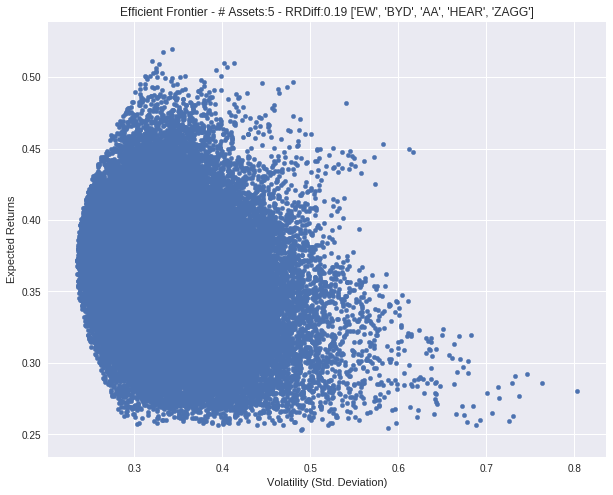

['WD', 'CELG', 'CHE', 'CTRL', 'LRN']
# 2458 , RRDiff: 0.037930947162
['KFY', 'UEC', 'ARNC', 'BDGE', 'DCT']
# 2459 , RRDiff: -0.125259490449
['UDR', 'VDSI', 'GS', 'FNSR', 'TIF']
# 2460 , RRDiff: -0.0889584389393
['HL', 'BCC', 'MXWL', 'DIN', 'PACB']
# 2461 , RRDiff: -0.120037208394
['ASGN', 'XEC', 'NICK', 'MSG', 'ITCI']
# 2462 , RRDiff: 0.0445001480977
['MRTN', 'STC', 'ANIK', 'EPR', 'MBUU']
# 2463 , RRDiff: -0.0132373718743
['AGTC', 'KHC', 'QUIK', 'HMHC', 'KOPN']
# 2464 , RRDiff: -0.185896487548
['KO', 'IEX', 'GVA', 'LTS', 'O']
# 2465 , RRDiff: -0.0497852492201
['XON', 'FOLD', 'WEX', 'STE', 'MSTR']
# 2466 , RRDiff: -0.0812509243533
['LUK', 'UHS', 'L', 'GES', 'USG']
# 2467 , RRDiff: -0.0761396147408
['TMP', 'BSTC', 'HAIN', 'REXX', 'CNBKA']
# 2468 , RRDiff: -0.0417785392878
['SUI', 'OPY', 'TEX', 'SBUX', 'UIHC']
# 2469 , RRDiff: -0.037120971974
['ALSN', 'ENZ', 'MPAA', 'DG', 'GXP']
# 2470 , RRDiff: -0.00498140815516
['MCBC', 'FN', 'MTB', 'AKAO', 'MNR']
# 2471 , RRDiff: -0.048539397477
['DLR'

# 2572 , RRDiff: -0.0446589157508
['OII', 'FCF', 'ITW', 'ENTG', 'HCKT']
# 2573 , RRDiff: -0.0986095279018
['AKS', 'HOME', 'DE', 'PTSI', 'MSCC']
# 2574 , RRDiff: 0.0906889860855
['CDNS', 'FCSC', 'MGEE', 'ATEC', 'SPAR']
# 2575 , RRDiff: -0.0967137617504
['XOMA', 'TRIP', 'TKR', 'WLL', 'KBH']
# 2576 , RRDiff: -0.136999557236
['AKRX', 'CRMT', 'MPW', 'FFG', 'PRGS']
# 2577 , RRDiff: -0.0238725405779
['MYL', 'GGG', 'UIHC', 'IPAR', 'WDAY']
# 2578 , RRDiff: -0.0085563452164
['PFMT', 'GLAD', 'EZPW', 'AXDX', 'DEPO']
# 2579 , RRDiff: -0.0987659200939
['ATNI', 'ZIXI', 'ATO', 'TFSL', 'SMG']
# 2580 , RRDiff: -0.0409538160168
['MAIN', 'P', 'TIS', 'KMI', 'ECHO']
# 2581 , RRDiff: -0.0416101207372
['MD', 'VOYA', 'HWCC', 'SALT', 'VOD']
# 2582 , RRDiff: -0.0352513890914
['EME', 'OMC', 'LMT', 'VLGEA', 'SAIC']
# 2583 , RRDiff: 0.0178599605972
['AMRC', 'EXLS', 'PATK', 'CHH', 'CDE']
# 2584 , RRDiff: -0.0525369928695
['MDP', 'ADI', 'UEIC', 'ESIO', 'FCBC']
# 2585 , RRDiff: -0.113307677485
['TISI', 'CNP', 'AXL', '

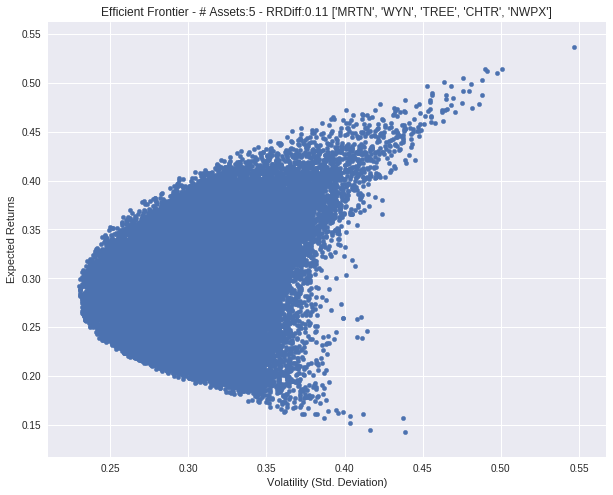

['CL', 'XRX', 'ACXM', 'JBLU', 'SNH']
# 2606 , RRDiff: -0.0855955623172
['AKBA', 'CVCO', 'PBF', 'VICR', 'GLRE']
# 2607 , RRDiff: -0.08029111333
['LTC', 'JCP', 'OXFD', 'AMTD', 'MSTR']
# 2608 , RRDiff: -0.10080876738
['BRSS', 'PXD', 'TEL', 'PNW', 'FBNC']
# 2609 , RRDiff: -0.0136200578392
['PFS', 'VDSI', 'CNMD', 'TREC', 'X']
# 2610 , RRDiff: -0.0845875302321
['LNT', 'CCI', 'WR', 'AHP', 'VICL']
# 2611 , RRDiff: -0.0761762264852
['SLB', 'UVSP', 'EIG', 'ADBE', 'PODD']
# 2612 , RRDiff: -0.0734415482334
['SHW', 'BKCC', 'SBNY', 'TSLA', 'CRZO']
# 2613 , RRDiff: 0.0244453400573
['ILMN', 'ZGNX', 'PCH', 'NXST', 'D']
# 2614 , RRDiff: -0.0260024495592
['WEYS', 'LNDC', 'BCRX', 'SSP', 'IGT']
# 2615 , RRDiff: -0.0920315343721
['CIA', 'WMC', 'MO', 'MMC', 'SENEA']
# 2616 , RRDiff: -0.0424771408883
['VSAT', 'TBPH', 'CZNC', 'RESI', 'ARRY']
# 2617 , RRDiff: -0.114256177333
['VCYT', 'ENSG', 'HD', 'WMK', 'DTE']
# 2618 , RRDiff: -0.0485014019486
['TRS', 'MET', 'KND', 'XL', 'TBNK']
# 2619 , RRDiff: -0.06153150603

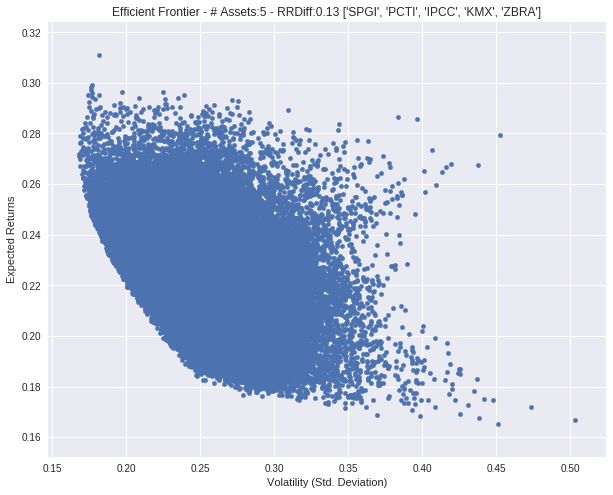

['TRV', 'SWK', 'LPX', 'IIIN', 'DISCK']
# 2676 , RRDiff: -0.0651508102068
['GFF', 'LSTR', 'BKS', 'MPC', 'GLOG']
# 2677 , RRDiff: -0.015427961561
['BAX', 'NBTB', 'MTD', 'GLNG', 'UCBI']
# 2678 , RRDiff: -0.0532848338454
['RAD', 'ATNM', 'GPN', 'CSU', 'MRO']
# 2679 , RRDiff: -0.0601526024993
['TWX', 'CW', 'TTPH', 'ROIC', 'IPHS']
# 2680 , RRDiff: -0.0322750598258
['BK', 'UAA', 'CSS', 'KMG', 'DGX']
# 2681 , RRDiff: -0.0290258479977
['MTSI', 'ABT', 'BBY', 'HCI', 'MOS']
# 2682 , RRDiff: -0.0340278248197
['IVR', 'CONE', 'EW', 'BOFI', 'WSTL']
# 2683 , RRDiff: 0.0463102403628
['MCD', 'CTXS', 'NYT', 'KODK', 'JBLU']
# 2684 , RRDiff: -0.0847912526879
['SREV', 'IQV', 'RNST', 'CHUY', 'GSM']
# 2685 , RRDiff: -0.111397886009
['BDC', 'HSC', 'VHC', 'ARR', 'BABY']
# 2686 , RRDiff: -0.0753723265428
['WMB', 'HII', 'WU', 'PLT', 'CTL']
# 2687 , RRDiff: 0.0525806711468
['OCFC', 'HES', 'WNC', 'STT', 'HCCI']
# 2688 , RRDiff: -0.1123190965
['FNGN', 'LKFN', 'MOG_A', 'ODP', 'WCN']
# 2689 , RRDiff: -0.0600106876212
['

# 2790 , RRDiff: -0.0393622877943
['ATRC', 'GEF', 'VR', 'JACK', 'CNO']
# 2791 , RRDiff: -0.063400915649
['RP', 'QRVO', 'ACCO', 'LGND', 'TRC']
# 2792 , RRDiff: -0.0896242222313
['LUK', 'NYNY', 'WTS', 'RUSHA', 'SPSC']
# 2793 , RRDiff: -0.0326262764514
['WOR', 'CASH', 'SPTN', 'UNH', 'AGM']
# 2794 , RRDiff: -0.0106255528052
['CHEF', 'LBTYA', 'VVI', 'ALLE', 'INGN']
# 2795 , RRDiff: 0.164011311307


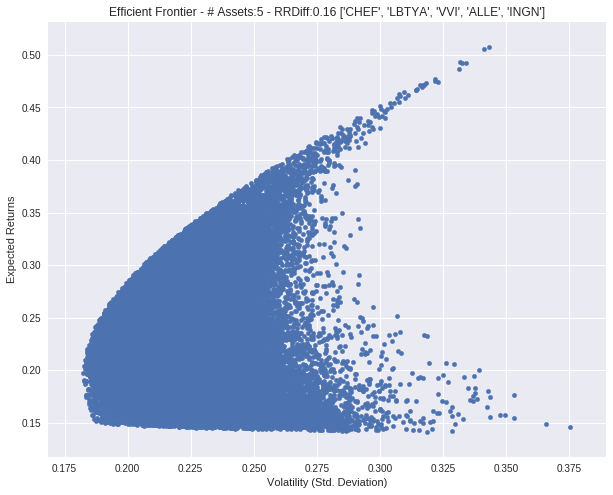

['BRK_A', 'STML', 'IPAR', 'MITT', 'RF']
# 2796 , RRDiff: -0.0244762073193
['CWT', 'QADA', 'WTBA', 'UHS', 'GWRE']
# 2797 , RRDiff: 0.0209672544887
['EXPD', 'MSFG', 'INFN', 'CPST', 'HRS']
# 2798 , RRDiff: -0.0799136794051
['GMED', 'UTL', 'ASC', 'BGG', 'CORT']
# 2799 , RRDiff: -0.00257561284336
['NGS', 'MEIP', 'WLK', 'ABCB', 'TAST']
# 2800 , RRDiff: -0.0766622967022
['GLAD', 'BK', 'UNP', 'LDL', 'PDLI']
# 2801 , RRDiff: -0.0720463803186
['CSII', 'MBUU', 'DCT', 'HRTX', 'HRZN']
# 2802 , RRDiff: -0.061628468863
['NYNY', 'TRXC', 'AEL', 'FRME', 'SPRT']
# 2803 , RRDiff: -0.0871876429851
['BAX', 'HST', 'PRO', 'MSI', 'NEM']
# 2804 , RRDiff: -0.0819777894199
['TITN', 'FE', 'STNG', 'ASCMA', 'BYD']
# 2805 , RRDiff: -0.120012932617
['SPLK', 'FNF', 'SSTK', 'SKYW', 'KW']
# 2806 , RRDiff: -0.0499718727428
['VICL', 'CALX', 'LORL', 'RL', 'GS']
# 2807 , RRDiff: -0.138870320018
['USPH', 'PZN', 'COTY', 'FDP', 'SMCI']
# 2808 , RRDiff: -0.0784273337285
['G', 'MODN', 'BDN', 'SPGI', 'PATK']
# 2809 , RRDiff: 0.123

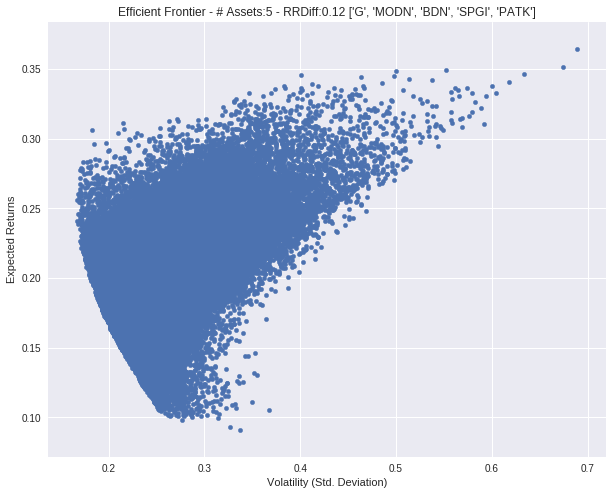

['SCHN', 'AIZ', 'GPT', 'RAIL', 'KEX']
# 2810 , RRDiff: -0.100641313642
['EZPW', 'DXCM', 'WLH', 'WTM', 'STMP']
# 2811 , RRDiff: -0.0768708160395
['Y', 'LPLA', 'RGLS', 'TROW', 'EXC']
# 2812 , RRDiff: -0.0619766606819
['KFRC', 'SMRT', 'CSFL', 'SMP', 'BXP']
# 2813 , RRDiff: -0.105032458465
['HOME', 'SFLY', 'YELP', 'SUNS', 'CNO']
# 2814 , RRDiff: 0.093587694873
['FIBK', 'RELL', 'TXRH', 'FCNCA', 'HRL']
# 2815 , RRDiff: -0.0170649722732
['WHR', 'MDP', 'CL', 'HRTX', 'IPHS']
# 2816 , RRDiff: -0.0695055993403
['AVA', 'LE', 'FBNC', 'GTN', 'CF']
# 2817 , RRDiff: -0.0688483239968
['GLAD', 'TCBI', 'FBP', 'ALK', 'AES']
# 2818 , RRDiff: -0.124599855123
['KVHI', 'DORM', 'UVV', 'MCHP', 'ACM']
# 2819 , RRDiff: -0.0524639323073
['KIRK', 'JBSS', 'BLUE', 'OSK', 'LNDC']
# 2820 , RRDiff: 0.0371067314529
['TCS', 'PRGS', 'ARC', 'LPLA', 'DFS']
# 2821 , RRDiff: -0.103877858549
['DSW', 'HSII', 'NCI', 'ATRC', 'STX']
# 2822 , RRDiff: -0.107478010404
['ACAD', 'MCHP', 'AINV', 'ABM', 'IMMR']
# 2823 , RRDiff: -0.0964569

# 2924 , RRDiff: -0.0525776847823
['BGG', 'MOV', 'CATO', 'BFIN', 'CVI']
# 2925 , RRDiff: -0.146953837734
['CLNE', 'OMCL', 'RRTS', 'DSPG', 'WTS']
# 2926 , RRDiff: -0.127364384649
['AMP', 'MNR', 'CMRX', 'CBS', 'ECL']
# 2927 , RRDiff: -0.0491231122835
['WEN', 'IGT', 'DCT', 'HOFT', 'SYY']
# 2928 , RRDiff: -0.0599272598678
['TIVO', 'OMED', 'NHC', 'NAT', 'MSCC']
# 2929 , RRDiff: -0.104999727014
['WRK', 'ROK', 'FSP', 'HEI', 'CBI']
# 2930 , RRDiff: -0.0949502199941
['LOPE', 'OVAS', 'ASTE', 'ALL', 'VRNS']
# 2931 , RRDiff: -0.0328488404832
['DEPO', 'MHLD', 'SLAB', 'SGMS', 'HIIQ']
# 2932 , RRDiff: -0.0725428437438
['GLNG', 'CHH', 'ESNT', 'EXPD', 'MINI']
# 2933 , RRDiff: -0.009748468413
['BLMN', 'BABY', 'CBK', 'CRR', 'CBRE']
# 2934 , RRDiff: 0.0351667139211
['CSBK', 'MMI', 'LUK', 'FCEL', 'ABM']
# 2935 , RRDiff: -0.0442127927265
['MON', 'FFIV', 'AVEO', 'CYTK', 'SPLK']
# 2936 , RRDiff: -0.0283388805959
['KEY', 'IDCC', 'FLIC', 'EWBC', 'TRST']
# 2937 , RRDiff: -0.0508594318146
['SNPS', 'AFH', 'DAR', '

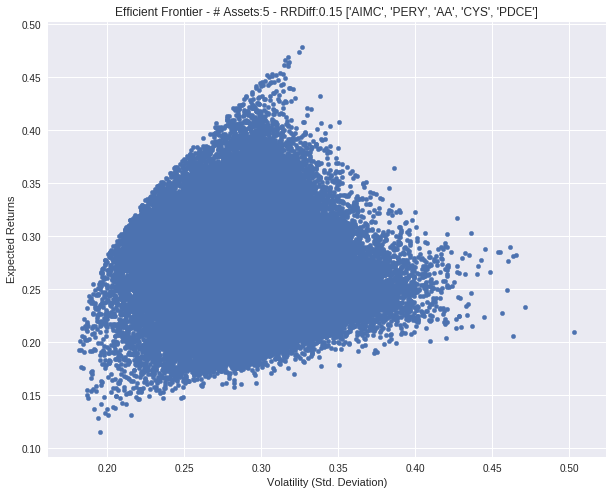

['TG', 'QTS', 'THRM', 'DENN', 'SMP']
# 2983 , RRDiff: -0.0208407213454
['SUI', 'REI', 'RUBI', 'DWSN', 'VLGEA']
# 2984 , RRDiff: -0.00570314556862
['GVA', 'GRIF', 'KELYA', 'CCRN', 'KTWO']
# 2985 , RRDiff: -0.12445321605
['UNH', 'RNWK', 'AE', 'SRE', 'GMO']
# 2986 , RRDiff: -0.0170290031847
['SPRT', 'TER', 'UCBI', 'LHCG', 'RGLD']
# 2987 , RRDiff: -0.0777111895733
['UCFC', 'ETH', 'BR', 'RPAI', 'AGTC']
# 2988 , RRDiff: -0.0234361604944
['ESCA', 'FIVN', 'TROW', 'INN', 'TFSL']
# 2989 , RRDiff: 0.0343825977632
['HRTG', 'SCHN', 'NETE', 'PEI', 'ORM']
# 2990 , RRDiff: 0.0300631359668
['MXIM', 'DLX', 'PAYC', 'CWH', 'BRO']
# 2991 , RRDiff: 0.156532630466


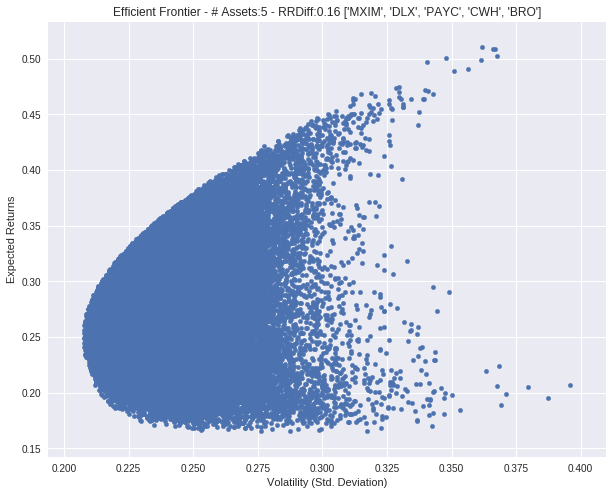

['YELP', 'DY', 'TPH', 'HNI', 'WTM']
# 2992 , RRDiff: -0.112727544
['SBAC', 'MAIN', 'BANF', 'HSY', 'NLSN']
# 2993 , RRDiff: -0.0040586550675
['DBD', 'NNI', 'EVR', 'MAR', 'WIFI']
# 2994 , RRDiff: -0.0775632233623
['MGRC', 'NYRT', 'NBTB', 'NX', 'NYT']
# 2995 , RRDiff: -0.104332509397
['BTU', 'OLP', 'DDD', 'MRC', 'NLSN']
# 2996 , RRDiff: -0.0891053691321
['RGA', 'HMN', 'RBC', 'BXS', 'WGL']
# 2997 , RRDiff: -0.0710605648529
['AINV', 'TJX', 'XCRA', 'ERIE', 'ETM']
# 2998 , RRDiff: -0.061122948714
['USAP', 'TNK', 'CLVS', 'SSI', 'KR']
# 2999 , RRDiff: -0.0746263838225
['AAON', 'PRIM', 'BRKR', 'KRC', 'TMK']
# 3000 , RRDiff: -0.0508664779786
['KOP', 'KBR', 'SGMO', 'SPB', 'CCF']
# 3001 , RRDiff: -0.00668557369279
['GARS', 'REI', 'SPN', 'OSUR', 'CHDN']
# 3002 , RRDiff: -0.0667686723845
['BHE', 'BLL', 'SLRC', 'EV', 'IGT']
# 3003 , RRDiff: -0.0305847250631
['MXIM', 'EZPW', 'VSI', 'UBSH', 'X']
# 3004 , RRDiff: -0.120005489958
['CERS', 'KAR', 'MD', 'SMG', 'SYKE']
# 3005 , RRDiff: 0.00406861348163
['ADI

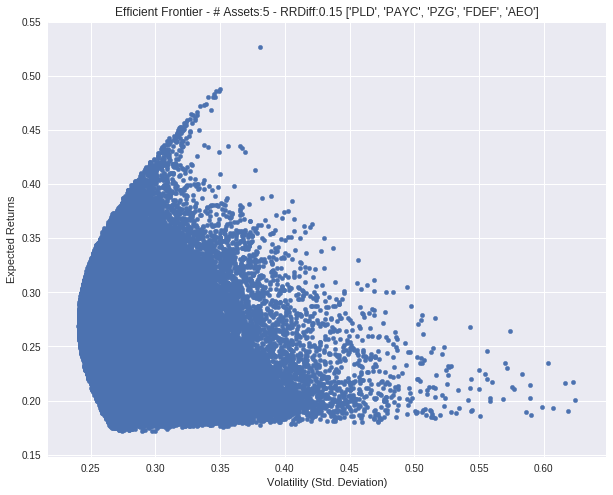

['BRSS', 'DST', 'MTD', 'MIND', 'MGNX']
# 3021 , RRDiff: -0.00822645316289
['GHC', 'CPLA', 'AFG', 'FBNK', 'AMZN']
# 3022 , RRDiff: -0.0121813029904
['GLT', 'UBNT', 'UBSH', 'FCSC', 'STWD']
# 3023 , RRDiff: -0.0256439686548
['MRK', 'OGS', 'INTU', 'CWH', 'PETS']
# 3024 , RRDiff: 0.0690906688312
['ESL', 'CBB', 'MON', 'VG', 'RHT']
# 3025 , RRDiff: -0.073146478006
['ATRC', 'MLHR', 'ENR', 'IDCC', 'CPB']
# 3026 , RRDiff: -0.0834033786808
['BFAM', 'CZNC', 'SBAC', 'RS', 'EIX']
# 3027 , RRDiff: 0.0636220856887
['CHFC', 'GDOT', 'AMWD', 'BPOP', 'CMTL']
# 3028 , RRDiff: -0.0860627842519
['AMNB', 'HF', 'AFSI', 'SWKS', 'GPRE']
# 3029 , RRDiff: -0.053197329553
['OCLR', 'ZUMZ', 'VLO', 'WLK', 'NRIM']
# 3030 , RRDiff: -0.0421788186883
['UFPT', 'ALXN', 'LEA', 'CETV', 'PZG']
# 3031 , RRDiff: 0.0492054843346
['FORR', 'CYTK', 'DXYN', 'BMS', 'PRI']
# 3032 , RRDiff: -0.012123866283
['CALD', 'VTL', 'BNFT', 'UTI', 'TPR']
# 3033 , RRDiff: 0.366678399327


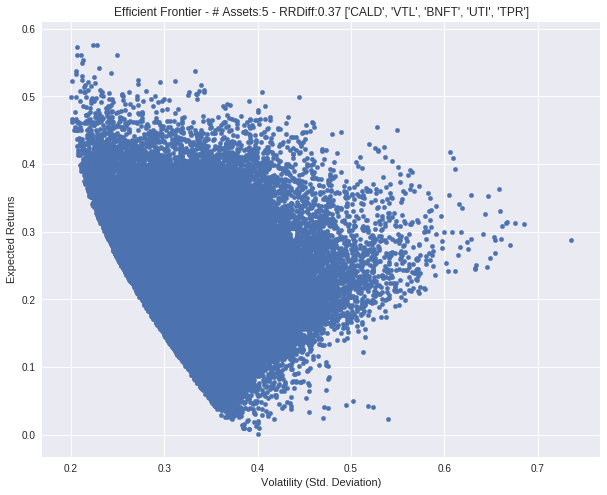

['CALM', 'ACHN', 'FNSR', 'IMKTA', 'WAFD']
# 3034 , RRDiff: -0.0601705449641
['AMSC', 'HSII', 'ARR', 'NL', 'ANF']
# 3035 , RRDiff: -0.121149023957
['MPC', 'OXM', 'NVDA', 'RAIL', 'GE']
# 3036 , RRDiff: 0.00983514386825
['RDNT', 'LL', 'WRLD', 'GALT', 'AGO']
# 3037 , RRDiff: -0.0202030415176
['PWOD', 'IDTI', 'HELE', 'LTS', 'ITRI']
# 3038 , RRDiff: -0.0798410113204
['CMC', 'FLR', 'NTGR', 'EFX', 'PEB']
# 3039 , RRDiff: -0.0798551233379
['AIT', 'LQ', 'DHR', 'ELGX', 'LANC']
# 3040 , RRDiff: -0.0415543821904
['CARB', 'AVT', 'NATH', 'GRMN', 'MD']
# 3041 , RRDiff: -0.00658721762534
['EHTH', 'BBGI', 'MANH', 'DK', 'AMCX']
# 3042 , RRDiff: -0.0850107267783
['MCC', 'BKU', 'MITK', 'EXTR', 'GEOS']
# 3043 , RRDiff: -0.0559073477483
['AMAG', 'CXW', 'DG', 'NWHM', 'CSRA']
# 3044 , RRDiff: -0.00564187729003
['MSCI', 'TPX', 'SSTK', 'FLIC', 'ROIC']
# 3045 , RRDiff: -0.00838940526661
['PCH', 'ODP', 'BOKF', 'ATHN', 'FCNCA']
# 3046 , RRDiff: -0.0931023088407
['CSWC', 'GNMK', 'LMNX', 'SVU', 'WGL']
# 3047 , RRDiff

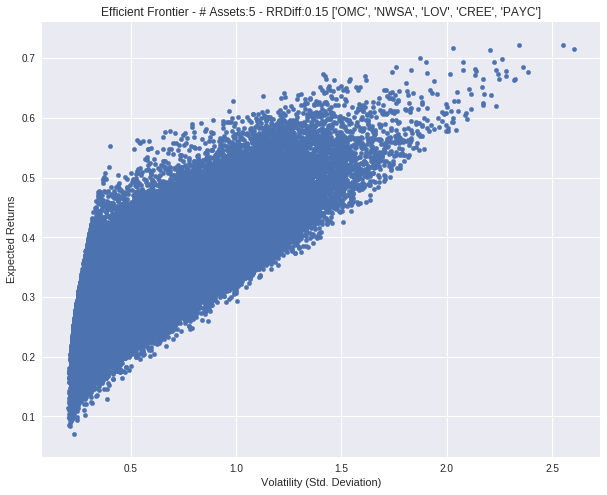

['SN', 'GHM', 'LRN', 'AREX', 'IIVI']
# 3079 , RRDiff: -0.111854910538
['CUI', 'MXIM', 'KO', 'DPZ', 'MDRX']
# 3080 , RRDiff: 0.029854593811
['KND', 'QTM', 'FDEF', 'WMT', 'SN']
# 3081 , RRDiff: -0.0919145820326
['ATSG', 'OCFC', 'OPB', 'NVR', 'ETR']
# 3082 , RRDiff: 0.00355844777039
['BRK_B', 'FICO', 'ISRG', 'ANGO', 'ETH']
# 3083 , RRDiff: -0.0463152330066
['AXL', 'SCCO', 'REXR', 'ED', 'IBP']
# 3084 , RRDiff: 0.0993849392017
['SAFM', 'CTAS', 'RRC', 'BWINB', 'JOE']
# 3085 , RRDiff: -0.0688400810304
['GNMK', 'MC', 'TCPC', 'HELE', 'COUP']
# 3086 , RRDiff: 0.023242506264
['PEGI', 'TAST', 'VR', 'LAD', 'HMHC']
# 3087 , RRDiff: -0.0709536740236
['QCOM', 'MKL', 'ABBV', 'SPN', 'ZOES']
# 3088 , RRDiff: 0.0139365135595
['LXU', 'NOC', 'CMG', 'FLT', 'TR']
# 3089 , RRDiff: 0.0510836177591
['ITT', 'AXE', 'SPNS', 'C', 'RLI']
# 3090 , RRDiff: -0.0592325565253
['INGR', 'STL', 'PLOW', 'ARNC', 'BPTH']
# 3091 , RRDiff: 0.0271721288785
['AINV', 'TTWO', 'FB', 'ACRX', 'KMX']
# 3092 , RRDiff: 0.00604149798499
['P

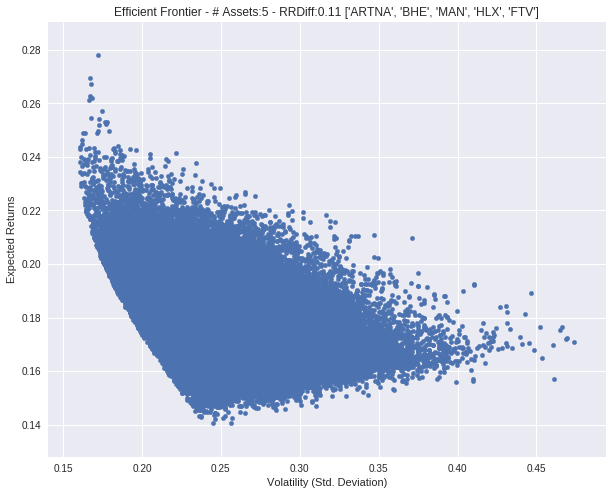

['HRC', 'DSPG', 'TG', 'FLIR', 'RPAI']
# 3096 , RRDiff: -0.0409226641157
['REV', 'ATO', 'IHC', 'GAIA', 'ABG']
# 3097 , RRDiff: -0.0713529940438
['MS', 'CMG', 'REIS', 'EEFT', 'ARRY']
# 3098 , RRDiff: -0.0387495906793
['THR', 'ENT', 'CYH', 'COBZ', 'XRAY']
# 3099 , RRDiff: -0.0855167693289
['HTGC', 'COL', 'NRG', 'XONE', 'CBK']
# 3100 , RRDiff: -0.0856435184617
['CE', 'CATM', 'YORW', 'DNKN', 'BCEI']
# 3101 , RRDiff: -0.00362251413832
['IDRA', 'NUAN', 'INFN', 'EW', 'RNG']
# 3102 , RRDiff: 0.0435688205151
['ALKS', 'MKTX', 'CCI', 'ENR', 'GNRC']
# 3103 , RRDiff: -0.0103789406852
['MU', 'ERA', 'DAR', 'CENTA', 'WSFS']
# 3104 , RRDiff: -0.0989860846213
['USAP', 'EWBC', 'CONN', 'LDL', 'FAF']
# 3105 , RRDiff: -0.0374547112927
['KMX', 'SRI', 'SF', 'CXW', 'HMSY']
# 3106 , RRDiff: -0.0612494734279
['UBA', 'LSTR', 'CAKE', 'TUES', 'AXS']
# 3107 , RRDiff: -0.0577880746708
['MFA', 'CPB', 'POWI', 'MGRC', 'AOI']
# 3108 , RRDiff: -0.0642630953101
['CMA', 'CAVM', 'AMRC', 'LOW', 'FPRX']
# 3109 , RRDiff: -0.0768

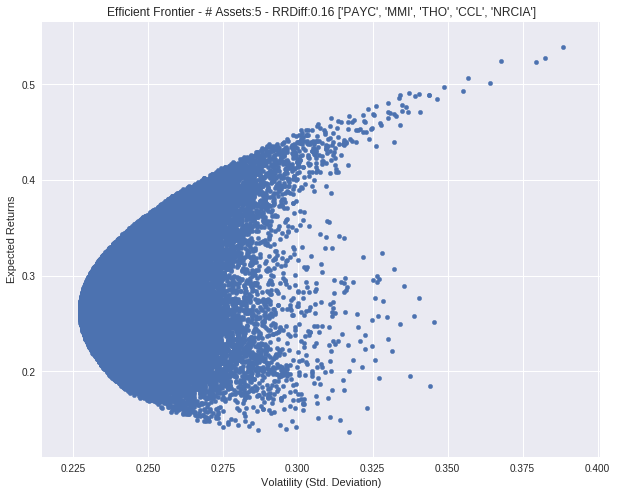

['SRI', 'OREX', 'AJG', 'HSIC', 'LGND']
# 3132 , RRDiff: -0.0630776179692
['FWRD', 'UNP', 'UNH', 'UBSI', 'FRT']
# 3133 , RRDiff: -0.0134616813382
['MASI', 'CLW', 'TITN', 'ZBRA', 'PH']
# 3134 , RRDiff: -0.0523159927591
['KTOS', 'CVGI', 'LPX', 'SHLM', 'INFN']
# 3135 , RRDiff: -0.198576687793
['EGP', 'ALSN', 'P', 'FMI', 'FBIZ']
# 3136 , RRDiff: -0.0128946879398
['STE', 'MRK', 'GOGO', 'MNST', 'GGP']
# 3137 , RRDiff: -0.00685065784465
['HLF', 'CSCO', 'OSK', 'MPW', 'SRCE']
# 3138 , RRDiff: -0.0724428246694
['JLL', 'KFRC', 'WWD', 'DJCO', 'EE']
# 3139 , RRDiff: -0.0385111849899
['FMC', 'HFWA', 'LEG', 'NICK', 'PBYI']
# 3140 , RRDiff: -0.0268119549593
['BERY', 'NGS', 'FOXA', 'OMEX', 'FTK']
# 3141 , RRDiff: 0.0487850933758
['OCN', 'CENX', 'IMI', 'VNCE', 'SJI']
# 3142 , RRDiff: -0.0777630003531
['NGHC', 'AGO', 'UTHR', 'SONC', 'EMCI']
# 3143 , RRDiff: -0.0195892605898
['AON', 'CLDT', 'XPO', 'ARR', 'ARC']
# 3144 , RRDiff: -0.0599570696214
['PTSI', 'JMBA', 'UBA', 'NCMI', 'OMER']
# 3145 , RRDiff: -0.08

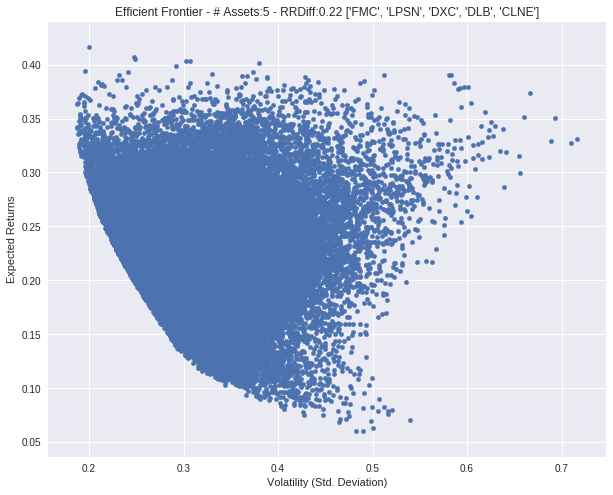

['AZZ', 'UBNK', 'UPL', 'TR', 'SIF']
# 3149 , RRDiff: -0.101109165345
['CHTR', 'ADC', 'CALD', 'BEN', 'PNM']
# 3150 , RRDiff: 0.0399446337563
['CMG', 'LXU', 'BHB', 'GNC', 'BCC']
# 3151 , RRDiff: -0.0467285435608
['UMH', 'HAWK', 'HRTX', 'LSCC', 'SLRC']
# 3152 , RRDiff: -0.0356543570323
['SHLM', 'WSO', 'MRC', 'ERII', 'SFNC']
# 3153 , RRDiff: -0.100936210634
['INT', 'PENN', 'DRQ', 'MA', 'PEBO']
# 3154 , RRDiff: 0.0379179672411
['MDXG', 'BH', 'MSFT', 'ORM', 'FLIC']
# 3155 , RRDiff: -0.0189636036847
['BAC', 'ALGN', 'MLM', 'RSO', 'NCS']
# 3156 , RRDiff: -0.129608610504
['CLVS', 'STC', 'FLIR', 'ALSN', 'LB']
# 3157 , RRDiff: -0.00486510406039
['QUAD', 'RLI', 'AGN', 'CHD', 'ISRG']
# 3158 , RRDiff: 0.00912085858887
['SEMG', 'FCX', 'ISBC', 'IDCC', 'GSBD']
# 3159 , RRDiff: -0.0345920153427
['PBH', 'FRAN', 'TRST', 'BBY', 'OREX']
# 3160 , RRDiff: -0.158714798851
['SM', 'MSG', 'VAR', 'DAL', 'SCG']
# 3161 , RRDiff: 0.0323069463774
['TRK', 'CMC', 'HVT', 'CIEN', 'XONE']
# 3162 , RRDiff: -0.146851849684
['

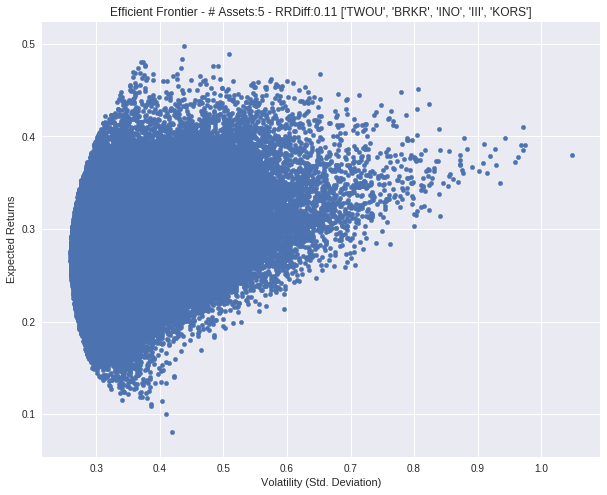

['WINA', 'PQ', 'MMI', 'AMBA', 'SHW']
# 3168 , RRDiff: 0.0779051734333
['DIS', 'LBAI', 'PDFS', 'PTIE', 'ASPS']
# 3169 , RRDiff: -0.0961186546399
['LOGM', 'ABT', 'HNI', 'OCFC', 'DX']
# 3170 , RRDiff: -0.043497887828
['MCBC', 'AHH', 'GEOS', 'ADI', 'CREE']
# 3171 , RRDiff: -0.0551825911779
['ZOES', 'KRA', 'ZIOP', 'ASC', 'IMI']
# 3172 , RRDiff: -0.151623209162
['AFG', 'WABC', 'CHD', 'ORM', 'AMPE']
# 3173 , RRDiff: 0.0202446507439
['AOI', 'QTS', 'GFN', 'FMBI', 'VSAT']
# 3174 , RRDiff: -0.034735805747
['AJG', 'ACRE', 'NYLD', 'HII', 'AE']
# 3175 , RRDiff: 0.0607122880136
['EXC', 'AHL', 'AMZN', 'TXN', 'WLB']
# 3176 , RRDiff: -0.0720876745612
['NVAX', 'DOC', 'MSTR', 'RRGB', 'OSUR']
# 3177 , RRDiff: -0.0308764962995
['HNI', 'PSEC', 'APD', 'AINV', 'STAA']
# 3178 , RRDiff: -0.106071655263
['NYNY', 'USAP', 'RRTS', 'ERII', 'ZGNX']
# 3179 , RRDiff: -0.150063053999
['RSPP', 'MCHP', 'RNR', 'AEP', 'CKH']
# 3180 , RRDiff: -0.0153761758277
['MNTA', 'OGS', 'DEPO', 'NTRS', 'AME']
# 3181 , RRDiff: 0.036250157

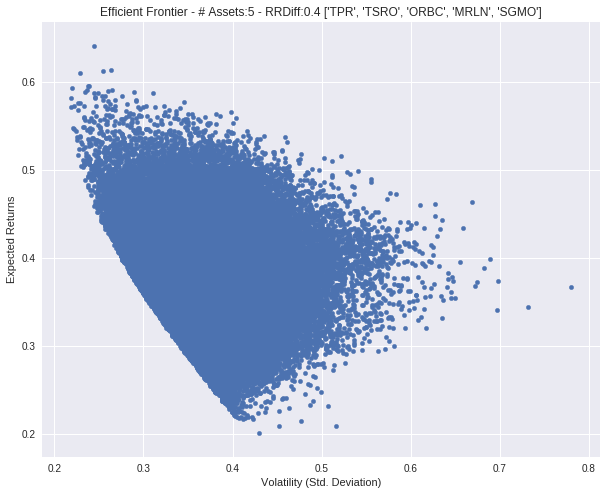

['TNK', 'VDSI', 'CLDT', 'XPO', 'LSTR']
# 3191 , RRDiff: -0.0249638020696
['AMC', 'UTMD', 'AFG', 'IGT', 'ARC']
# 3192 , RRDiff: -0.0388275304926
['GLT', 'NSP', 'ONB', 'HLT', 'TZOO']
# 3193 , RRDiff: 0.0545953146623
['IP', 'PVH', 'EFII', 'DTE', 'CLDX']
# 3194 , RRDiff: -0.0555642388885
['HCKT', 'INTC', 'MSA', 'AEO', 'ZEN']
# 3195 , RRDiff: 0.0197091168864
['WCC', 'WRK', 'PFIS', 'ZIXI', 'TILE']
# 3196 , RRDiff: -0.0899558832054
['TREE', 'CSGP', 'LFUS', 'LEN', 'CORR']
# 3197 , RRDiff: 0.0335328078028
['MG', 'CMS', 'DAR', 'AGO', 'HTLD']
# 3198 , RRDiff: -0.091188333537
['STAA', 'UBA', 'EXC', 'SXI', 'SALT']
# 3199 , RRDiff: -0.0741777198712
['BGC', 'RE', 'LMNX', 'MPX', 'MBFI']
# 3200 , RRDiff: -0.0831052327124
['CMCO', 'ITT', 'TESS', 'MOFG', 'GPRE']
# 3201 , RRDiff: -0.0932912300559
['VVI', 'BPI', 'HIL', 'AVID', 'DAKT']
# 3202 , RRDiff: -0.145006279407
['HTLD', 'BCO', 'RVNC', 'IDA', 'CBSH']
# 3203 , RRDiff: -0.063195483825
['SIR', 'PES', 'DDS', 'OPB', 'ETM']
# 3204 , RRDiff: -0.0787266375969

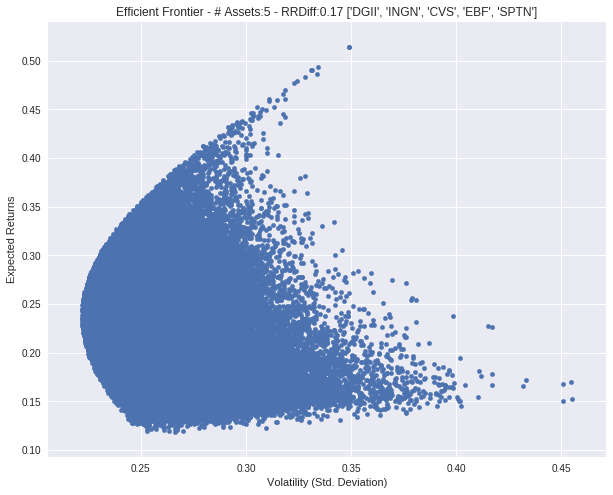

['CAC', 'AAP', 'HTGC', 'REN', 'ETN']
# 3234 , RRDiff: -0.068236930735
['SEMG', 'COLB', 'KEM', 'KTWO', 'ECYT']
# 3235 , RRDiff: -0.111104665561
['TTEK', 'TWI', 'CHDN', 'SAMG', 'HTLD']
# 3236 , RRDiff: -0.0764021536006
['XOM', 'SPSC', 'CHDN', 'ULTA', 'EXC']
# 3237 , RRDiff: -0.0159274045802
['IFF', 'CFX', 'HCA', 'LRCX', 'TPH']
# 3238 , RRDiff: -0.0192756249009
['GBL', 'CATO', 'BANC', 'VRTS', 'BEN']
# 3239 , RRDiff: -0.0513172361037
['IBKR', 'DXCM', 'FFIN', 'UMPQ', 'DHI']
# 3240 , RRDiff: -0.0890901204534
['AXDX', 'GNC', 'BXS', 'SBUX', 'GRPN']
# 3241 , RRDiff: -0.0694362564795
['MANT', 'EXC', 'DWDP', 'UMH', 'CINF']
# 3242 , RRDiff: -0.0653378669766
['BK', 'NWN', 'WTI', 'HEAR', 'EBF']
# 3243 , RRDiff: -0.0889128455892
['CASS', 'CPK', 'NL', 'WRB', 'CCO']
# 3244 , RRDiff: -0.0313172320763
['ACRX', 'CSU', 'PG', 'PBCT', 'FICO']
# 3245 , RRDiff: -0.0586548035444
['FRBK', 'ANIK', 'CYTX', 'SSP', 'CI']
# 3246 , RRDiff: -0.081147728435
['POR', 'EXPE', 'LZB', 'WR', 'MGLN']
# 3247 , RRDiff: -0.067724

# 3348 , RRDiff: -0.0778179440006
['JCOM', 'VMW', 'ELY', 'RPXC', 'AE']
# 3349 , RRDiff: -0.0850598501799
['BDSI', 'ARW', 'SCL', 'RGLS', 'WMT']
# 3350 , RRDiff: -0.0766672150047
['YUM', 'LPSN', 'UTHR', 'STAG', 'TRV']
# 3351 , RRDiff: 0.00395879174206
['ENTA', 'OAS', 'Z', 'MDP', 'AXAS']
# 3352 , RRDiff: 0.0789360977648
['CLCT', 'NVAX', 'AXDX', 'QADA', 'PGEM']
# 3353 , RRDiff: -0.0120844729527
['CYTX', 'ESPR', 'CRVL', 'III', 'ARNC']
# 3354 , RRDiff: -0.0335161256681
['EGAN', 'STLD', 'TSLA', 'PSB', 'BRKS']
# 3355 , RRDiff: 0.021679878888
['GMO', 'GNE', 'NYT', 'NSM', 'AMSF']
# 3356 , RRDiff: -0.0926960306508
['ATNI', 'AMTD', 'JBT', 'TRN', 'ODFL']
# 3357 , RRDiff: 0.00813705046728
['MNRO', 'UCFC', 'ARW', 'FLO', 'WTS']
# 3358 , RRDiff: -0.0345422023068
['VC', 'VRNT', 'CLI', 'LII', 'EFX']
# 3359 , RRDiff: -0.0401732117962
['SIX', 'PNFP', 'CFR', 'SWKS', 'GBL']
# 3360 , RRDiff: 0.0577195268971
['NYLD', 'DXC', 'CHD', 'LXU', 'TIF']
# 3361 , RRDiff: 0.214650233844


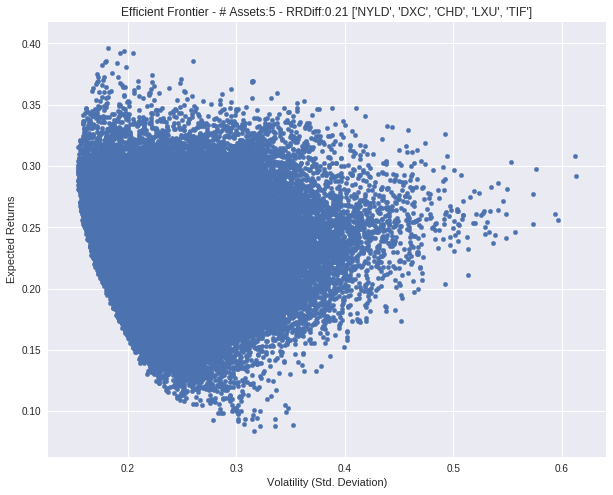

['STAA', 'TROX', 'OSIS', 'NVDA', 'IIVI']
# 3362 , RRDiff: -0.0129097072169
['IPHS', 'COP', 'MANT', 'NSC', 'AAON']
# 3363 , RRDiff: -0.053390595438
['NBIX', 'NTAP', 'BRT', 'UAA', 'DST']
# 3364 , RRDiff: -0.0526268262992
['NR', 'ITIC', 'COKE', 'SYMC', 'TSS']
# 3365 , RRDiff: -0.0391454719121
['BDSI', 'CNMD', 'DUK', 'MDSO', 'HD']
# 3366 , RRDiff: -0.0237756590381
['KAMN', 'USPH', 'MTN', 'PLXS', 'SJW']
# 3367 , RRDiff: -0.0516137738399
['BIDU', 'SPTN', 'ALGT', 'TDY', 'BDC']
# 3368 , RRDiff: -0.0191761705068
['EMN', 'BGG', 'AAL', 'GORO', 'CPRT']
# 3369 , RRDiff: -0.0248913436073
['CAC', 'OFLX', 'HAWK', 'NPTN', 'EXLS']
# 3370 , RRDiff: -0.0671702070376
['STZ', 'MANT', 'NVEC', 'SEAS', 'VIVO']
# 3371 , RRDiff: 0.00152371338777
['BMRN', 'LABL', 'HSTM', 'REI', 'FTD']
# 3372 , RRDiff: -0.0147587356298
['AVNW', 'BGFV', 'NLSN', 'CPSS', 'RGA']
# 3373 , RRDiff: -0.0681084251549
['GHC', 'DY', 'BXC', 'MDRX', 'CW']
# 3374 , RRDiff: -0.079461153441
['PRGX', 'NFBK', 'PLUG', 'SNHY', 'MTG']
# 3375 , RRDiff:

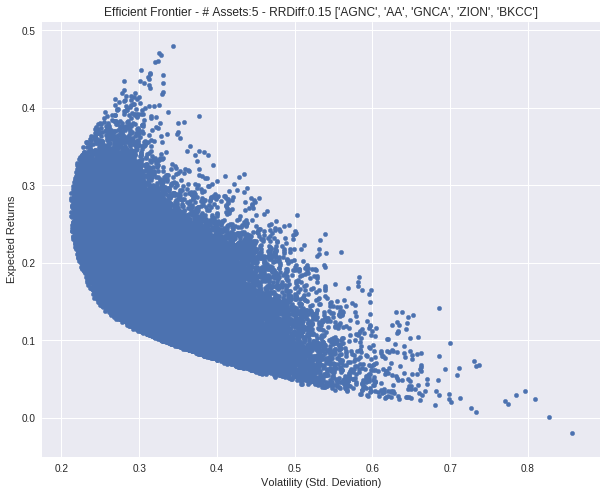

['VC', 'MED', 'MET', 'GNCA', 'OFLX']
# 3449 , RRDiff: 0.0161139974855
['ORI', 'MRVL', 'CPLA', 'VSAT', 'REN']
# 3450 , RRDiff: -0.08615160768
['ADUS', 'RUBI', 'ELGX', 'NTAP', 'GILD']
# 3451 , RRDiff: -0.00680651463486
['ENTG', 'ABCB', 'CRMT', 'WNC', 'ARWR']
# 3452 , RRDiff: -0.0592933952132
['XXII', 'HTH', 'SHOS', 'VLO', 'MLI']
# 3453 , RRDiff: -0.0355928382193
['CIX', 'ARNA', 'SNSS', 'SBSI', 'GM']
# 3454 , RRDiff: -0.0963531042962
['CHRW', 'CFFI', 'CMP', 'NRG', 'ADUS']
# 3455 , RRDiff: 0.00434582570415
['UBNK', 'MTOR', 'GSBC', 'GEOS', 'LEA']
# 3456 , RRDiff: 0.000978756284441
['NCR', 'ORBC', 'KOPN', 'KEYW', 'TRS']
# 3457 , RRDiff: -0.152718556637
['ROG', 'IVR', 'AXL', 'ACOR', 'COF']
# 3458 , RRDiff: -0.0519822418115
['PFMT', 'TAL', 'UFCS', 'GRMN', 'CUI']
# 3459 , RRDiff: 0.110440724971


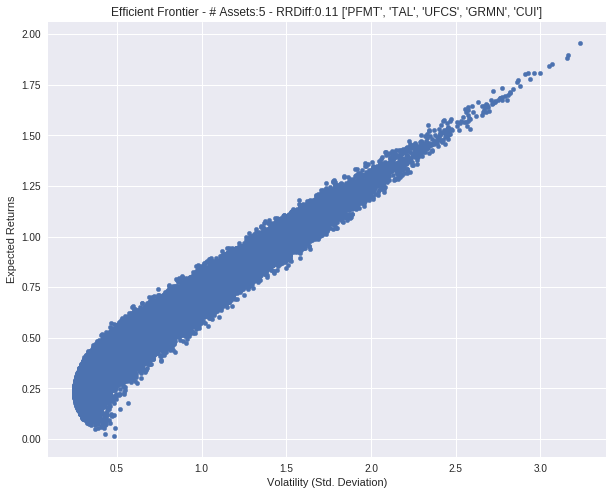

['TBBK', 'TTS', 'IPHS', 'AWI', 'CENTA']
# 3460 , RRDiff: -0.120952292092
['IPHS', 'IRWD', 'FLXN', 'EOG', 'EXAS']
# 3461 , RRDiff: -0.0388874319958
['MTDR', 'ALK', 'NPO', 'USAP', 'FTNT']
# 3462 , RRDiff: -0.0147706490382
['EPM', 'MAR', 'SXC', 'BID', 'TMUS']
# 3463 , RRDiff: -0.0706839622275
['HON', 'CACC', 'FCN', 'CTAS', 'ATRO']
# 3464 , RRDiff: -0.00427291382628
['FLT', 'SASR', 'PAYX', 'BCEI', 'BFAM']
# 3465 , RRDiff: 0.0948553986314
['FFIC', 'EVC', 'VRSK', 'GLNG', 'GTT']
# 3466 , RRDiff: 0.0273689134949
['CHCO', 'GTXI', 'JBLU', 'MTRN', 'ATRS']
# 3467 , RRDiff: -0.136575459878
['TAL', 'CROX', 'SDRL', 'UAL', 'ATNI']
# 3468 , RRDiff: 0.0748415119261
['RP', 'CYS', 'BDGE', 'UHS', 'HAFC']
# 3469 , RRDiff: -0.0310526031631
['TCPC', 'JCI', 'CZR', 'RFP', 'I']
# 3470 , RRDiff: -0.0734461684746
['WTS', 'XNCR', 'VOD', 'LBAI', 'GLAD']
# 3471 , RRDiff: -0.0389550690838
['RSO', 'EEFT', 'IVC', 'SGYP', 'BURL']
# 3472 , RRDiff: 0.0979530491022
['EV', 'BSRR', 'ROG', 'HPQ', 'NEE']
# 3473 , RRDiff: -0.043

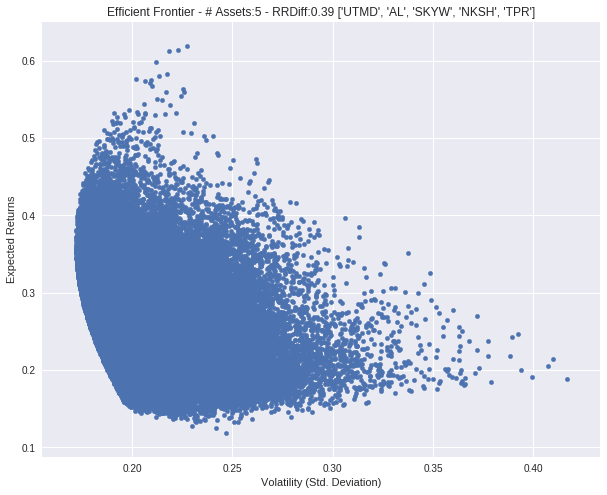

['ROSE', 'XRM', 'LH', 'ACM', 'KERX']
# 3500 , RRDiff: -0.0361816147481
['GOV', 'BXS', 'HXL', 'DGICA', 'URG']
# 3501 , RRDiff: -0.106088349094
['CPF', 'ACRE', 'MTOR', 'AAWW', 'CSS']
# 3502 , RRDiff: -0.127417027392
['HASI', 'PLOW', 'PAYX', 'CZNC', 'PCH']
# 3503 , RRDiff: 0.0119743214638
['GAIN', 'CECO', 'HMN', 'VFC', 'ADP']
# 3504 , RRDiff: -0.0710554101204
['RJF', 'SXC', 'RRTS', 'TREX', 'VAC']
# 3505 , RRDiff: 0.0711752278929
['SBSI', 'SMP', 'BBOX', 'GORO', 'MTW']
# 3506 , RRDiff: -0.0633562556837
['CRL', 'FNB', 'PAG', 'TZOO', 'SFL']
# 3507 , RRDiff: -0.0915919363785
['GPX', 'MHK', 'JKHY', 'GES', 'OII']
# 3508 , RRDiff: -0.0626543948837
['FUL', 'WMB', 'Z', 'GLF', 'WIFI']
# 3509 , RRDiff: 0.0138152211714
['WAL', 'SM', 'QTWO', 'FBIZ', 'CASH']
# 3510 , RRDiff: 0.0185178945343
['PVH', 'MAS', 'KIM', 'SYKE', 'SNCR']
# 3511 , RRDiff: -0.11205623131
['OGE', 'PRAA', 'CERN', 'LNG', 'MVC']
# 3512 , RRDiff: -0.032305473832
['FLR', 'SREV', 'DISCA', 'PERY', 'VOXX']
# 3513 , RRDiff: -0.127921227959
[

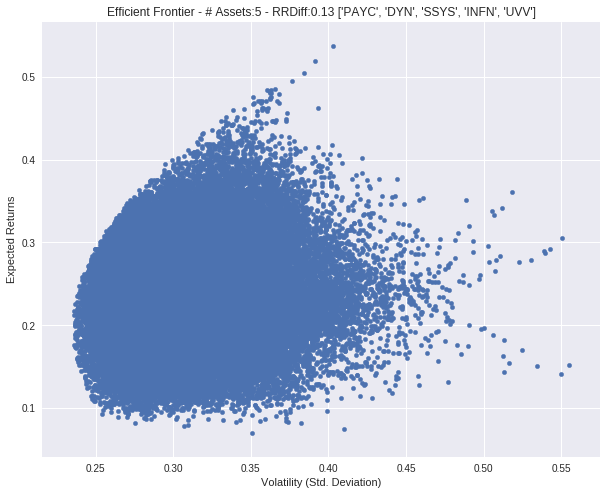

['OTTR', 'JONE', 'HPP', 'QSII', 'ALLE']
# 3583 , RRDiff: -0.0052230066093
['BMTC', 'CBI', 'MHLD', 'ACHC', 'CIR']
# 3584 , RRDiff: -0.0761963293757
['IBOC', 'STRL', 'XYL', 'WSTL', 'HRB']
# 3585 , RRDiff: 0.00620899462785
['EROS', 'SON', 'SMG', 'ABC', 'SALT']
# 3586 , RRDiff: -0.0570732770561
['YELP', 'NKTR', 'CHCO', 'CVG', 'CTT']
# 3587 , RRDiff: -0.0916701712479
['ENV', 'SPRT', 'TITN', 'DMRC', 'CYTK']
# 3588 , RRDiff: -0.0720199942051
['MDR', 'GFF', 'FSS', 'TMO', 'MANT']
# 3589 , RRDiff: -0.0745264387951
['MET', 'BC', 'LION', 'WLH', 'EXP']
# 3590 , RRDiff: -0.10818482193
['MSL', 'AMC', 'AVEO', 'TRMK', 'JWN']
# 3591 , RRDiff: -0.123351578303
['CTG', 'SSD', 'SHLO', 'FC', 'AKS']
# 3592 , RRDiff: -0.113854854956
['NOV', 'USB', 'FBP', 'NMFC', 'CVLT']
# 3593 , RRDiff: -0.0397933554315
['JBL', 'AGTC', 'AVEO', 'GBCI', 'FFBC']
# 3594 , RRDiff: -0.15745843492
['SJM', 'AWR', 'VICR', 'NDLS', 'BIG']
# 3595 , RRDiff: -0.0553488888717
['FICO', 'GWR', 'XCRA', 'LADR', 'MTRX']
# 3596 , RRDiff: -0.056406

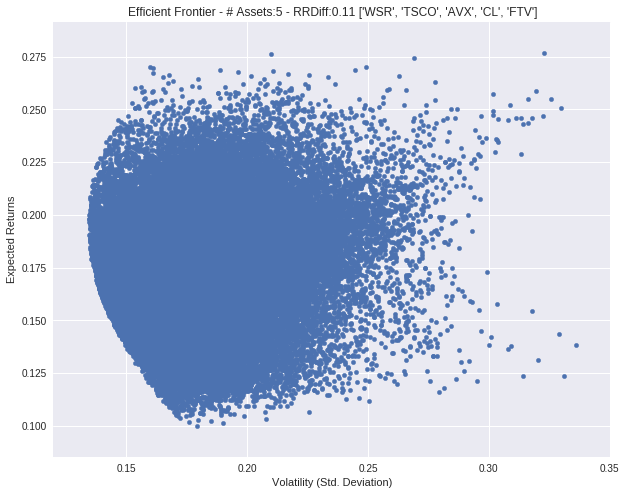

['KERX', 'VRNT', 'CSU', 'JONE', 'CBI']
# 3619 , RRDiff: -0.130195553124
['GTS', 'ICE', 'CRCM', 'CBSH', 'AL']
# 3620 , RRDiff: -0.0796323351713
['CRM', 'BBX', 'TNDM', 'WSR', 'LCUT']
# 3621 , RRDiff: -0.0476927653205
['ALCO', 'EFSC', 'SCVL', 'OLP', 'MBUU']
# 3622 , RRDiff: -0.0617296256459
['SGMS', 'XYL', 'APTV', 'VRTX', 'BPTH']
# 3623 , RRDiff: 0.0378657514831
['STL', 'MLR', 'RSG', 'RH', 'RAVN']
# 3624 , RRDiff: -0.0058523057301
['SWKS', 'GPC', 'CL', 'SUNS', 'AGX']
# 3625 , RRDiff: -0.0397292545195
['SPNS', 'BLDR', 'RXN', 'LHO', 'ADSK']
# 3626 , RRDiff: -0.0976962748993
['PLAB', 'JKHY', 'DF', 'LRCX', 'ACRX']
# 3627 , RRDiff: -0.0843601899232
['FLXN', 'FRBK', 'NDAQ', 'STC', 'COF']
# 3628 , RRDiff: -0.0875980072824
['IPG', 'EXPD', 'ETR', 'EPR', 'EBIO']
# 3629 , RRDiff: -0.0504581109801
['T', 'DENN', 'LBY', 'PCH', 'STZ']
# 3630 , RRDiff: -0.0531162186416
['OPB', 'LFVN', 'CLD', 'VZ', 'PENN']
# 3631 , RRDiff: -0.055096250544
['ORI', 'AVEO', 'CHE', 'PPBI', 'KEM']
# 3632 , RRDiff: -0.056640566

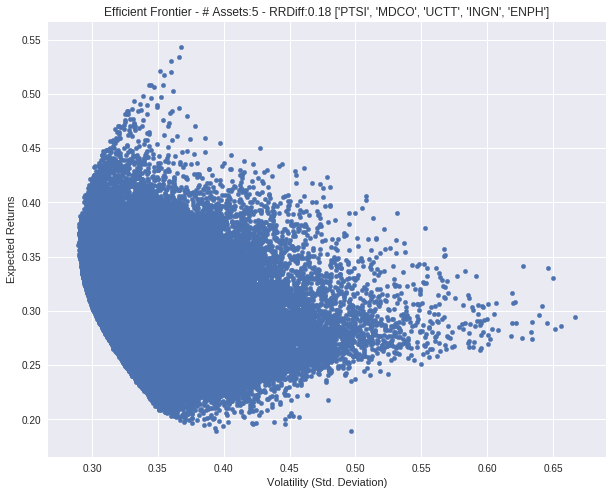

['ZEN', 'STWD', 'MGLN', 'CROX', 'SPTN']
# 3637 , RRDiff: 0.0247925896653
['SREV', 'STI', 'ALK', 'FRAN', 'RUTH']
# 3638 , RRDiff: -0.191712594436
['HWCC', 'ALL', 'HAWK', 'CEVA', 'FMI']
# 3639 , RRDiff: -0.0397766985831
['WBA', 'ALGN', 'ROCK', 'EQT', 'LEE']
# 3640 , RRDiff: -0.0717640959089
['PE', 'GIFI', 'LAZ', 'KMG', 'JKHY']
# 3641 , RRDiff: -0.0627281391619
['AMED', 'VSTM', 'STC', 'DISCK', 'PTIE']
# 3642 , RRDiff: -0.0954589702927
['CBPX', 'RSO', 'AGII', 'COUP', 'TRV']
# 3643 , RRDiff: -0.0096166661774
['DLX', 'ATSG', 'LINC', 'PBH', 'RMTI']
# 3644 , RRDiff: -0.0639601736559
['INGN', 'CME', 'NWLI', 'STRA', 'PYPL']
# 3645 , RRDiff: 0.186597326088


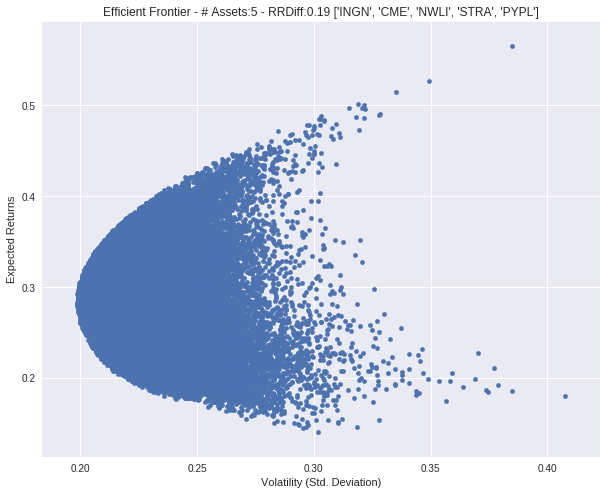

['HOFT', 'GPI', 'IT', 'URI', 'GTXI']
# 3646 , RRDiff: -0.105207934139
['ABT', 'BCO', 'PETS', 'WLTW', 'GT']
# 3647 , RRDiff: -0.0314220689608
['KELYA', 'TTS', 'LMNR', 'IR', 'HOME']
# 3648 , RRDiff: 0.0698218808889
['AMGN', 'OMC', 'S', 'TAP', 'DAR']
# 3649 , RRDiff: -0.0693995639202
['WTFC', 'UEC', 'EDR', 'RGS', 'BMS']
# 3650 , RRDiff: -0.11628066336
['AXAS', 'COUP', 'AMT', 'GBNK', 'BLX']
# 3651 , RRDiff: -0.0224441683525
['TNAV', 'NEO', 'AEP', 'COWN', 'LOV']
# 3652 , RRDiff: -0.0577984380652
['PFS', 'LE', 'THG', 'MBII', 'PCTY']
# 3653 , RRDiff: -0.0763989457466
['ECOL', 'NCR', 'CHEF', 'NLSN', 'BIOS']
# 3654 , RRDiff: -0.0498116766169
['HSII', 'NYRT', 'BKS', 'RNG', 'RBCAA']
# 3655 , RRDiff: 0.00998011922842
['PYPL', 'FOR', 'AMSF', 'HBAN', 'KTOS']
# 3656 , RRDiff: 0.0235071241087
['IBKC', 'RLGY', 'WIX', 'RRTS', 'ZNGA']
# 3657 , RRDiff: 0.00483145355988
['MSM', 'MCF', 'KTWO', 'EXTR', 'SYBT']
# 3658 , RRDiff: -0.0684932337827
['WFC', 'ORA', 'K', 'CVG', 'PSA']
# 3659 , RRDiff: -0.06908747480

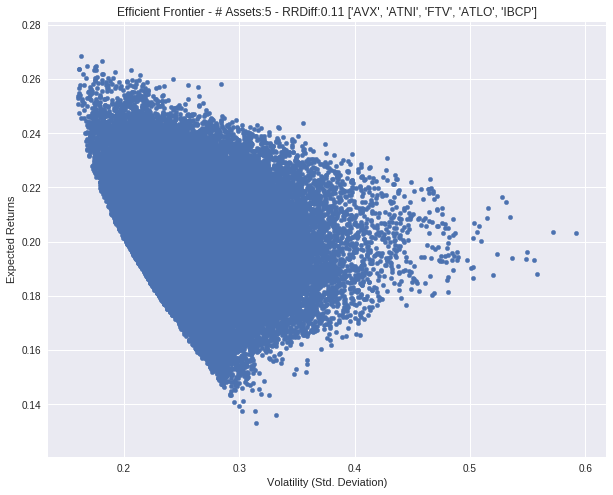

['NDAQ', 'SPG', 'NAVG', 'FBNC', 'INO']
# 3690 , RRDiff: -0.0647458262244
['MTZ', 'HWCC', 'IMGN', 'VR', 'MAR']
# 3691 , RRDiff: -0.058387744084
['LAYN', 'SCHN', 'MDRX', 'ZEN', 'PAY']
# 3692 , RRDiff: 0.012525904552
['GRMN', 'QTWO', 'HCA', 'CVS', 'SVU']
# 3693 , RRDiff: 0.041115681872
['HTBK', 'AGO', 'KEG', 'WTR', 'NBIX']
# 3694 , RRDiff: -0.0829367345019
['PRGO', 'ROSE', 'TSLA', 'SCM', 'TRC']
# 3695 , RRDiff: -0.00443586236878
['CPB', 'APEI', 'ATEN', 'SCM', 'TZOO']
# 3696 , RRDiff: -0.0778715788804
['MOD', 'APOG', 'UPS', 'CLNE', 'MAN']
# 3697 , RRDiff: -0.118129942733
['ECOL', 'PFMT', 'CFFI', 'HI', 'FOXA']
# 3698 , RRDiff: -0.0439763324575
['HRC', 'MRTN', 'AHH', 'BMRC', 'ARWR']
# 3699 , RRDiff: -0.0058222043643
['OSIS', 'VPG', 'ENPH', 'WNC', 'CHH']
# 3700 , RRDiff: -0.0644701345277
['AEGN', 'BBOX', 'MPX', 'IHC', 'FTK']
# 3701 , RRDiff: -0.143448148716
['CVLT', 'CETV', 'OFIX', 'SIG', 'CTRN']
# 3702 , RRDiff: -0.0824569721096
['SGYP', 'TYPE', 'KALU', 'GWR', 'AP']
# 3703 , RRDiff: -0.09928

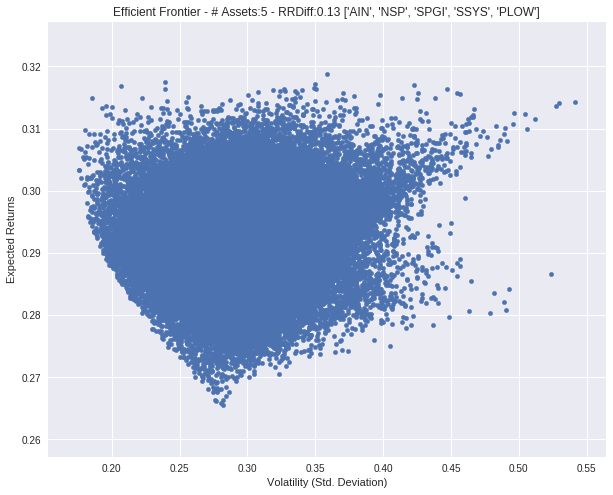

['PERY', 'NUVA', 'BERY', 'ARNC', 'CTS']
# 3728 , RRDiff: 0.0168200554988
['AVNW', 'STWD', 'TBNK', 'WSBC', 'MSTR']
# 3729 , RRDiff: -0.0356757460542
['RWT', 'WDC', 'CRAY', 'HCP', 'FLR']
# 3730 , RRDiff: -0.108144243937
['BBY', 'C', 'THRM', 'DAN', 'COKE']
# 3731 , RRDiff: -0.0769128211683
['HTBK', 'HOFT', 'PBPB', 'CATO', 'PLAB']
# 3732 , RRDiff: -0.141376268524
['C', 'RRTS', 'RRGB', 'CRCM', 'SYKE']
# 3733 , RRDiff: -0.173249071671
['CAKE', 'DXLG', 'TRMB', 'TRI', 'SFE']
# 3734 , RRDiff: -0.0900966549058
['UFS', 'TWI', 'HNI', 'PFS', 'ANGI']
# 3735 , RRDiff: -0.155401051997
['ALB', 'IGT', 'WHG', 'GORO', 'IEX']
# 3736 , RRDiff: -0.0393785668501
['DKS', 'HT', 'CLH', 'XON', 'XNCR']
# 3737 , RRDiff: 0.0164319899042
['ACET', 'DYN', 'FIX', 'BHGE', 'NGHC']
# 3738 , RRDiff: -0.0615860519746
['AOSL', 'SPAR', 'SONC', 'ACET', 'VDSI']
# 3739 , RRDiff: -0.0975686460258
['WFC', 'PHX', 'FRSH', 'VLO', 'JBLU']
# 3740 , RRDiff: -0.0836830172103
['VPG', 'HALL', 'AERI', 'MAA', 'LTS']
# 3741 , RRDiff: 0.0374786

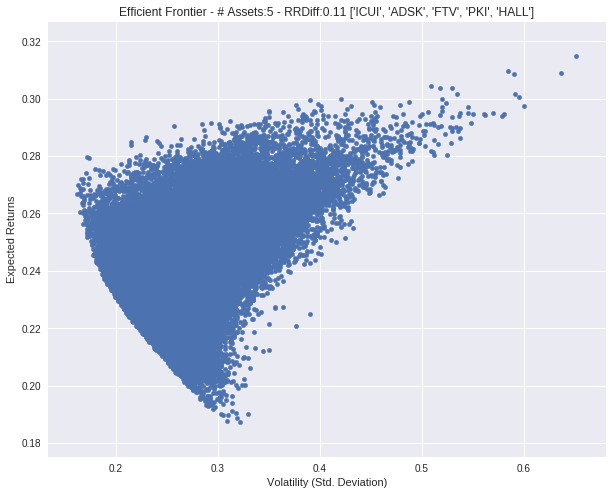

['GIII', 'PKI', 'CHSP', 'LFVN', 'JMBA']
# 3767 , RRDiff: -0.0512775414981
['CNBKA', 'MTRX', 'SXT', 'FITB', 'AAWW']
# 3768 , RRDiff: -0.0939111164617
['MTN', 'PHIIK', 'ETM', 'DCT', 'CSLT']
# 3769 , RRDiff: -0.165522558443
['FF', 'MIDD', 'ROCK', 'EXAS', 'EROS']
# 3770 , RRDiff: -0.0183834149283
['UTX', 'GGG', 'WELL', 'ISBC', 'DST']
# 3771 , RRDiff: -0.0712696876336
['PEG', 'LMT', 'MBI', 'NI', 'CCMP']
# 3772 , RRDiff: -0.0440391100183
['LPX', 'BRKR', 'THG', 'SIGM', 'ROG']
# 3773 , RRDiff: -0.119520521693
['BIIB', 'HOFT', 'HVT', 'FUL', 'CAH']
# 3774 , RRDiff: -0.0650789804852
['POWL', 'LOV', 'VOYA', 'FBNK', 'RST']
# 3775 , RRDiff: -0.0113228957257
['COST', 'AKRX', 'APAM', 'POWI', 'CNOB']
# 3776 , RRDiff: -0.00179077834224
['REXR', 'CNMD', 'CIDM', 'CHKP', 'SO']
# 3777 , RRDiff: 0.0286990143794
['UHT', 'LII', 'SYNA', 'H', 'STX']
# 3778 , RRDiff: -0.0342441910351
['NVEC', 'MG', 'DISCK', 'KND', 'TAST']
# 3779 , RRDiff: -0.0630828489383
['IHC', 'XLNX', 'NRZ', 'AFG', 'AMWD']
# 3780 , RRDiff: -0.

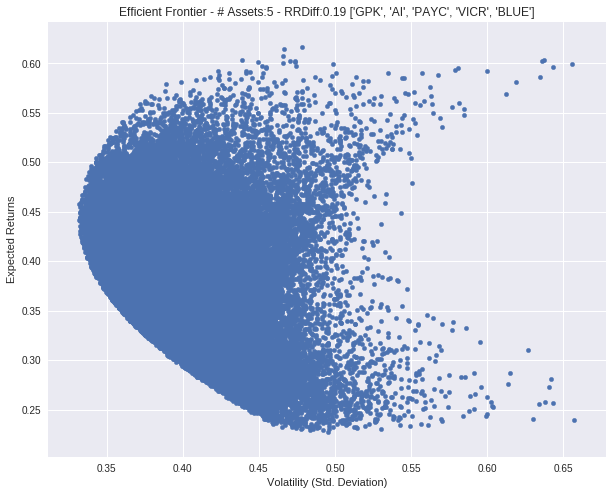

['KMI', 'NWN', 'MOSY', 'AVEO', 'CSOD']
# 3789 , RRDiff: -0.083436431248
['NWBI', 'EXPO', 'HUN', 'NCI', 'ECYT']
# 3790 , RRDiff: -0.0354703314055
['BDSI', 'FBNK', 'THR', 'HTH', 'HZO']
# 3791 , RRDiff: -0.0400454172459
['ZBH', 'AYR', 'IMMR', 'MPW', 'HIVE']
# 3792 , RRDiff: -0.111930617538
['EHTH', 'REXX', 'DK', 'NWS', 'SO']
# 3793 , RRDiff: -0.0583622615793
['SCSC', 'TPX', 'AMCX', 'ZIXI', 'GIS']
# 3794 , RRDiff: -0.0537261033872
['CMI', 'ASPS', 'MRTX', 'BAX', 'DDD']
# 3795 , RRDiff: 0.0191867486184
['HSC', 'IVR', 'SIF', 'VG', 'SRI']
# 3796 , RRDiff: -0.061911559072
['TIS', 'CLNE', 'HPT', 'STZ', 'EMCI']
# 3797 , RRDiff: -0.0376075152215
['AIN', 'MNRO', 'COP', 'ZBH', 'SYY']
# 3798 , RRDiff: -0.0252556924045
['FRSH', 'AMD', 'WRLD', 'SCM', 'GLT']
# 3799 , RRDiff: -0.0763182212963
['TOL', 'RL', 'NBTB', 'UEC', 'AMD']
# 3800 , RRDiff: -0.124237747507
['KEM', 'RELL', 'PFIS', 'TROX', 'BH']
# 3801 , RRDiff: -0.0850768290281
['FLT', 'INSM', 'I', 'P', 'BGS']
# 3802 , RRDiff: 0.0350916990388
['MED', 

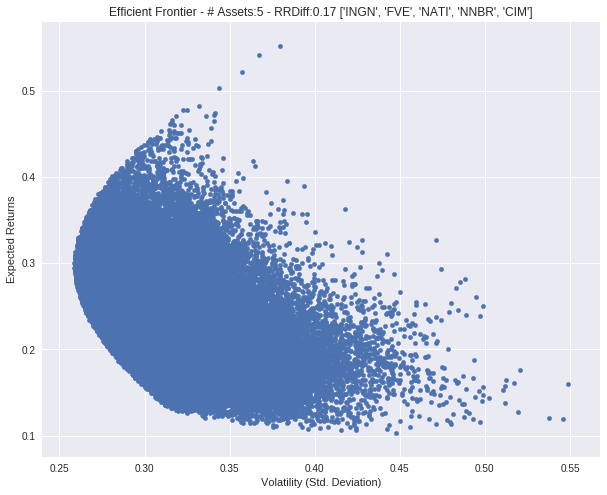

['RCII', 'BLK', 'ICPT', 'TISI', 'NGVC']
# 3842 , RRDiff: -0.0225415623226
['SNV', 'LXFT', 'MDP', 'BAC', 'SEE']
# 3843 , RRDiff: -0.100435403507
['EBTC', 'MYL', 'RRGB', 'CTRE', 'EZPW']
# 3844 , RRDiff: -0.0712762644179
['TSS', 'SEMG', 'IMMU', 'FHN', 'WINA']
# 3845 , RRDiff: -0.0659962499688
['NYCB', 'VECO', 'EGP', 'MDR', 'IDRA']
# 3846 , RRDiff: -0.0646969494373
['GNE', 'IIVI', 'LUB', 'DNR', 'VRNT']
# 3847 , RRDiff: -0.104816839689
['SRCL', 'FRAN', 'PLUS', 'ADI', 'LPNT']
# 3848 , RRDiff: -0.0439900226755
['MCO', 'IRWD', 'HF', 'AMWD', 'WAT']
# 3849 , RRDiff: -0.05557567957
['AMSF', 'ATHN', 'TMP', 'CERN', 'STMP']
# 3850 , RRDiff: -0.0283928767067
['TESS', 'PFIS', 'ABBV', 'QUAD', 'CHFN']
# 3851 , RRDiff: 0.00963182019938
['ODC', 'ORN', 'WETF', 'HCCI', 'GSM']
# 3852 , RRDiff: -0.111223375042
['MDRX', 'ECOM', 'BCO', 'CACI', 'ABCB']
# 3853 , RRDiff: -0.0718128794494
['BXS', 'FNGN', 'RSG', 'WPX', 'CPK']
# 3854 , RRDiff: -0.0483404591519
['PERI', 'HIW', 'FIX', 'OPB', 'PFLT']
# 3855 , RRDiff: -0

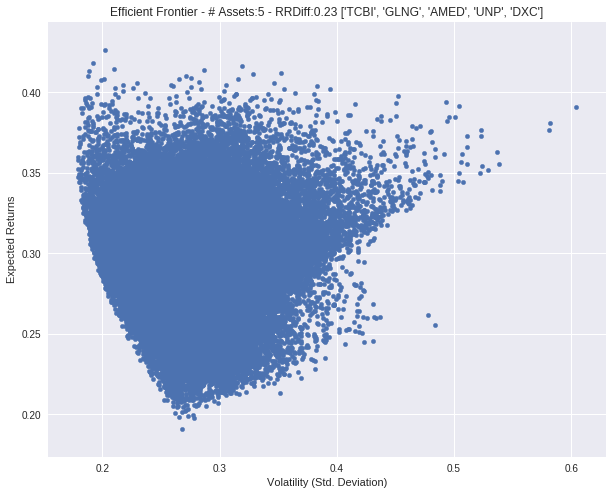

['PNFP', 'BBT', 'SUN', 'FCEL', 'MTSC']
# 3903 , RRDiff: -0.067992760706
['GLW', 'ZIXI', 'CMA', 'OPHT', 'TXT']
# 3904 , RRDiff: -0.173481198826
['CFFI', 'MVC', 'BDGE', 'AGO', 'TWOU']
# 3905 , RRDiff: 0.101970377193


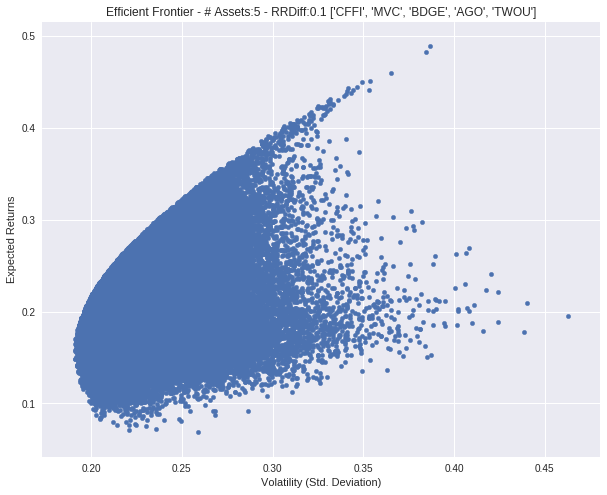

['XOXO', 'CSBK', 'ENDP', 'TG', 'CIT']
# 3906 , RRDiff: -0.102025060387
['YORW', 'BPOP', 'TROX', 'CIX', 'PX']
# 3907 , RRDiff: -0.0431536519912
['DBD', 'KVHI', 'SGMS', 'MIND', 'PRGO']
# 3908 , RRDiff: -0.0635801015047
['CHS', 'ENZ', 'PRAA', 'NATR', 'SALM']
# 3909 , RRDiff: -0.0685228338044
['RBC', 'HCSG', 'TPC', 'AMRC', 'FOE']
# 3910 , RRDiff: -0.0744246993848
['WSTL', 'HWKN', 'MLR', 'CACC', 'ROST']
# 3911 , RRDiff: -0.0170406506234
['INGR', 'RSG', 'CWCO', 'SCHN', 'MPO']
# 3912 , RRDiff: -0.0450092607754
['CVLT', 'OCLR', 'DEI', 'PRTA', 'FLIC']
# 3913 , RRDiff: -0.013528316025
['WBS', 'BKU', 'XOXO', 'PERY', 'MON']
# 3914 , RRDiff: -0.0456561236544
['CREE', 'PBPB', 'CRAY', 'SYF', 'CVGI']
# 3915 , RRDiff: -0.0889792116719
['SWKS', 'ENV', 'CPS', 'YUM', 'CPK']
# 3916 , RRDiff: 0.0259102548457
['AZZ', 'IOSP', 'WDR', 'MRO', 'AMC']
# 3917 , RRDiff: -0.103845068828
['SMG', 'BKE', 'SPB', 'ENPH', 'STBA']
# 3918 , RRDiff: -0.0210202488451
['MOV', 'FISV', 'NNI', 'PG', 'JACK']
# 3919 , RRDiff: -0.072

# 4020 , RRDiff: -0.0664431183522
['NX', 'ORIT', 'VSH', 'ICE', 'ANSS']
# 4021 , RRDiff: -0.0513149068911
['GSVC', 'LWAY', 'UHAL', 'BAH', 'PQ']
# 4022 , RRDiff: 0.00135147379177
['APTV', 'XON', 'HSY', 'GME', 'DATA']
# 4023 , RRDiff: -0.0746829604233
['FOE', 'WR', 'SAFM', 'IBKR', 'CATM']
# 4024 , RRDiff: -0.0575731223775
['PH', 'CVCO', 'KRG', 'CLDX', 'UMH']
# 4025 , RRDiff: -0.0473714454797
['GPOR', 'SHLD', 'AMSWA', 'MYRG', 'ABAX']
# 4026 , RRDiff: -0.0676381504391
['CYH', 'AKAM', 'NDSN', 'ATRO', 'SSTK']
# 4027 , RRDiff: -0.0425918870227
['LRCX', 'FN', 'WGO', 'PLD', 'FANG']
# 4028 , RRDiff: 0.0797959179956
['SBNY', 'GLF', 'WWD', 'LFUS', 'ANF']
# 4029 , RRDiff: -0.0684621721023
['KR', 'DRQ', 'LBTYA', 'IBCP', 'ISCA']
# 4030 , RRDiff: -0.10044355412
['ATU', 'CSU', 'AERI', 'KRG', 'SO']
# 4031 , RRDiff: 0.0136102021237
['ATEN', 'CTT', 'PFIS', 'REGN', 'CA']
# 4032 , RRDiff: -0.0655151198147
['PNFP', 'LE', 'XOMA', 'DIOD', 'PRIM']
# 4033 , RRDiff: -0.0581690549347
['TCBI', 'TIPT', 'SAFM', 'NOW',

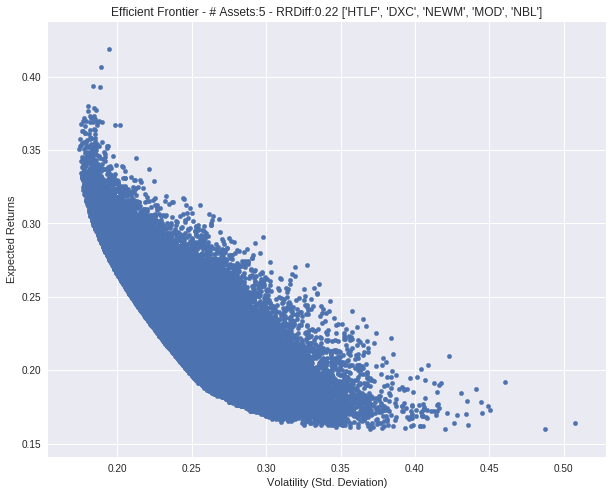

['FMBI', 'SAM', 'WIRE', 'CSII', 'CHGG']
# 4061 , RRDiff: -0.0301315055844
['UNM', 'ITG', 'VIVO', 'FLXS', 'JCP']
# 4062 , RRDiff: -0.0997124068206
['XON', 'GLUU', 'VRTX', 'LKQ', 'VNCE']
# 4063 , RRDiff: -0.0524081575911
['THFF', 'SBH', 'OHRP', 'STBZ', 'CELG']
# 4064 , RRDiff: -0.00718323826121
['BRKS', 'PBPB', 'ROIC', 'PCYO', 'ALB']
# 4065 , RRDiff: -0.0169719629771
['VDSI', 'CFFI', 'OCFC', 'WABC', 'OSTK']
# 4066 , RRDiff: -0.0676093738397
['AA', 'BSET', 'USM', 'HSC', 'CASS']
# 4067 , RRDiff: 0.146723231441


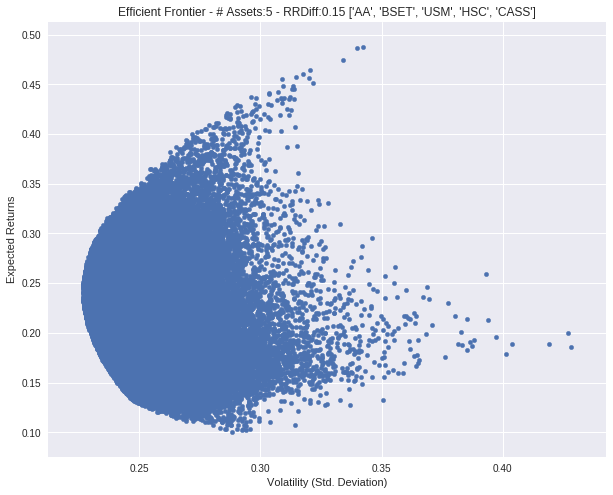

['RSPP', 'WRE', 'KBR', 'ROIC', 'HZO']
# 4068 , RRDiff: -0.0365503033797
['IBP', 'KND', 'PAG', 'PPG', 'EVHC']
# 4069 , RRDiff: 0.0732241203485
['GLRE', 'WHR', 'WPX', 'BSRR', 'AFH']
# 4070 , RRDiff: -0.0800365316082
['CIX', 'MTOR', 'WMB', 'SAMG', 'TAHO']
# 4071 , RRDiff: -0.107014785776
['FLIC', 'WHF', 'CRR', 'OMER', 'CBB']
# 4072 , RRDiff: -0.0507354687902
['OCFC', 'CRCM', 'GME', 'WDC', 'CBZ']
# 4073 , RRDiff: -0.1136456379
['IT', 'MWA', 'KTWO', 'BXS', 'EVC']
# 4074 , RRDiff: -0.121352340571
['RECN', 'CRZO', 'UCFC', 'NUAN', 'IMI']
# 4075 , RRDiff: -0.109627997581
['GAIN', 'VCRA', 'SVU', 'UPS', 'BF_B']
# 4076 , RRDiff: -0.0656181651421
['MYE', 'VSEC', 'NVDA', 'CFFN', 'RAS']
# 4077 , RRDiff: -0.00612448939183
['KLAC', 'FRSH', 'FRAN', 'NEU', 'CFG']
# 4078 , RRDiff: -0.0118713130078
['AVEO', 'IMPV', 'HPQ', 'DENN', 'SRDX']
# 4079 , RRDiff: -0.0915699334158
['PRAA', 'MNRO', 'AZO', 'KW', 'WGL']
# 4080 , RRDiff: -0.0127874249882
['ADC', 'AKAM', 'PKOH', 'HXL', 'URG']
# 4081 , RRDiff: -0.10535647

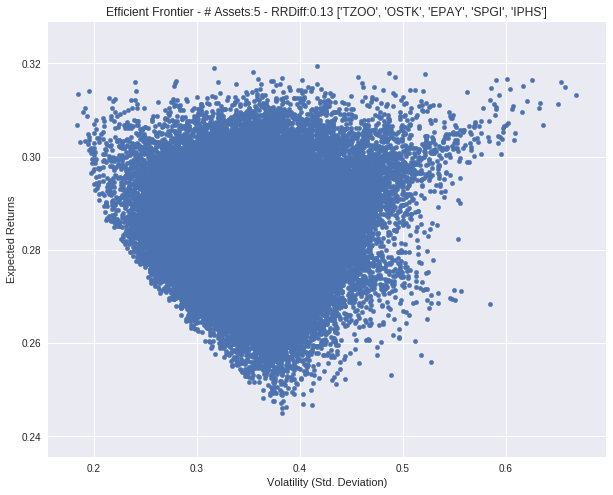

['UMPQ', 'MN', 'VG', 'FWRD', 'PICO']
# 4139 , RRDiff: -0.128027998936
['DXYN', 'GCO', 'CENTA', 'WHG', 'ODP']
# 4140 , RRDiff: -0.10054387624
['DHR', 'XYL', 'EBSB', 'PCG', 'STFC']
# 4141 , RRDiff: 0.0188152283344
['VOXX', 'TTWO', 'NPTN', 'MD', 'WSBF']
# 4142 , RRDiff: -0.097922871485
['SCI', 'HOLX', 'HRTX', 'MOV', 'BGFV']
# 4143 , RRDiff: -0.112578142454
['KHC', 'MITT', 'NL', 'NSTG', 'TWO']
# 4144 , RRDiff: -0.0685092452063
['SGA', 'ESL', 'HRZN', 'SLRC', 'ANAT']
# 4145 , RRDiff: -0.055189640497
['WRK', 'MDLZ', 'ANH', 'AIG', 'CRY']
# 4146 , RRDiff: -0.0702492098605
['RTIX', 'MCD', 'CENX', 'CRY', 'CPK']
# 4147 , RRDiff: -0.0408897158328
['ZTS', 'AVX', 'COL', 'SAFM', 'SSP']
# 4148 , RRDiff: 0.0216909813312
['ELLI', 'AET', 'VVUS', 'POL', 'HCP']
# 4149 , RRDiff: 0.0491396226308
['GLAD', 'CHEF', 'OLP', 'QRVO', 'MLM']
# 4150 , RRDiff: -0.098648563867
['ATVI', 'VMI', 'ROCK', 'AMSF', 'MEIP']
# 4151 , RRDiff: -0.0271667329558
['KEYW', 'UIS', 'CVCO', 'PCRX', 'LFUS']
# 4152 , RRDiff: -0.02729159778

# 4253 , RRDiff: 0.0148693317307
['AXS', 'IVZ', 'ODFL', 'WYN', 'INO']
# 4254 , RRDiff: -0.0528380618898
['ARWR', 'KFRC', 'CHEF', 'BDX', 'XLRN']
# 4255 , RRDiff: -0.02090552222
['NATR', 'BAH', 'CIT', 'ETN', 'ACHN']
# 4256 , RRDiff: 0.00223570696592
['BBOX', 'SCHL', 'TPX', 'HRB', 'DMRC']
# 4257 , RRDiff: -0.132620911713
['ARAY', 'ESRX', 'HPP', 'USNA', 'GIS']
# 4258 , RRDiff: -0.0125727096296
['AVHI', 'BDC', 'OLBK', 'EQT', 'DAKT']
# 4259 , RRDiff: -0.0480585036516
['NLSN', 'GNRC', 'HBCP', 'BXC', 'MPWR']
# 4260 , RRDiff: 0.0101559979236
['HOV', 'WFC', 'CCOI', 'AMNB', 'TRI']
# 4261 , RRDiff: -0.0855026329986
['TXT', 'LLL', 'RHT', 'DISH', 'CRS']
# 4262 , RRDiff: -0.0721771112544
['TWIN', 'CPSS', 'PHX', 'ZGNX', 'MRVL']
# 4263 , RRDiff: -0.0653965473182
['TGI', 'OHRP', 'BWA', 'ROLL', 'PEGA']
# 4264 , RRDiff: -0.0272046040185
['RELL', 'IO', 'AMC', 'LCUT', 'SP']
# 4265 , RRDiff: -0.106150776103
['AGEN', 'SALM', 'CBPX', 'GOOGL', 'CTT']
# 4266 , RRDiff: -0.00631463641056
['LWAY', 'OIS', 'CETV', 'N

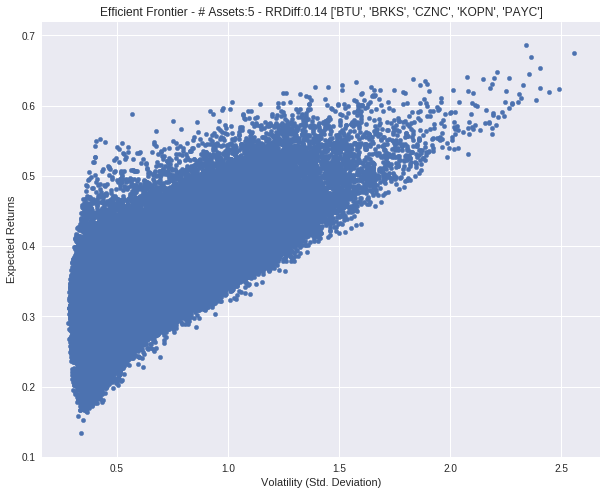

['NXTM', 'PM', 'NPK', 'REN', 'VICL']
# 4272 , RRDiff: -0.0487743806105
['SHLM', 'ALE', 'CMC', 'PCTI', 'CMCO']
# 4273 , RRDiff: -0.103947972997
['RDI', 'GPX', 'LCNB', 'FRO', 'MSFG']
# 4274 , RRDiff: -0.0890263035464
['CVGI', 'PAYC', 'AMCX', 'SEAC', 'CSS']
# 4275 , RRDiff: 0.136067420559


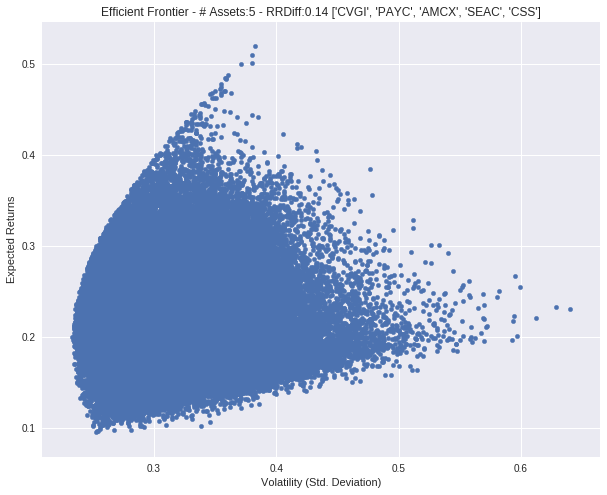

['FCBC', 'SLB', 'ITW', 'IART', 'SXI']
# 4276 , RRDiff: -0.0563732560378
['STBZ', 'OLN', 'SPR', 'EFX', 'VRNT']
# 4277 , RRDiff: -0.0641255652413
['VFC', 'PAY', 'VLGEA', 'SMRT', 'GXP']
# 4278 , RRDiff: -0.0556139414082
['CBL', 'ECYT', 'BNCL', 'MON', 'TER']
# 4279 , RRDiff: -0.0648400343134
['ENS', 'FCF', 'MHK', 'KIRK', 'JWN']
# 4280 , RRDiff: -0.121395261658
['CI', 'KR', 'CERS', 'ARR', 'LAD']
# 4281 , RRDiff: -0.0819142791702
['WBA', 'FTV', 'GLAD', 'SSYS', 'GT']
# 4282 , RRDiff: 0.100464146052


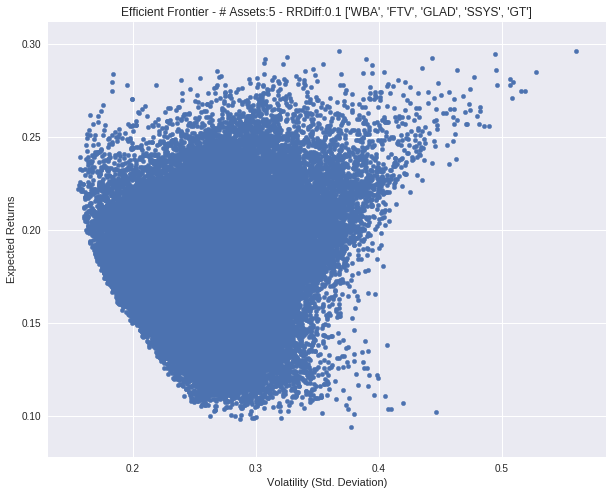

['EPAY', 'USAK', 'SEE', 'ABM', 'MON']
# 4283 , RRDiff: -0.0655039092586
['NOW', 'FMBI', 'MCC', 'STZ', 'IDTI']
# 4284 , RRDiff: 0.0427451284619
['HLX', 'ARAY', 'HPP', 'BYD', 'LTS']
# 4285 , RRDiff: -0.0653799395195
['RPT', 'MOSY', 'BA', 'EEFT', 'DISH']
# 4286 , RRDiff: -0.0481603407537
['TK', 'FTK', 'MCS', 'ALSN', 'KLAC']
# 4287 , RRDiff: -0.0686332995212
['SSNC', 'CA', 'WINA', 'PANW', 'EVTC']
# 4288 , RRDiff: 0.0368639516098
['NUAN', 'ROSE', 'LUB', 'NCR', 'LPX']
# 4289 , RRDiff: -0.142753027485
['RWT', 'DG', 'FNF', 'INGN', 'CHCO']
# 4290 , RRDiff: 0.171035228907


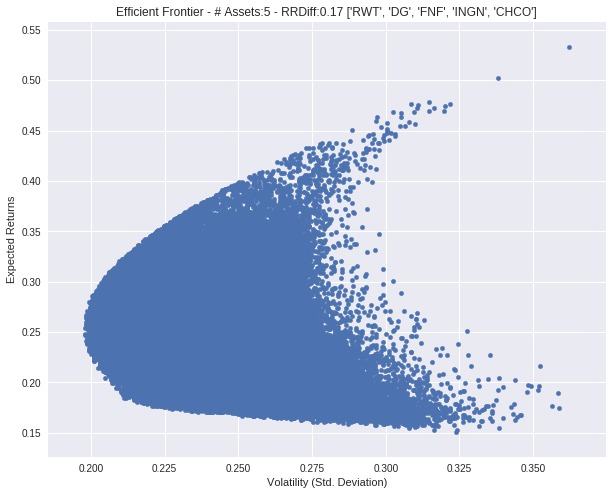

['NWHM', 'CREE', 'BXP', 'CPST', 'IDXX']
# 4291 , RRDiff: -0.0556289601816
['JLL', 'GWW', 'RS', 'PICO', 'RGLD']
# 4292 , RRDiff: -0.0457374583644
['XLRN', 'CSFL', 'AAN', 'MDCO', 'SCHL']
# 4293 , RRDiff: -0.0628875039082
['ATU', 'OVAS', 'TECD', 'WCG', 'CLH']
# 4294 , RRDiff: -0.0458733480449
['AON', 'CSCO', 'VRTU', 'DF', 'ODFL']
# 4295 , RRDiff: -0.0439652243443
['RELL', 'MNTX', 'GNC', 'TXT', 'MAC']
# 4296 , RRDiff: -0.124773560341
['KAMN', 'AMSWA', 'AMBR', 'ECPG', 'BBT']
# 4297 , RRDiff: -0.094279907206
['OGE', 'SYNA', 'UPS', 'MYL', 'AMRS']
# 4298 , RRDiff: -0.074321627591
['PICO', 'LEG', 'WWE', 'KRG', 'BRKL']
# 4299 , RRDiff: -0.105384859294
['IART', 'VTR', 'SGMO', 'SBAC', 'PZZA']
# 4300 , RRDiff: -0.0260975671506
['AGCO', 'MYE', 'PRSC', 'IPI', 'MCD']
# 4301 , RRDiff: -0.0636629415475
['BR', 'WM', 'AMAG', 'EBSB', 'PNM']
# 4302 , RRDiff: -0.0149760302763
['LKQ', 'CCRN', 'AIR', 'ARRY', 'IVAC']
# 4303 , RRDiff: -0.063446892423
['LANC', 'HCA', 'APTV', 'NFBK', 'RE']
# 4304 , RRDiff: -0.0151

# 4405 , RRDiff: -0.0715634557164
['LTC', 'TAHO', 'VZ', 'CVGI', 'NOC']
# 4406 , RRDiff: -0.0468426433677
['SRDX', 'CNP', 'OHI', 'KRA', 'BELFB']
# 4407 , RRDiff: -0.0758633780005
['ROIC', 'CVI', 'AAOI', 'HCKT', 'AMC']
# 4408 , RRDiff: -0.0214379914009
['FRT', 'EQT', 'WBS', 'RTEC', 'ZBRA']
# 4409 , RRDiff: -0.0629075946535
['KMI', 'CHD', 'IDT', 'TNC', 'WHF']
# 4410 , RRDiff: -0.0239597579856
['JACK', 'FNSR', 'FSP', 'CAG', 'CTS']
# 4411 , RRDiff: -0.103523937116
['FLDM', 'SMTC', 'MRCY', 'NVDA', 'NWLI']
# 4412 , RRDiff: -0.088973438509
['RRD', 'MG', 'WRI', 'JNJ', 'ATRO']
# 4413 , RRDiff: -0.0430049599455
['GT', 'CASS', 'AGNC', 'DNKN', 'JCI']
# 4414 , RRDiff: -0.00631980188555
['TZOO', 'KRO', 'STBA', 'TSC', 'ANH']
# 4415 , RRDiff: -0.0358322191842
['MCY', 'STX', 'LEA', 'MXIM', 'AT']
# 4416 , RRDiff: 0.00261220824142
['DIS', 'EPR', 'BGC', 'TLYS', 'PTLA']
# 4417 , RRDiff: -0.0604965498831
['FRED', 'ADP', 'LII', 'MPAA', 'PNW']
# 4418 , RRDiff: -0.0431145429991
['LQDT', 'STT', 'RPT', 'INTC', 'S

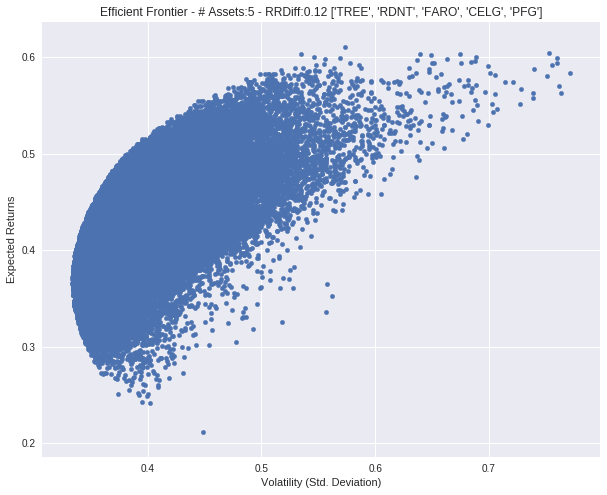

['PLD', 'STRT', 'FCE_A', 'SPNS', 'UMPQ']
# 4424 , RRDiff: -0.124066583707
['PACB', 'USPH', 'SIR', 'XOMA', 'ALX']
# 4425 , RRDiff: -0.0503671982566
['CTAS', 'TCS', 'AGIO', 'CORE', 'MRO']
# 4426 , RRDiff: -0.0565392337494
['SYF', 'INSM', 'REN', 'BR', 'TNC']
# 4427 , RRDiff: -0.0197365599725
['KIRK', 'PETX', 'DLR', 'HIBB', 'CERN']
# 4428 , RRDiff: -0.0335273092321
['BMRN', 'AES', 'CPE', 'DHR', 'DEI']
# 4429 , RRDiff: -0.0810948924116
['OIS', 'NBHC', 'ISCA', 'SPNS', 'MPAA']
# 4430 , RRDiff: -0.0466748454716
['ADES', 'SO', 'NKE', 'TRMB', 'MXIM']
# 4431 , RRDiff: -0.000320387886649
['CAG', 'EIGI', 'TECD', 'MTSI', 'ADUS']
# 4432 , RRDiff: -0.0623429005207
['QNST', 'CUTR', 'ELS', 'BRS', 'OPB']
# 4433 , RRDiff: -0.0633580569698
['MYE', 'CYH', 'INFO', 'MSM', 'PLUG']
# 4434 , RRDiff: -0.084092187826
['PRI', 'CB', 'SHW', 'LKQ', 'OFG']
# 4435 , RRDiff: 0.0209145298964
['PRI', 'ATRC', 'PKD', 'IMPV', 'TEN']
# 4436 , RRDiff: -0.00723614019369
['DO', 'PGTI', 'CPSI', 'CMCSA', 'RHP']
# 4437 , RRDiff: -0.

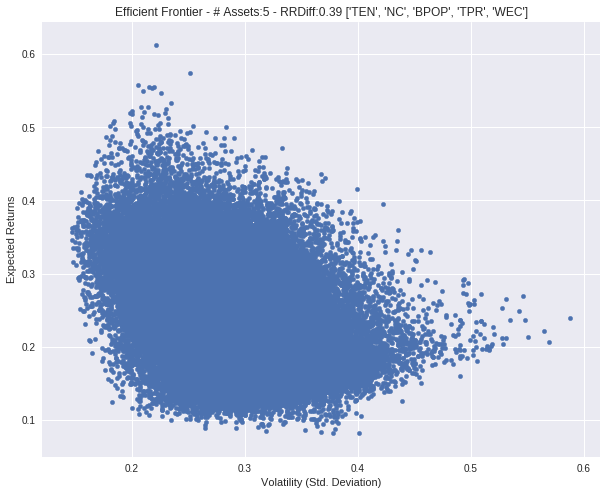

['KEG', 'SRCE', 'CIDM', 'FORM', 'CSLT']
# 4445 , RRDiff: -0.23853661059
['BUSE', 'VRNS', 'RRTS', 'VRTX', 'EGL']
# 4446 , RRDiff: -0.111573400652
['SBUX', 'POL', 'NDSN', 'SCHN', 'QUAD']
# 4447 , RRDiff: -0.0745643115703
['WASH', 'WEYS', 'ROP', 'PROV', 'VLGEA']
# 4448 , RRDiff: -0.0266681835786
['NCS', 'ALK', 'LM', 'CNS', 'LXP']
# 4449 , RRDiff: -0.147449254591
['RBCN', 'RNST', 'AMT', 'ROSE', 'ELLI']
# 4450 , RRDiff: 0.0278024002485
['RLGY', 'IO', 'SHOO', 'BFS', 'ROP']
# 4451 , RRDiff: -0.0367804499958
['TTS', 'MMC', 'ASGN', 'TROX', 'PII']
# 4452 , RRDiff: -0.077865961975
['MCO', 'TRIP', 'DEI', 'IRWD', 'GSM']
# 4453 , RRDiff: -0.0783806501974
['MBFI', 'ALEX', 'AMRS', 'MGEE', 'USPH']
# 4454 , RRDiff: -0.0625210949948
['IBTX', 'KTWO', 'DOOR', 'LPI', 'UEIC']
# 4455 , RRDiff: -0.0207966405042
['IVAC', 'XRAY', 'ATNI', 'AMGN', 'WSBF']
# 4456 , RRDiff: -0.0450591155082
['ABMD', 'SCHL', 'NRCIA', 'CLFD', 'FOX']
# 4457 , RRDiff: -0.0459296814843
['ADBE', 'OLBK', 'CPA', 'WY', 'CSOD']
# 4458 , RRDif

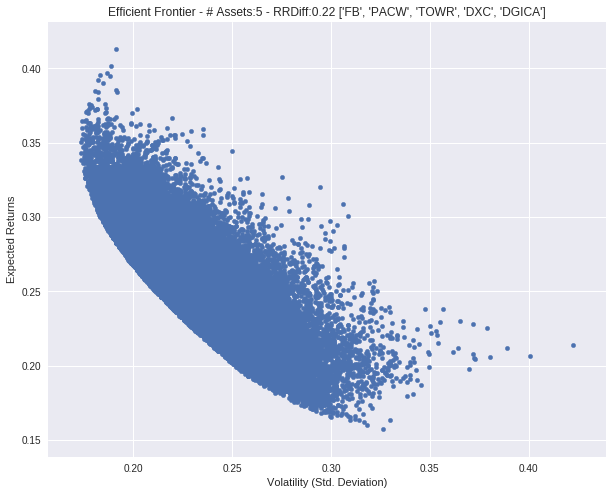

['CKH', 'DAR', 'HTZ', 'BRO', 'NUE']
# 4490 , RRDiff: -0.0505412370609
['ROG', 'RBCN', 'ARTNA', 'FLS', 'EIG']
# 4491 , RRDiff: -0.0720915942218
['PH', 'DTE', 'DK', 'AEP', 'PEIX']
# 4492 , RRDiff: -0.0676535978206
['STAR', 'NEU', 'RAVN', 'INWK', 'GBDC']
# 4493 , RRDiff: -0.0221397884643
['WGO', 'CUB', 'PRI', 'ODFL', 'CVA']
# 4494 , RRDiff: 0.0239645396198
['UDR', 'WCC', 'ACIW', 'MKSI', 'DPS']
# 4495 , RRDiff: -0.0289679500085
['CDNS', 'VDSI', 'ATRO', 'DHIL', 'AOS']
# 4496 , RRDiff: -0.0156630661877
['SPNS', 'NKE', 'KS', 'ANGI', 'IMPV']
# 4497 , RRDiff: -0.0254321776032
['PMT', 'GPC', 'DSPG', 'DRI', 'OCLR']
# 4498 , RRDiff: -0.0484047922595
['BA', 'TCS', 'TREX', 'ZBH', 'MTW']
# 4499 , RRDiff: -0.0618753418754
['NSM', 'ENV', 'MMSI', 'WTW', 'CERS']
# 4500 , RRDiff: -0.0269752999628
['HRTG', 'AVA', 'UVSP', 'RIGL', 'CRIS']
# 4501 , RRDiff: -0.0936697778264
['XL', 'WDFC', 'EGN', 'XRX', 'CALX']
# 4502 , RRDiff: -0.100169346124
['MMC', 'MTN', 'DST', 'ICUI', 'NWLI']
# 4503 , RRDiff: -0.0514674170

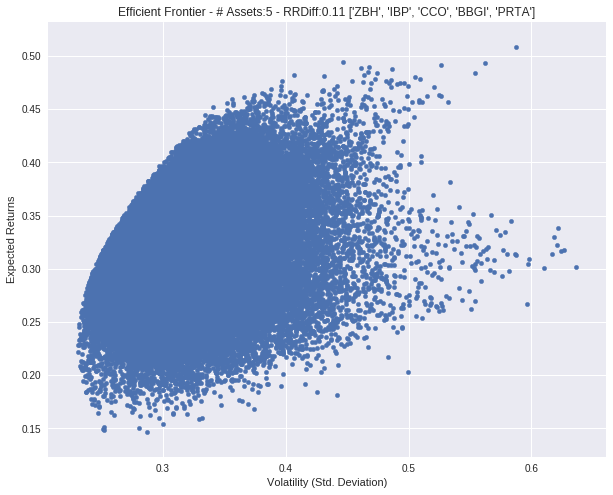

['ANSS', 'CATO', 'HAYN', 'PCTY', 'XEC']
# 4528 , RRDiff: -0.0135251830168
['NWSA', 'MKC', 'ATEC', 'HSC', 'RGEN']
# 4529 , RRDiff: -0.0381688749044
['MCHP', 'ED', 'NTGR', 'UTL', 'NEM']
# 4530 , RRDiff: -0.0304142637315
['VRTX', 'EWBC', 'STML', 'DAVE', 'HMHC']
# 4531 , RRDiff: -0.0717462529621
['CRY', 'SHW', 'CGNX', 'RSO', 'PVH']
# 4532 , RRDiff: -0.0443156605819
['SRI', 'HIW', 'HOV', 'CWT', 'CBI']
# 4533 , RRDiff: -0.106001492036
['NXST', 'CLF', 'AGN', 'TROX', 'ANH']
# 4534 , RRDiff: -0.0615722278081
['VRTX', 'BOH', 'AIZ', 'TRN', 'PFS']
# 4535 , RRDiff: -0.090649245534
['TTI', 'FRO', 'FRBK', 'PRGX', 'MAC']
# 4536 , RRDiff: -0.146891073119
['CLGX', 'PTCT', 'CBK', 'FNLC', 'CPA']
# 4537 , RRDiff: -0.0337698026522
['TIS', 'LADR', 'RM', 'MSL', 'ROL']
# 4538 , RRDiff: -0.0232420319179
['AAMC', 'BURL', 'AES', 'INT', 'SUPN']
# 4539 , RRDiff: 0.180760886522


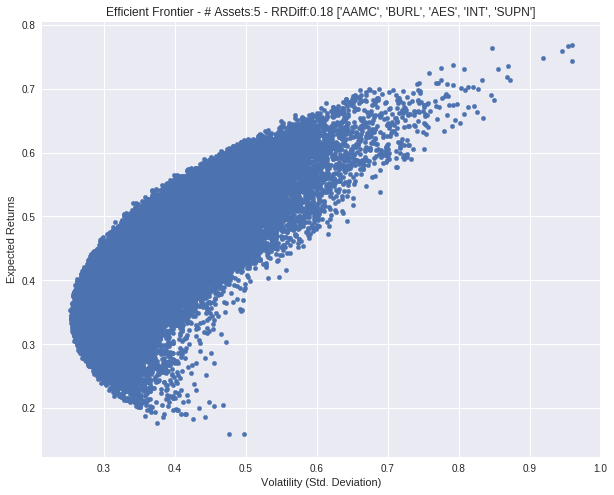

['UPS', 'HLX', 'MLAB', 'FN', 'ODC']
# 4540 , RRDiff: -0.0233444546816
['LPLA', 'MKL', 'NKE', 'SPNS', 'CNP']
# 4541 , RRDiff: -0.037794342699
['EXLS', 'GPX', 'MTGE', 'FOXF', 'ALEX']
# 4542 , RRDiff: -0.0155106159716
['VNDA', 'CHFC', 'SKX', 'INWK', 'VIAB']
# 4543 , RRDiff: -0.130177300794
['ARWR', 'EV', 'ATLO', 'PACB', 'PRIM']
# 4544 , RRDiff: -0.0411569793624
['CHDN', 'MAN', 'XLNX', 'HXL', 'ANTM']
# 4545 , RRDiff: -0.0478011706643
['MSA', 'MCBC', 'MTX', 'NIHD', 'OSIS']
# 4546 , RRDiff: -0.0881469902972
['PCTI', 'TAST', 'WAFD', 'BKD', 'PFS']
# 4547 , RRDiff: -0.137643108091
['ALK', 'CCXI', 'GARS', 'IPXL', 'LAMR']
# 4548 , RRDiff: -0.0794087173332
['TAT', 'NRIM', 'MTSC', 'APD', 'DLB']
# 4549 , RRDiff: -0.0659974075842
['OHI', 'WFC', 'HALO', 'NXST', 'CWCO']
# 4550 , RRDiff: -0.08230532609
['BDSI', 'MA', 'MDU', 'OHRP', 'ECOM']
# 4551 , RRDiff: 0.0577736566334
['BRT', 'HPP', 'RF', 'COG', 'CHD']
# 4552 , RRDiff: -0.00309928898247
['VRA', 'MTDR', 'STC', 'CTL', 'ROST']
# 4553 , RRDiff: -0.03868

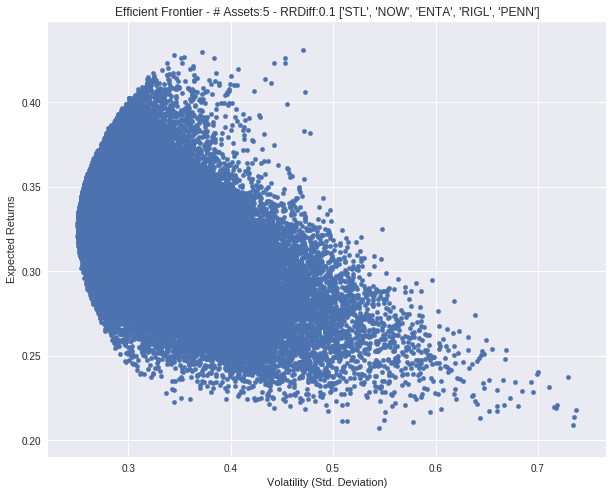

['LDL', 'LH', 'ITW', 'NXST', 'USLM']
# 4578 , RRDiff: 0.00219080413796
['SPTN', 'BSX', 'TRIP', 'INTL', 'MNTX']
# 4579 , RRDiff: -0.066969235863
['WSBC', 'GOLD', 'IVAC', 'INTC', 'OTTR']
# 4580 , RRDiff: -0.0492039217104
['CSLT', 'EXLS', 'AMP', 'LPG', 'G']
# 4581 , RRDiff: -0.128313602247
['FSS', 'GBX', 'ACOR', 'TZOO', 'USAP']
# 4582 , RRDiff: -0.136891995944
['MCHP', 'CERN', 'IT', 'KWR', 'OSUR']
# 4583 , RRDiff: -0.0592627693456
['AWI', 'KND', 'ESNT', 'CFX', 'PDM']
# 4584 , RRDiff: -0.0374518240265
['RWT', 'LMNR', 'AERI', 'ALLE', 'DEPO']
# 4585 , RRDiff: 0.0328501199055
['UCBI', 'NLS', 'KIRK', 'CWCO', 'AJG']
# 4586 , RRDiff: -0.0636980538401
['VRTU', 'EGP', 'GPC', 'RHI', 'NWHM']
# 4587 , RRDiff: -0.068151142765
['INSY', 'NOV', 'CRY', 'AKRX', 'FMI']
# 4588 , RRDiff: 0.0329775007327
['JNPR', 'RSO', 'MKC', 'NBTB', 'MIND']
# 4589 , RRDiff: -0.0555999749699
['ANDE', 'INGN', 'PFSI', 'FNLC', 'GRA']
# 4590 , RRDiff: 0.170148220691


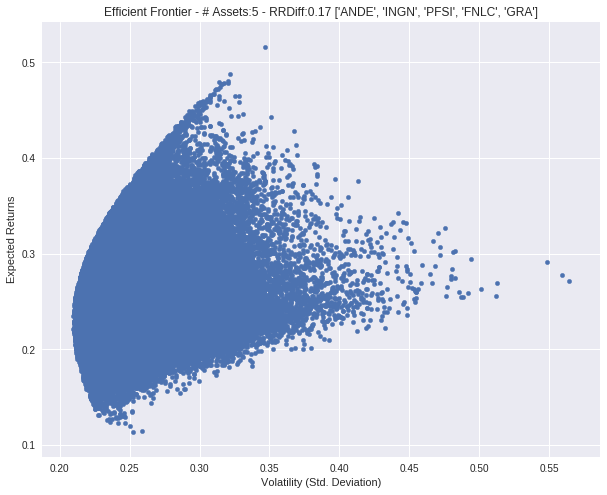

['HNI', 'ZEUS', 'AFL', 'GE', 'PBH']
# 4591 , RRDiff: -0.15122411876
['STZ', 'PDCE', 'STMP', 'SNMX', 'ANGI']
# 4592 , RRDiff: -0.0291838462072
['SFLY', 'FELE', 'FARO', 'KORS', 'WPX']
# 4593 , RRDiff: -0.0466914663459
['RFP', 'MSCC', 'WIFI', 'SWKS', 'DXLG']
# 4594 , RRDiff: -0.0800852035774
['TAX', 'PPC', 'MNKD', 'OCN', 'AMED']
# 4595 , RRDiff: -0.0996624243292
['DOOR', 'EFSC', 'PPG', 'MRVL', 'JAKK']
# 4596 , RRDiff: -0.0619459176809
['QLYS', 'DIN', 'IMGN', 'EA', 'WAFD']
# 4597 , RRDiff: 0.0142531810662
['CHUY', 'LEA', 'SYNA', 'TREC', 'BRKL']
# 4598 , RRDiff: 0.031197546042
['RUTH', 'VNCE', 'VSI', 'PRIM', 'GBNK']
# 4599 , RRDiff: -0.158526792006
['RBC', 'BAH', 'ESGR', 'IIIN', 'KHC']
# 4600 , RRDiff: 0.00955097055009
['BIO', 'ENR', 'WHG', 'NBHC', 'GEO']
# 4601 , RRDiff: -0.015051926667
['CCMP', 'BKU', 'HSIC', 'IMMR', 'FRBK']
# 4602 , RRDiff: -0.0665427487544
['HON', 'TWTR', 'TZOO', 'CUB', 'SUPN']
# 4603 , RRDiff: -0.0016933320936
['USB', 'RDN', 'PZZA', 'BGG', 'ZTS']
# 4604 , RRDiff: 0.007

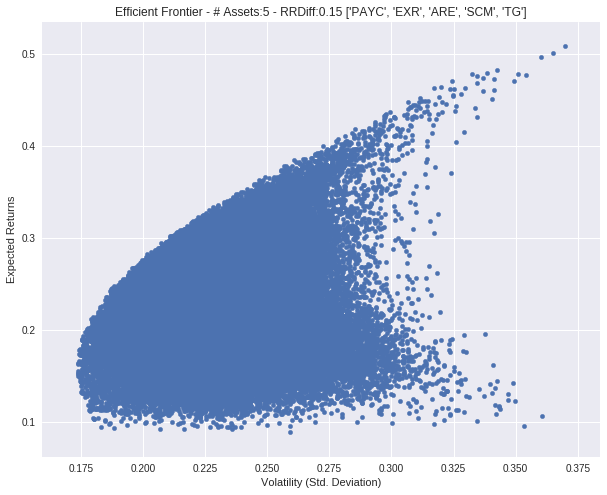

['ADTN', 'PCYO', 'CCXI', 'FFNW', 'CHKP']
# 4637 , RRDiff: -0.0355518557789
['LTM', 'AHC', 'ETN', 'DBD', 'ADTN']
# 4638 , RRDiff: -0.131248526753
['ACAD', 'CBT', 'CINF', 'CVX', 'OLED']
# 4639 , RRDiff: -0.0719351392936
['WSBC', 'CSGP', 'SCG', 'JWN', 'SGYP']
# 4640 , RRDiff: -0.0656540363905
['IHC', 'MS', 'MDRX', 'BSET', 'INTX']
# 4641 , RRDiff: -0.124068916367
['WM', 'USNA', 'ETH', 'PX', 'HIG']
# 4642 , RRDiff: -0.0534084268665
['DAL', 'AE', 'USM', 'CMCSA', 'IOSP']
# 4643 , RRDiff: -0.0780453674408
['BBT', 'HMN', 'CAG', 'T', 'HIVE']
# 4644 , RRDiff: -0.116793232112
['ECYT', 'IVR', 'ALGT', 'HALL', 'KWR']
# 4645 , RRDiff: -0.00691217652871
['CPS', 'EVR', 'GOGO', 'VAC', 'UMH']
# 4646 , RRDiff: 0.0795756097552
['DXCM', 'ACHN', 'CNBKA', 'VFC', 'WTBA']
# 4647 , RRDiff: -0.0594549307292
['NRIM', 'HUBG', 'WRI', 'NWL', 'IMPV']
# 4648 , RRDiff: -0.0616805347203
['WETF', 'IDT', 'TPR', 'HSII', 'COP']
# 4649 , RRDiff: 0.343873370379


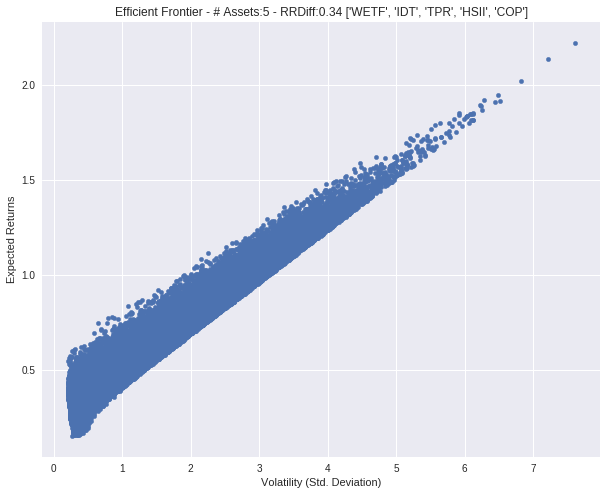

['MKC', 'CKH', 'MORN', 'TIF', 'TRS']
# 4650 , RRDiff: -0.0369639438193
['AFH', 'VRA', 'ENPH', 'LINC', 'UFI']
# 4651 , RRDiff: -0.111630275065
['OGE', 'WDR', 'ALE', 'KND', 'FMC']
# 4652 , RRDiff: -0.0923074919581
['ALLE', 'ODP', 'SKYW', 'NCI', 'ETH']
# 4653 , RRDiff: -0.050542699998
['BBX', 'ENTG', 'QADA', 'FOXA', 'ANCX']
# 4654 , RRDiff: -0.0253924264371
['UNH', 'PH', 'LTM', 'CBPX', 'DXCM']
# 4655 , RRDiff: -0.00995313322631
['SF', 'HPT', 'NEO', 'LMNR', 'HRS']
# 4656 , RRDiff: 0.00069894347011
['PTX', 'PLD', 'OXFD', 'VSH', 'ARCW']
# 4657 , RRDiff: -0.108200406224
['PETX', 'COWN', 'SPWH', 'ATR', 'GLAD']
# 4658 , RRDiff: -0.112877679739
['TR', 'HCOM', 'BRK_B', 'WCG', 'NXTM']
# 4659 , RRDiff: -0.0642987588759
['DOV', 'PENN', 'KAMN', 'HPT', 'CR']
# 4660 , RRDiff: -0.0676305916947
['CLX', 'PLD', 'ORIT', 'EBIO', 'RELL']
# 4661 , RRDiff: -0.0823803778869
['IBCP', 'CBB', 'PHX', 'MYGN', 'FFIN']
# 4662 , RRDiff: -0.0552792346285
['UNH', 'SJI', 'OGS', 'VZ', 'III']
# 4663 , RRDiff: 0.0333176664814

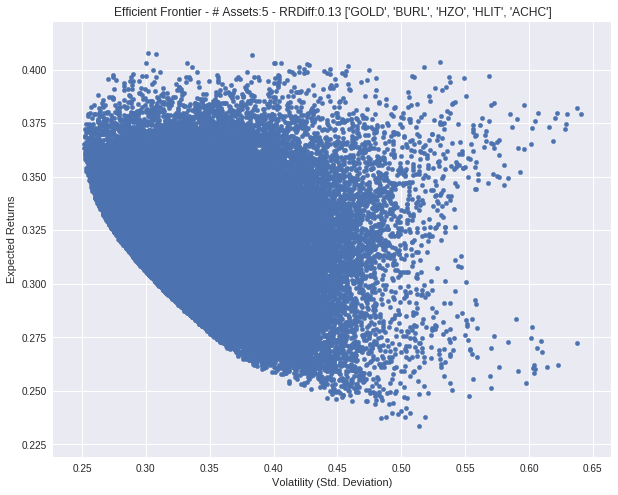

['APD', 'GORO', 'MCHP', 'LMNR', 'ETH']
# 4680 , RRDiff: -0.0427248225959
['CRR', 'JNJ', 'CACC', 'SVU', 'NATI']
# 4681 , RRDiff: -0.0449700947437
['FTK', 'RMD', 'TPR', 'HWKN', 'AIN']
# 4682 , RRDiff: 0.398624834896


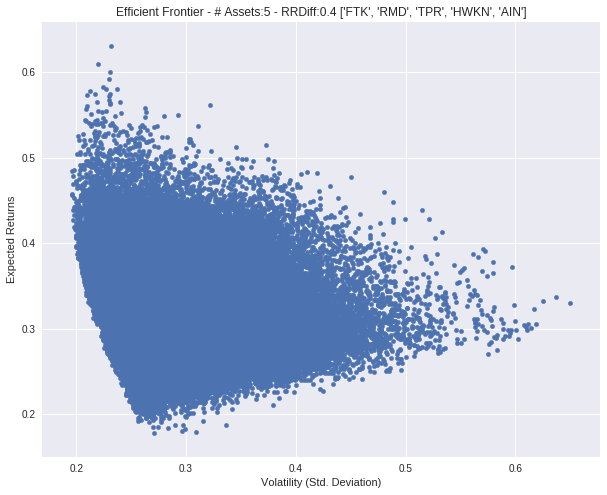

['CTSH', 'LNDC', 'CCXI', 'JEC', 'STLD']
# 4683 , RRDiff: -0.0311236263415
['DOOR', 'GPX', 'TPH', 'IBKC', 'GSBC']
# 4684 , RRDiff: -0.0624083106404
['CPK', 'WLH', 'ITT', 'ORI', 'VCRA']
# 4685 , RRDiff: -0.0636046374572
['HNI', 'SVU', 'GARS', 'SDRL', 'DPZ']
# 4686 , RRDiff: -0.0420871920799
['FDUS', 'NFG', 'PWOD', 'BOH', 'EXPO']
# 4687 , RRDiff: -0.0374979862696
['IDT', 'SEAS', 'MATW', 'GVA', 'TUES']
# 4688 , RRDiff: -0.150383290677
['GOOD', 'FIX', 'WR', 'INFN', 'AFH']
# 4689 , RRDiff: -0.0456900995133
['ULTA', 'GTXI', 'BCOV', 'SAH', 'SD']
# 4690 , RRDiff: -0.136472783646
['EGY', 'PCAR', 'G', 'CENX', 'NEE']
# 4691 , RRDiff: -0.0371803959583
['IDT', 'MNST', 'WAFD', 'ENV', 'GT']
# 4692 , RRDiff: 0.0367879009494
['AAP', 'CTT', 'CCO', 'DX', 'VRSN']
# 4693 , RRDiff: -0.060182431423
['TAT', 'KVHI', 'CTG', 'BHLB', 'KTOS']
# 4694 , RRDiff: -0.110719306062
['NGS', 'BIOS', 'NVAX', 'HTBI', 'AMZN']
# 4695 , RRDiff: 0.0137316433799
['VG', 'SAFT', 'NVAX', 'TAHO', 'STL']
# 4696 , RRDiff: -0.04084217216

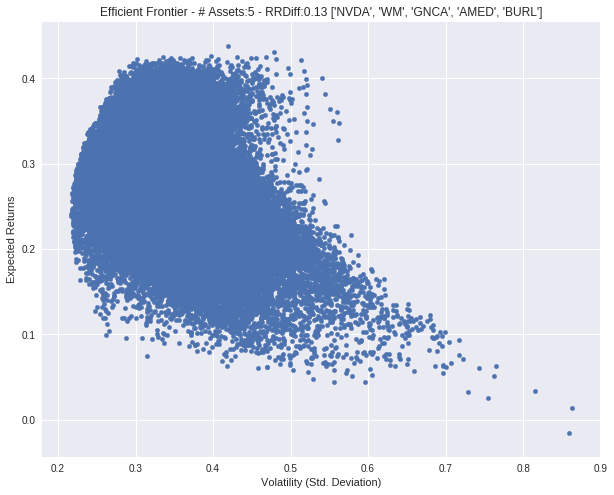

['AMT', 'AAWW', 'GSM', 'OFC', 'WPP']
# 4787 , RRDiff: -0.0944375715724
['EW', 'CATO', 'IIVI', 'BTU', 'MCY']
# 4788 , RRDiff: -0.0176544978235
['RNG', 'ELLI', 'Y', 'WTR', 'HI']
# 4789 , RRDiff: 0.0820940836167
['PPL', 'USB', 'V', 'JBSS', 'FFIN']
# 4790 , RRDiff: 0.000486850024762
['MOS', 'LLNW', 'LCUT', 'KAR', 'TRK']
# 4791 , RRDiff: -0.0212243209382
['NEO', 'EHTH', 'MLAB', 'CR', 'FOR']
# 4792 , RRDiff: 0.0026062147863
['BK', 'IR', 'VIVO', 'LLNW', 'GHC']
# 4793 , RRDiff: -0.100463155949
['NKSH', 'VSI', 'ORN', 'DRI', 'RCII']
# 4794 , RRDiff: -0.0750672791271
['CYS', 'FLIR', 'ARRS', 'PLXS', 'PRGX']
# 4795 , RRDiff: -0.0557123195337
['TRNO', 'GILD', 'DOC', 'ACAD', 'VTL']
# 4796 , RRDiff: 0.00212885742564
['TCO', 'RBCN', 'CFG', 'EVC', 'UFS']
# 4797 , RRDiff: -0.0210914687757
['CRL', 'ESS', 'IOSP', 'DFRG', 'ALG']
# 4798 , RRDiff: -0.0425350153919
['ROSE', 'IRBT', 'SIRI', 'ELLI', 'GFN']
# 4799 , RRDiff: 0.0401142474004
['OMI', 'ERIE', 'ASH', 'NSP', 'BCO']
# 4800 , RRDiff: -0.0696243310647
['S

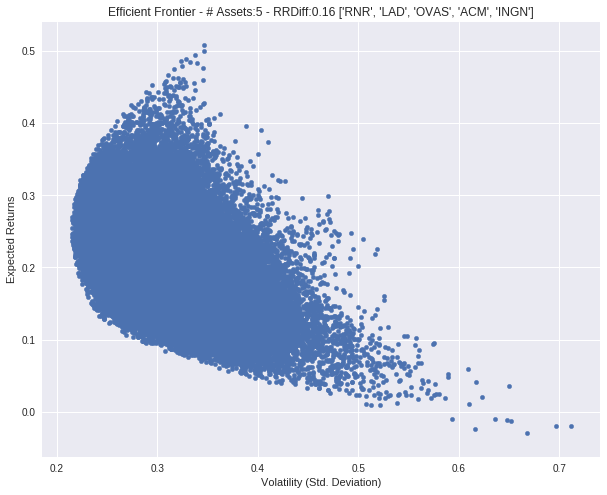

['REIS', 'ANF', 'MCRI', 'ADI', 'HSY']
# 4846 , RRDiff: -0.0400315704687
['SP', 'KOS', 'ARTNA', 'SRI', 'RAIL']
# 4847 , RRDiff: -0.0867467311009
['NATI', 'WAT', 'AKRX', 'IPGP', 'BSET']
# 4848 , RRDiff: 0.0174046523717
['IPHS', 'HAL', 'KFY', 'PLUG', 'MDCO']
# 4849 , RRDiff: -0.119677203942
['OFG', 'PBF', 'PFLT', 'FRAN', 'CUBE']
# 4850 , RRDiff: -0.0518853478046
['GWR', 'TDG', 'ARWR', 'ACXM', 'TGT']
# 4851 , RRDiff: 0.0517816373938
['PTSI', 'MDSO', 'TIPT', 'CBPX', 'KND']
# 4852 , RRDiff: -0.0178628721118
['TAP', 'INTX', 'SHLM', 'BPTH', 'CSL']
# 4853 , RRDiff: -0.0594355820139
['TCRD', 'LVS', 'GPN', 'EXR', 'AMAG']
# 4854 , RRDiff: -0.0155446896615
['HP', 'ATSG', 'THRM', 'ACXM', 'BC']
# 4855 , RRDiff: -0.038737597312
['AP', 'MYL', 'HIG', 'MTN', 'MAN']
# 4856 , RRDiff: -0.106337407939
['PWOD', 'HUM', 'GES', 'WRI', 'LE']
# 4857 , RRDiff: -0.067230598439
['TITN', 'GAIA', 'ENTR', 'NDAQ', 'UNM']
# 4858 , RRDiff: -0.120951158435
['JCP', 'CENX', 'MKC', 'APAM', 'CTWS']
# 4859 , RRDiff: -0.043327201

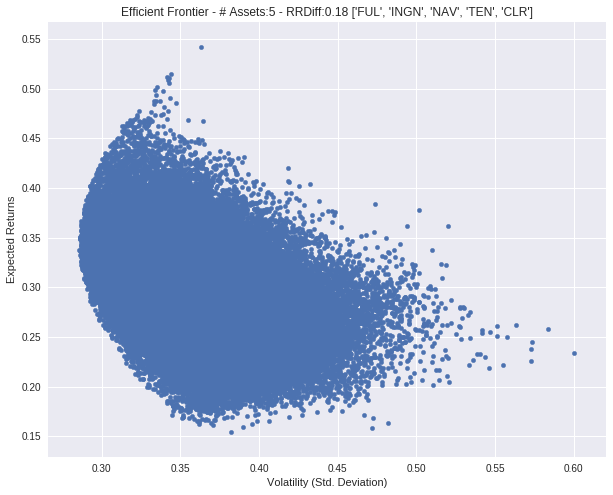

['TPH', 'AMRC', 'QSII', 'SBH', 'NWS']
# 4910 , RRDiff: -0.0796775161776
['PROV', 'SNCR', 'POL', 'BZH', 'ITCI']
# 4911 , RRDiff: -0.0865089715813
['FNGN', 'AWR', 'ENDP', 'BCOR', 'SCSC']
# 4912 , RRDiff: -0.0699004979484
['LCI', 'DYN', 'GHM', 'MDXG', 'APA']
# 4913 , RRDiff: -0.047428310818
['BBT', 'WY', 'PIR', 'UNP', 'SDRL']
# 4914 , RRDiff: -0.0939276924989
['DXLG', 'CLCT', 'MGNX', 'ALG', 'ADMS']
# 4915 , RRDiff: -0.0704440494069
['QCOM', 'MDC', 'OSUR', 'ZEN', 'SNCR']
# 4916 , RRDiff: 0.0258358913498
['BGC', 'FTNT', 'ANAT', 'AAWW', 'VNCE']
# 4917 , RRDiff: -0.0624207413979
['CETV', 'DRE', 'ACM', 'SON', 'UFS']
# 4918 , RRDiff: -0.12171036638
['HHS', 'IBM', 'RJF', 'WRI', 'SAFT']
# 4919 , RRDiff: -0.0675966604787
['HF', 'ABBV', 'SEAC', 'LTS', 'GMO']
# 4920 , RRDiff: 0.0116874026428
['RBCN', 'SDRL', 'WBA', 'MCK', 'CTT']
# 4921 , RRDiff: -0.106762860764
['NLS', 'CDR', 'MXL', 'PLUS', 'FFIC']
# 4922 , RRDiff: -0.0797743481447
['NPO', 'AES', 'AIG', 'EVR', 'VSAR']
# 4923 , RRDiff: -0.11590562246

# 5024 , RRDiff: -0.0361536656339
['ADP', 'SP', 'AAWW', 'PNC', 'MAN']
# 5025 , RRDiff: -0.0804000894963
['JBT', 'MITK', 'PNNT', 'JACK', 'ETFC']
# 5026 , RRDiff: -0.0133299783113
['SN', 'CGNX', 'FR', 'EGN', 'WLH']
# 5027 , RRDiff: -0.119941959647
['LEG', 'DX', 'MAIN', 'MTRX', 'FIX']
# 5028 , RRDiff: -0.0409732135464
['DK', 'CZR', 'SRI', 'MAT', 'HAE']
# 5029 , RRDiff: -0.0970864885624
['TRS', 'FLR', 'ATR', 'ECOL', 'IBKR']
# 5030 , RRDiff: -0.0486756778193
['CLD', 'CONN', 'ABM', 'TCBI', 'RAD']
# 5031 , RRDiff: -0.121668392834
['AKR', 'XCRA', 'BNFT', 'TRV', 'SNA']
# 5032 , RRDiff: -0.072680504441
['ALEX', 'EIGI', 'DNKN', 'RWT', 'NTCT']
# 5033 , RRDiff: -0.0435828918721
['FFIN', 'AMBR', 'AVA', 'LINC', 'PCAR']
# 5034 , RRDiff: -0.0761751581176
['KBH', 'PDLI', 'ANDE', 'CHMG', 'FRBK']
# 5035 , RRDiff: -0.0517177280934
['MAS', 'UBA', 'RGLS', 'COUP', 'BMRC']
# 5036 , RRDiff: -0.0134177676935
['CPRT', 'OCN', 'DHI', 'NRIM', 'SYNT']
# 5037 , RRDiff: -0.0293583135677
['KTWO', 'PES', 'FFIV', 'VHC', '

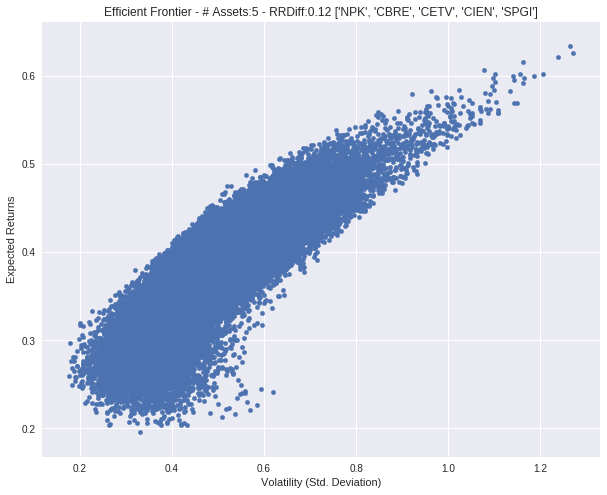

['MSI', 'GERN', 'HRS', 'FFKT', 'OPK']
# 5092 , RRDiff: -0.099700650102
['CBK', 'TTPH', 'INGN', 'HZO', 'CRAI']
# 5093 , RRDiff: 0.161790983517


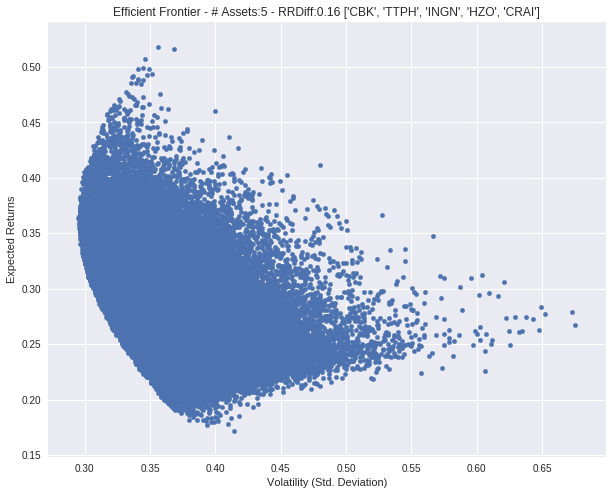

['EFII', 'AYI', 'BGG', 'GPX', 'TNET']
# 5094 , RRDiff: -0.025500032411
['TPH', 'RGLS', 'MBI', 'TWI', 'GILD']
# 5095 , RRDiff: -0.0913477494712
['FLR', 'RPT', 'RRTS', 'MDRX', 'FL']
# 5096 , RRDiff: -0.107698203236
['UNH', 'UEIC', 'SIG', 'UBNT', 'AIV']
# 5097 , RRDiff: 0.00830052294633
['MANH', 'HLT', 'USM', 'ALGT', 'HCOM']
# 5098 , RRDiff: 0.0573668745112
['HA', 'ORN', 'JCI', 'BSRR', 'AHC']
# 5099 , RRDiff: -0.118033198747
['ACN', 'CRI', 'TTEC', 'JCOM', 'DAL']
# 5100 , RRDiff: -0.035862583131
['ARTNA', 'PAG', 'ADTN', 'A', 'RGA']
# 5101 , RRDiff: -0.0646307748317
['MSI', 'MCRI', 'OMC', 'ANAT', 'PCAR']
# 5102 , RRDiff: -0.088270031396
['AKBA', 'NM', 'NTAP', 'BGC', 'VNDA']
# 5103 , RRDiff: -0.175122655125
['CPSI', 'GSIT', 'IFF', 'ALSN', 'USAP']
# 5104 , RRDiff: -0.056673940705
['KND', 'HRS', 'ICE', 'GORO', 'MMC']
# 5105 , RRDiff: -0.0377838057607
['SEB', 'EBIO', 'VNO', 'PRAA', 'AGEN']
# 5106 , RRDiff: -0.091295175625
['AGYS', 'ZION', 'UFS', 'EGHT', 'BGCP']
# 5107 , RRDiff: -0.165637165129


# 5208 , RRDiff: 0.00674094679086
['AKRX', 'GTXI', 'PLUS', 'GSBD', 'GLDD']
# 5209 , RRDiff: -6.63831120257e-05
['QNST', 'SBNY', 'GHL', 'KBR', 'WSR']
# 5210 , RRDiff: -0.0763757360611
['SLB', 'OFIX', 'SPR', 'HFWA', 'DCI']
# 5211 , RRDiff: -0.064579651364
['IBP', 'NX', 'STC', 'MTSC', 'HCC']
# 5212 , RRDiff: 0.0646547879585
['OII', 'PSX', 'NCI', 'RMAX', 'QCOM']
# 5213 , RRDiff: 0.0334935108165
['ATRO', 'DJCO', 'NGHC', 'LE', 'ATR']
# 5214 , RRDiff: -0.00631421577177
['IRDM', 'FDS', 'FSS', 'BDN', 'LXU']
# 5215 , RRDiff: -0.0842816277708
['CGI', 'ACM', 'SVVC', 'PRFT', 'T']
# 5216 , RRDiff: -0.123888262216
['GVA', 'MDCA', 'SBNY', 'APA', 'HWKN']
# 5217 , RRDiff: -0.0721824574961
['ECYT', 'WSFS', 'SN', 'OII', 'GLNG']
# 5218 , RRDiff: -0.084248190255
['NYNY', 'FLDM', 'LRCX', 'FLXS', 'DST']
# 5219 , RRDiff: -0.0559170723422
['RMTI', 'LION', 'MWA', 'ODFL', 'CBL']
# 5220 , RRDiff: -0.0399746299237
['SBGI', 'CRR', 'IBKC', 'ROG', 'TPR']
# 5221 , RRDiff: 0.377145136463


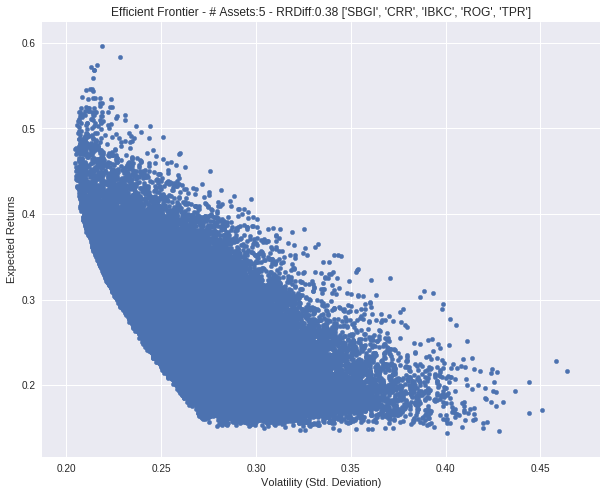

['TXMD', 'RGLS', 'MNRO', 'TUP', 'CCK']
# 5222 , RRDiff: -0.0518343800533
['MDC', 'SLB', 'AFSI', 'V', 'DCI']
# 5223 , RRDiff: -0.0240845329661
['HP', 'MHLD', 'EOG', 'HIL', 'K']
# 5224 , RRDiff: -0.0706008305443
['ELLI', 'BSRR', 'ALDR', 'SAFT', 'MINI']
# 5225 , RRDiff: 0.0541421004065
['CNBKA', 'CAR', 'HOMB', 'MPW', 'UIS']
# 5226 , RRDiff: -0.0823213153876
['NTGR', 'WELL', 'DAKT', 'VSEC', 'EBTC']
# 5227 , RRDiff: -0.0791691678771
['DRH', 'BRK_B', 'MPWR', 'GOOGL', 'THS']
# 5228 , RRDiff: -0.0101847835633
['PKOH', 'HF', 'NLNK', 'CTT', 'TWO']
# 5229 , RRDiff: -0.0850412319674
['FFIV', 'PPBI', 'ENR', 'KIM', 'A']
# 5230 , RRDiff: -0.0774548075585
['ICFI', 'BDN', 'PFIE', 'ROCK', 'YELP']
# 5231 , RRDiff: -0.0067618079851
['NCR', 'HSY', 'INWK', 'TAL', 'KIM']
# 5232 , RRDiff: 0.051646682149
['TISI', 'CBK', 'MTSI', 'TRUE', 'GTXI']
# 5233 , RRDiff: -0.151197908577
['SCVL', 'HBI', 'PTEN', 'POST', 'VGR']
# 5234 , RRDiff: -0.026249765858
['LECO', 'GNCA', 'AMT', 'IBKR', 'FISV']
# 5235 , RRDiff: -0.0834

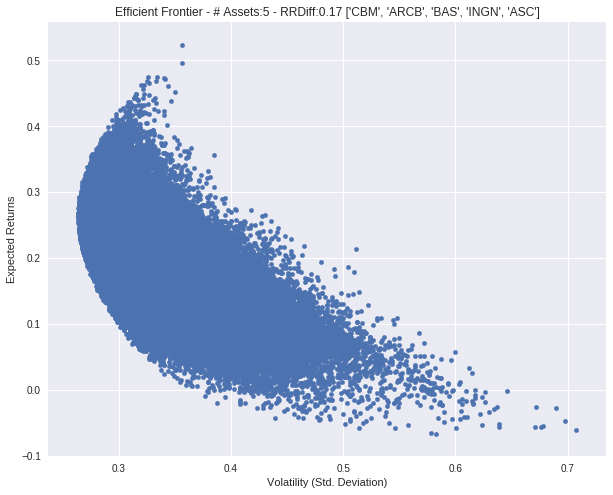

['HP', 'EGL', 'EBF', 'ETN', 'FORM']
# 5247 , RRDiff: -0.087546427261
['PCH', 'PKD', 'SLRC', 'WWW', 'DLR']
# 5248 , RRDiff: -0.0202087550064
['BKU', 'IPI', 'ATEC', 'ONB', 'TRXC']
# 5249 , RRDiff: -0.100961753621
['CPA', 'SVU', 'HFWA', 'IIVI', 'LGND']
# 5250 , RRDiff: -0.0445157308529
['CATO', 'ENV', 'GLF', 'UFI', 'MLR']
# 5251 , RRDiff: -0.052885921222
['GMO', 'VOXX', 'AINV', 'SIR', 'SAIC']
# 5252 , RRDiff: -0.0138651614101
['CIA', 'WLB', 'TRIP', 'INAP', 'USM']
# 5253 , RRDiff: -0.15071906959
['FBHS', 'NCI', 'PEG', 'HL', 'HR']
# 5254 , RRDiff: 0.0178910922543
['CIDM', 'AGM', 'CRK', 'JACK', 'O']
# 5255 , RRDiff: -0.0738114465083
['RDNT', 'VICR', 'IBM', 'JBT', 'SUPN']
# 5256 , RRDiff: 0.070918516308
['ANH', 'CACI', 'FFKT', 'KRO', 'PYPL']
# 5257 , RRDiff: 0.0291103503525
['TPR', 'JJSF', 'ADI', 'HEAR', 'MOD']
# 5258 , RRDiff: 0.400039857615


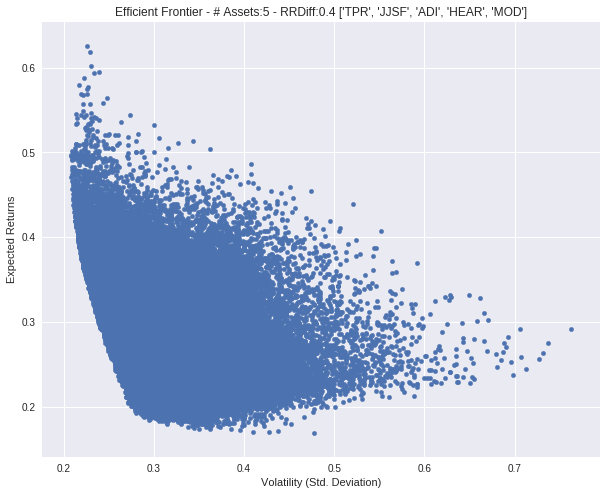

['FIZZ', 'SKYW', 'CSGP', 'WEN', 'LZB']
# 5259 , RRDiff: -0.0335959517098
['UNFI', 'HY', 'PLAB', 'DK', 'SPR']
# 5260 , RRDiff: -0.077637114318
['TEL', 'HTBK', 'CLGX', 'BOOM', 'CPK']
# 5261 , RRDiff: -0.0481076706087
['RWT', 'GLW', 'DVN', 'TTI', 'XPO']
# 5262 , RRDiff: -0.0678344334734
['BMY', 'ETN', 'SUI', 'GOOD', 'BKU']
# 5263 , RRDiff: -0.0530268482093
['FSP', 'LEA', 'KO', 'NUAN', 'PGEM']
# 5264 , RRDiff: 0.0111215443617
['MS', 'WSFS', 'ASCMA', 'PEGA', 'SGMO']
# 5265 , RRDiff: -0.0831730898865
['STWD', 'AMBA', 'FOXA', 'HDNG', 'CONN']
# 5266 , RRDiff: 0.0310665692784
['VVC', 'FIVE', 'TISI', 'JCI', 'PPG']
# 5267 , RRDiff: -0.027512080178
['ACN', 'AFAM', 'KSU', 'BBW', 'HZNP']
# 5268 , RRDiff: -0.00286411840401
['RAIL', 'QADA', 'EXPE', 'CRMT', 'AGX']
# 5269 , RRDiff: -0.0299367960444
['AIN', 'PKI', 'BSX', 'CRR', 'IVR']
# 5270 , RRDiff: -0.0442590790122
['MDCA', 'EGLT', 'CNBKA', 'BXS', 'CMA']
# 5271 , RRDiff: -0.114162755119
['OGS', 'SLCA', 'JNPR', 'HMHC', 'ZOES']
# 5272 , RRDiff: 0.010366

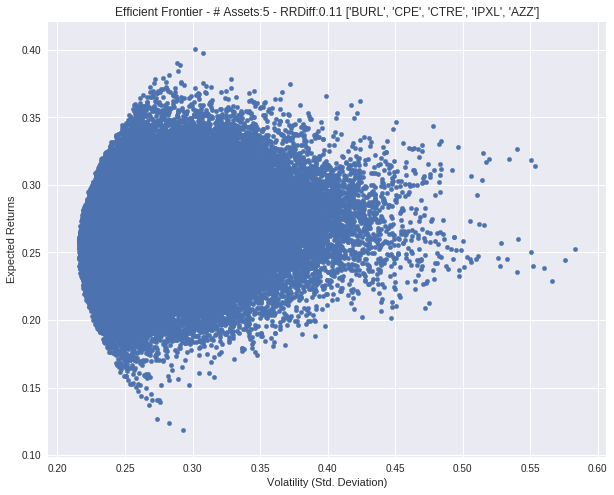

['IDT', 'SEB', 'FELE', 'PCAR', 'REV']
# 5306 , RRDiff: -0.0897170907896
['CB', 'NMFC', 'CCF', 'EIGI', 'LHCG']
# 5307 , RRDiff: -0.0153053032869
['EHTH', 'MGI', 'LADR', 'OGS', 'BCPC']
# 5308 , RRDiff: 0.0349801940106
['CPRT', 'TMK', 'IVZ', 'NEOG', 'TRC']
# 5309 , RRDiff: -0.0179479636582
['ENR', 'PEG', 'EHTH', 'MAN', 'CBT']
# 5310 , RRDiff: -0.0792145050844
['AFSI', 'SXI', 'MTD', 'PRGX', 'GORO']
# 5311 , RRDiff: -0.0324492745918
['RELL', 'ANIK', 'INSY', 'DRH', 'OXFD']
# 5312 , RRDiff: -0.107849297491
['DOX', 'WSBF', 'OMED', 'MTD', 'AOS']
# 5313 , RRDiff: -0.0545125663346
['BTU', 'HOS', 'NLSN', 'MKL', 'AKS']
# 5314 , RRDiff: -0.0896281786321
['MN', 'MOSY', 'RCL', 'WSFS', 'WMC']
# 5315 , RRDiff: -0.0950091907636
['BERY', 'VICR', 'EXPR', 'MPW', 'PRIM']
# 5316 , RRDiff: 0.0217537461592
['LBY', 'MAS', 'EW', 'DST', 'FBNK']
# 5317 , RRDiff: -0.00214832601101
['SBSI', 'IR', 'HST', 'OSIS', 'LOPE']
# 5318 , RRDiff: -0.00917004582617
['LYTS', 'HHS', 'HEES', 'LOGM', 'PEI']
# 5319 , RRDiff: -0.08851

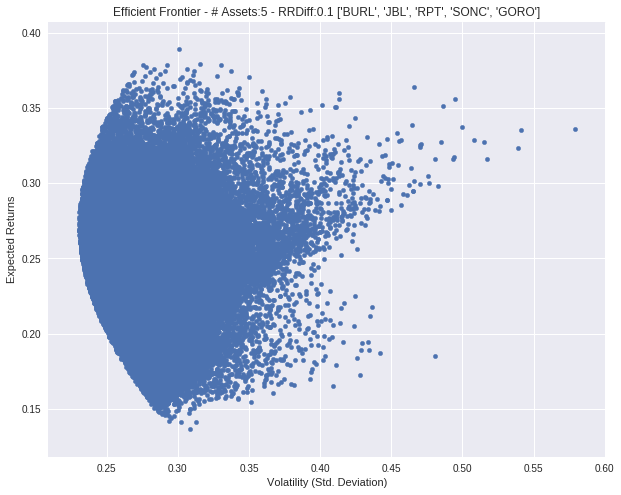

['OFIX', 'AMNB', 'WD', 'SKX', 'PEI']
# 5374 , RRDiff: 0.00129666396315
['BAS', 'OMED', 'AAPL', 'KOS', 'CNBKA']
# 5375 , RRDiff: -0.0457561194561
['RLJ', 'BECN', 'MXWL', 'CIM', 'FUL']
# 5376 , RRDiff: -0.111853193612
['HTLD', 'RBC', 'INGR', 'NYNY', 'UPS']
# 5377 , RRDiff: -0.0736119403501
['BKNG', 'SSD', 'BRKR', 'BAC', 'AE']
# 5378 , RRDiff: -0.0987832628142
['ACXM', 'FARO', 'WTS', 'CNP', 'BMY']
# 5379 , RRDiff: -0.0808316825417
['USNA', 'ENZ', 'EGN', 'CKH', 'LCUT']
# 5380 , RRDiff: -0.073116592379
['ABT', 'RCL', 'MINI', 'WWD', 'EHTH']
# 5381 , RRDiff: -0.0641285872945
['LRN', 'TRMK', 'PACW', 'ZIOP', 'HRS']
# 5382 , RRDiff: -0.0970424974107
['SVU', 'TNDM', 'HURN', 'CLR', 'CMA']
# 5383 , RRDiff: -0.124900875848
['PRSC', 'MCHX', 'GPX', 'IBTX', 'HMTV']
# 5384 , RRDiff: -0.03628014356
['UCBI', 'MIND', 'CYTK', 'BDC', 'RVLT']
# 5385 , RRDiff: -0.195727645295
['NFX', 'TYPE', 'EVTC', 'MITT', 'MXWL']
# 5386 , RRDiff: -0.0668233952431
['IPHS', 'VECO', 'FCNCA', 'LXRX', 'AMRS']
# 5387 , RRDiff: -0.

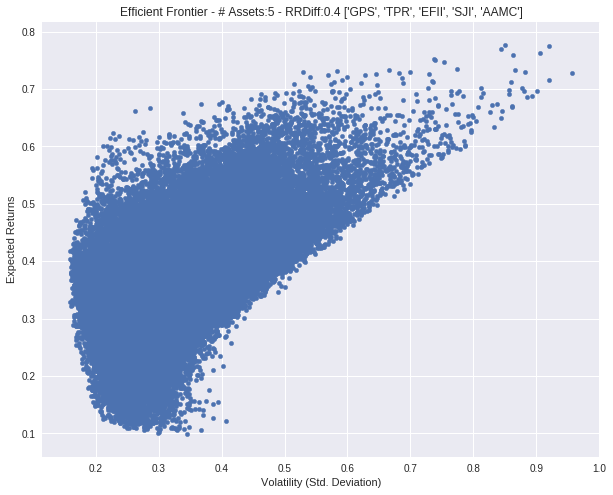

['GFN', 'PGTI', 'PATK', 'TROW', 'VG']
# 5485 , RRDiff: -0.0619355074667
['TR', 'QRVO', 'ZIOP', 'FLDM', 'PLAB']
# 5486 , RRDiff: -0.154276673973
['ICPT', 'SREV', 'AME', 'CVX', 'LMNX']
# 5487 , RRDiff: -0.033921866837
['PFBC', 'FORR', 'BCOR', 'SIGA', 'TWI']
# 5488 , RRDiff: -0.0880709013145
['CWH', 'CAG', 'SPN', 'EGAN', 'KW']
# 5489 , RRDiff: -0.0101217919123
['PLOW', 'PPG', 'LNC', 'DPS', 'AT']
# 5490 , RRDiff: 0.02044151217
['TAT', 'MRC', 'LPNT', 'WLL', 'JOE']
# 5491 , RRDiff: -0.155226887371
['FNHC', 'COKE', 'GDP', 'MYGN', 'GBL']
# 5492 , RRDiff: -0.0582418160628
['KSU', 'CPST', 'CORT', 'CVBF', 'SJM']
# 5493 , RRDiff: -0.0378307038305
['GHC', 'RE', 'ACAD', 'PANW', 'BRC']
# 5494 , RRDiff: -0.0146124693273
['RRD', 'STZ', 'LABL', 'PAY', 'SB']
# 5495 , RRDiff: -0.030510013383
['AMKR', 'CALL', 'JACK', 'MBFI', 'BWA']
# 5496 , RRDiff: -0.08997069014
['TDS', 'AHP', 'BH', 'JNPR', 'PG']
# 5497 , RRDiff: -0.105995148194
['TPX', 'FNGN', 'WAIR', 'NES', 'SCHL']
# 5498 , RRDiff: -0.12474114392
['HLIT

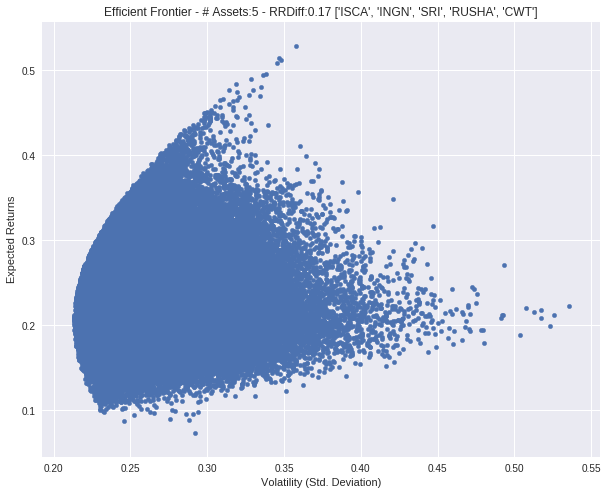

['PCH', 'EIX', 'BGFV', 'PKG', 'GHL']
# 5514 , RRDiff: -0.085001111464
['PEIX', 'III', 'DAVE', 'MBI', 'POWI']
# 5515 , RRDiff: -0.14773435849
['SFL', 'MAR', 'SP', 'SF', 'KEM']
# 5516 , RRDiff: -0.0724531003099
['SRE', 'PDM', 'BOFI', 'SPPI', 'THO']
# 5517 , RRDiff: -0.0116634727667
['BFAM', 'HIVE', 'KRNY', 'MET', 'LGND']
# 5518 , RRDiff: 0.0407263093767
['EAT', 'GOOGL', 'NFX', 'FIVE', 'BDX']
# 5519 , RRDiff: 0.0104118439873
['SBH', 'SCS', 'GPRE', 'BFAM', 'PKOH']
# 5520 , RRDiff: 0.0459822726466
['ONVO', 'PB', 'ARAY', 'YRCW', 'LEG']
# 5521 , RRDiff: -0.0931051158003
['RDN', 'AFG', 'EAT', 'MGNX', 'UPS']
# 5522 , RRDiff: -0.102260350183
['WRE', 'FCBC', 'CORR', 'AWR', 'GEOS']
# 5523 , RRDiff: -0.0919291022015
['FLT', 'TRST', 'ANF', 'KEY', 'ITIC']
# 5524 , RRDiff: 0.0401261811567
['BSX', 'WTFC', 'FFIV', 'MMI', 'QUAD']
# 5525 , RRDiff: -0.0133043358628
['CTL', 'UDR', 'GSM', 'BKE', 'HIFS']
# 5526 , RRDiff: -0.023521970976
['WPP', 'OLED', 'BRKL', 'SPRT', 'SFBS']
# 5527 , RRDiff: 0.0628925054877


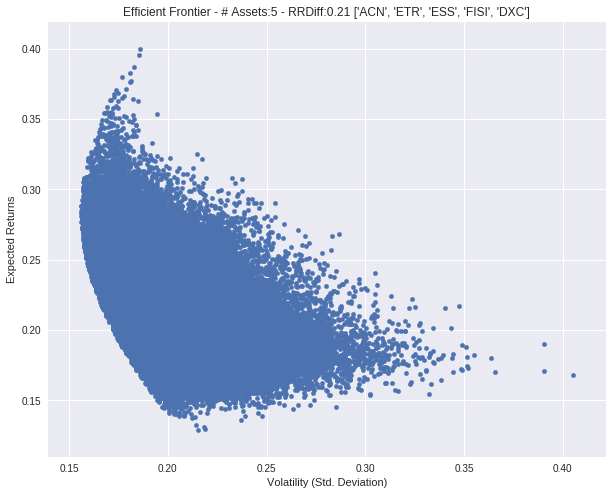

['UDR', 'CCXI', 'SMRT', 'ABMD', 'PRSC']
# 5531 , RRDiff: -0.039584908509
['UMPQ', 'CHUY', 'AMP', 'AXAS', 'GT']
# 5532 , RRDiff: -0.101946668406
['HP', 'AES', 'CVGW', 'LHO', 'CTB']
# 5533 , RRDiff: -0.0760571774855
['HTH', 'WBS', 'JNPR', 'INN', 'AVA']
# 5534 , RRDiff: -0.0897227074188
['NWBI', 'GWRE', 'CROX', 'CTRL', 'IRWD']
# 5535 , RRDiff: -0.00719611975812
['NDLS', 'IR', 'ERII', 'ATEC', 'KIN']
# 5536 , RRDiff: -0.16442877794
['CMC', 'LYB', 'HIBB', 'TSCO', 'HLX']
# 5537 , RRDiff: 0.00848197437837
['WASH', 'WGO', 'CGI', 'DK', 'LQ']
# 5538 , RRDiff: -0.117223392437
['ADSK', 'CE', 'WCN', 'TMUS', 'UMBF']
# 5539 , RRDiff: -0.0641996077957
['PCAR', 'LOPE', 'FMC', 'IMGN', 'OMEX']
# 5540 , RRDiff: 0.0239706772861
['OMCL', 'ITRI', 'HRZN', 'AIG', 'RLGY']
# 5541 , RRDiff: -0.0844041124415
['HI', 'LNC', 'AWK', 'ATNM', 'EVC']
# 5542 , RRDiff: -0.0177420691471
['UNH', 'MTDR', 'ECHO', 'AMAT', 'ENPH']
# 5543 , RRDiff: -0.0121446484261
['PENN', 'CTO', 'BG', 'WTBA', 'EMN']
# 5544 , RRDiff: -0.050814632

# 5645 , RRDiff: -0.101137683879
['MOH', 'CUZ', 'USLM', 'HCKT', 'SCI']
# 5646 , RRDiff: -0.0847048475741
['GEF', 'OLN', 'AMD', 'MDRX', 'AINV']
# 5647 , RRDiff: -0.135013274811
['INFN', 'MLHR', 'EE', 'KAMN', 'NRG']
# 5648 , RRDiff: -0.0925141618437
['JACK', 'SO', 'BLX', 'NTGR', 'GSVC']
# 5649 , RRDiff: -0.0446055833295
['ATEC', 'MON', 'PTIE', 'TK', 'LNDC']
# 5650 , RRDiff: -0.0950763744479
['KPTI', 'ETR', 'QGEN', 'FNB', 'BDX']
# 5651 , RRDiff: -0.0511777792572
['NYT', 'NYRT', 'AXP', 'CR', 'WD']
# 5652 , RRDiff: -0.00450968221404
['IBCP', 'NFX', 'DECK', 'BGFV', 'TTPH']
# 5653 , RRDiff: -0.0626576859147
['CALD', 'BR', 'CBK', 'CARB', 'ALCO']
# 5654 , RRDiff: -0.0300070882818
['AL', 'CMP', 'AKRX', 'AEL', 'GPK']
# 5655 , RRDiff: -0.0179994235707
['USAK', 'NRCIA', 'FRED', 'EXAS', 'CHMG']
# 5656 , RRDiff: -0.064522060153
['WASH', 'ARCC', 'EOG', 'TREX', 'CTG']
# 5657 , RRDiff: -0.0639835857143
['ALGN', 'RTRX', 'HBCP', 'CTXS', 'IRBT']
# 5658 , RRDiff: 0.0550297487957
['QTM', 'DDR', 'HAL', 'ALIM'

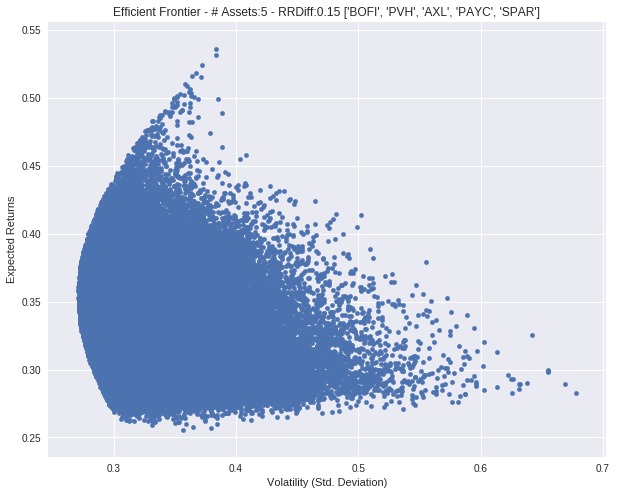

['IMPV', 'RUTH', 'IRBT', 'PERI', 'APEI']
# 5752 , RRDiff: -0.128886826533
['WDFC', 'MFA', 'BLK', 'PWR', 'GCO']
# 5753 , RRDiff: -0.0269627701478
['SKYW', 'CVX', 'KLAC', 'CBZ', 'DRNA']
# 5754 , RRDiff: -0.0916272846287
['HEES', 'AES', 'CSOD', 'NWE', 'PBPB']
# 5755 , RRDiff: -0.0662342903273
['CERN', 'RHI', 'ACHC', 'USB', 'KVHI']
# 5756 , RRDiff: -0.0453959645914
['BFIN', 'NATH', 'SSP', 'ZION', 'FINL']
# 5757 , RRDiff: -0.0606837231127
['HCP', 'TCRD', 'DJCO', 'ESNT', 'AMAG']
# 5758 , RRDiff: -0.0181533671093
['CINF', 'ENDP', 'WASH', 'NWBI', 'INO']
# 5759 , RRDiff: -0.0985527559999
['CBZ', 'EMN', 'JACK', 'MSG', 'SCS']
# 5760 , RRDiff: 0.0110183171003
['SCS', 'SDRL', 'QCOM', 'CELG', 'DLX']
# 5761 , RRDiff: -0.0462760621993
['MSA', 'PAY', 'MGI', 'FCEL', 'AZO']
# 5762 , RRDiff: -0.046756183546
['GLDD', 'SFLY', 'DX', 'INCY', 'CDE']
# 5763 , RRDiff: -0.105107209412
['ATVI', 'MNTA', 'POOL', 'AXAS', 'HTBK']
# 5764 , RRDiff: 0.00442140927027
['TIPT', 'HBAN', 'ULTA', 'HOMB', 'FR']
# 5765 , RRDiff:

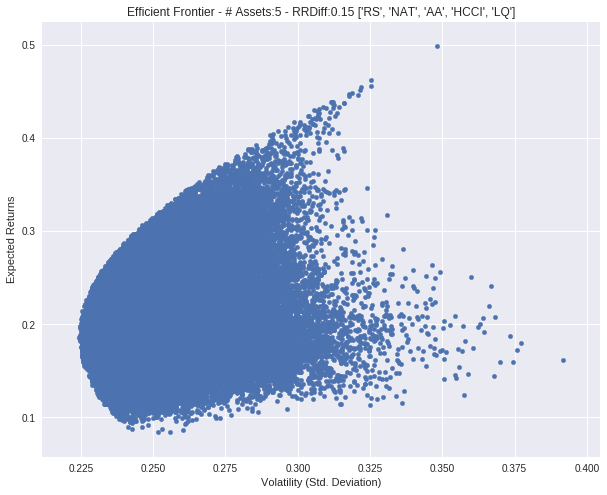

['TNC', 'KIM', 'LFVN', 'ONB', 'SRCE']
# 5819 , RRDiff: -0.131080512785
['CUBI', 'DKS', 'MKSI', 'HLX', 'BAS']
# 5820 , RRDiff: -0.0225095342983
['EBF', 'ACGL', 'GRA', 'BBOX', 'UFPT']
# 5821 , RRDiff: -0.0484496097322
['REX', 'FBP', 'MINI', 'CIEN', 'CYS']
# 5822 , RRDiff: -0.0623754290805
['MTSI', 'SWM', 'FAF', 'PCH', 'OMER']
# 5823 , RRDiff: -0.0341150240186
['FVE', 'XRAY', 'AL', 'WHR', 'RELL']
# 5824 , RRDiff: -0.0831419788344
['HTGC', 'SRE', 'PLXS', 'GHC', 'HOMB']
# 5825 , RRDiff: -0.0537984009603
['OSUR', 'NDSN', 'MEI', 'VLY', 'BOOM']
# 5826 , RRDiff: -0.0844784043255
['DCO', 'CRZO', 'AXL', 'AET', 'TGI']
# 5827 , RRDiff: -0.073937036566
['PRU', 'ANIP', 'SONC', 'WTFC', 'EGL']
# 5828 , RRDiff: -0.093993045091
['DDR', 'CTRL', 'CWCO', 'THRM', 'EGOV']
# 5829 , RRDiff: -0.0818941274938
['MSEX', 'WEN', 'HSIC', 'FBP', 'AXE']
# 5830 , RRDiff: -0.0735434844272
['TREE', 'KRC', 'WABC', 'MGLN', 'SSD']
# 5831 , RRDiff: 0.00876926622024
['ANCX', 'OMEX', 'OPY', 'AVD', 'AVHI']
# 5832 , RRDiff: -0.022

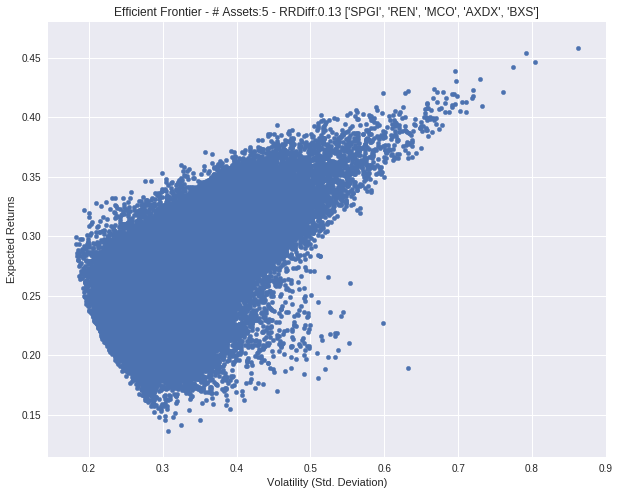

['OHRP', 'TTEK', 'ACRE', 'DXC', 'PII']
# 5877 , RRDiff: 0.236722090973


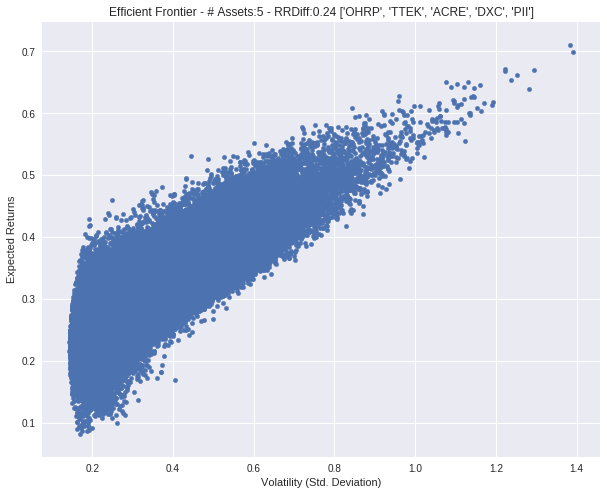

['ORCL', 'GBL', 'CRUS', 'GORO', 'TBPH']
# 5878 , RRDiff: -0.0679743194484
['DG', 'IIIN', 'CIDM', 'F', 'PE']
# 5879 , RRDiff: -0.0112112654896
['DK', 'KEY', 'VNDA', 'SEMG', 'SFE']
# 5880 , RRDiff: -0.154961064118
['IMMR', 'ARNA', 'TTMI', 'FFNW', 'SCI']
# 5881 , RRDiff: -0.150248907636
['DHR', 'EOG', 'BCPC', 'MTRX', 'ANGO']
# 5882 , RRDiff: -0.0114027462365
['CVBF', 'OPY', 'UNP', 'WFC', 'NFBK']
# 5883 , RRDiff: -0.0841203878886
['AAP', 'CALD', 'BHGE', 'PRFT', 'GRUB']
# 5884 , RRDiff: 0.0118093151652
['PMT', 'FVE', 'WEYS', 'COO', 'BMRN']
# 5885 , RRDiff: -0.0316381404561
['ASNA', 'KVHI', 'RMTI', 'MRVL', 'FAST']
# 5886 , RRDiff: -0.0667996974396
['HOMB', 'MYE', 'JCOM', 'CHRW', 'TRV']
# 5887 , RRDiff: -0.0442667658277
['MTN', 'BLX', 'EA', 'MNST', 'PX']
# 5888 , RRDiff: 0.0144073058272
['FORM', 'CRK', 'HFWA', 'HMN', 'ECL']
# 5889 , RRDiff: -0.0598088676281
['SFL', 'AIMC', 'FIBK', 'GOOGL', 'ATEC']
# 5890 , RRDiff: -0.00582311735642
['NOC', 'EBAY', 'TGI', 'VRA', 'ALOG']
# 5891 , RRDiff: -0.047

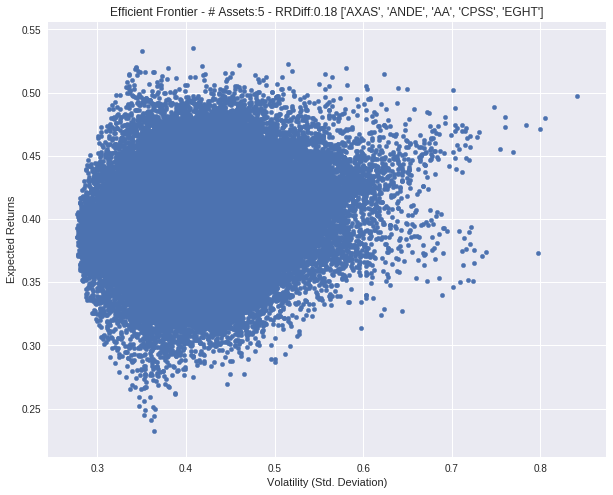

['XONE', 'FLIC', 'CL', 'MSCI', 'CACI']
# 5902 , RRDiff: -0.0218295868591
['SHW', 'PHM', 'SEM', 'PDFS', 'CIX']
# 5903 , RRDiff: -0.058047354116
['ATNM', 'FPRX', 'TEN', 'SYY', 'ULTA']
# 5904 , RRDiff: -0.0440271524909
['FFIC', 'TIVO', 'TBNK', 'NAT', 'HSY']
# 5905 , RRDiff: -0.0362729154895
['CSL', 'ISRG', 'BBY', 'VCRA', 'BRK_B']
# 5906 , RRDiff: -0.0383895490188
['AERI', 'SPWR', 'F', 'LUB', 'CGNX']
# 5907 , RRDiff: -0.0373655862297
['MYRG', 'OFIX', 'HNI', 'NUVA', 'TLYS']
# 5908 , RRDiff: -0.111004761815
['PERY', 'FWRD', 'REG', 'MLM', 'QRHC']
# 5909 , RRDiff: -0.0323465185673
['HAWK', 'CMI', 'TRN', 'AAOI', 'ACGL']
# 5910 , RRDiff: 0.00451482801626
['SHLD', 'RS', 'ESSA', 'JACK', 'TRMB']
# 5911 , RRDiff: -0.0829971702708
['SVU', 'GNE', 'TRUE', 'VOD', 'SUPN']
# 5912 , RRDiff: -0.0729074073434
['OC', 'RVLT', 'CRS', 'AEE', 'CASY']
# 5913 , RRDiff: -0.0673966710008
['FTNT', 'LFUS', 'CSL', 'BANC', 'FRED']
# 5914 , RRDiff: -0.0356728364749
['ANCX', 'TWIN', 'SEMG', 'CHH', 'ELS']
# 5915 , RRDiff: -

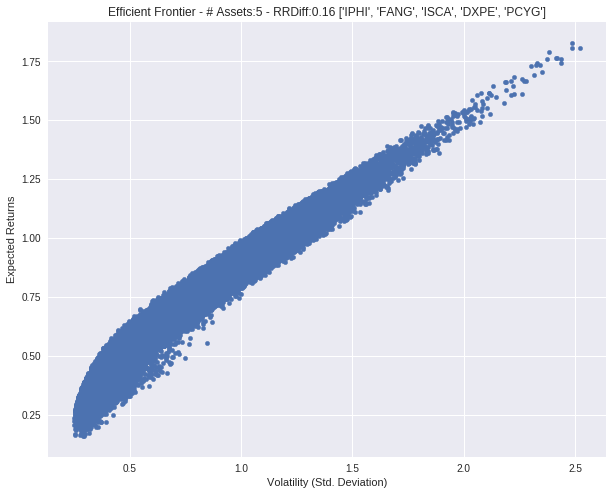

['ADC', 'IBOC', 'TIVO', 'PRGS', 'NEE']
# 5932 , RRDiff: -0.0450824449077
['LMNR', 'MSA', 'THFF', 'PBCT', 'RRTS']
# 5933 , RRDiff: -0.0646074847498
['CHDN', 'ENR', 'MEIP', 'EPR', 'FULT']
# 5934 , RRDiff: -0.0926577362641
['CSRA', 'RBCN', 'WYNN', 'THFF', 'CRMT']
# 5935 , RRDiff: -0.0361336403078
['TEX', 'RPT', 'ESRX', 'CVGI', 'MTB']
# 5936 , RRDiff: -0.0849594942266
['AMRS', 'SQBG', 'TISI', 'CLCT', 'HHC']
# 5937 , RRDiff: -0.0127092025843
['TIS', 'IQV', 'CBK', 'RHT', 'WSBC']
# 5938 , RRDiff: -0.107537590395
['CDNS', 'PDLI', 'BGG', 'MMC', 'DPZ']
# 5939 , RRDiff: -0.0224393057459
['CMCSA', 'PBH', 'MORN', 'OSUR', 'CVLT']
# 5940 , RRDiff: -0.0759094880267
['TRV', 'UFPT', 'TOL', 'TWI', 'DDD']
# 5941 , RRDiff: -0.0622756570426
['TRNO', 'ABT', 'RGLD', 'OLP', 'IPHI']
# 5942 , RRDiff: -0.0195372849387
['COHU', 'AJG', 'JLL', 'NATI', 'TDS']
# 5943 , RRDiff: -0.0660388700408
['TNC', 'ODC', 'SB', 'CSFL', 'AHH']
# 5944 , RRDiff: -0.0553226981646
['HPQ', 'CNSL', 'CSFL', 'PATK', 'ORBC']
# 5945 , RRDiff:

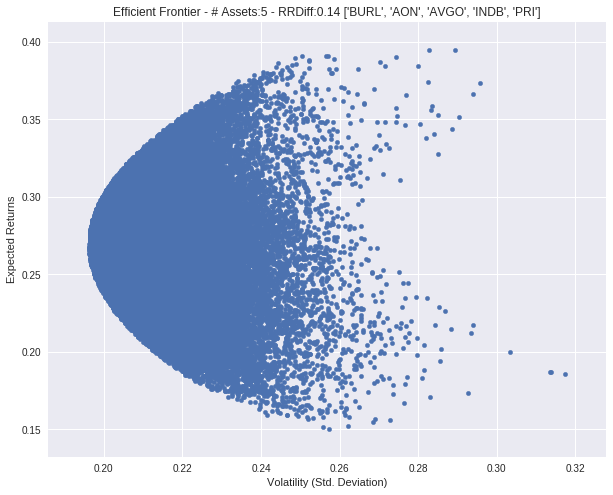

['WMC', 'TRV', 'DHI', 'GRUB', 'VPG']
# 6026 , RRDiff: -0.00592418208898
['VTNR', 'VVUS', 'VVI', 'CHTR', 'KR']
# 6027 , RRDiff: 0.12409893989


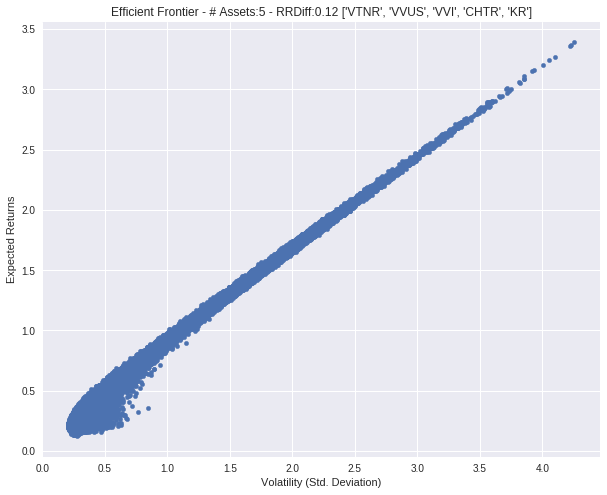

['UNP', 'ROP', 'LMT', 'SIVB', 'HF']
# 6028 , RRDiff: -0.011794266617
['KR', 'F', 'AMKR', 'TTC', 'GALT']
# 6029 , RRDiff: -0.0200562155498
['GWRE', 'LSTR', 'CAG', 'SIG', 'SPAR']
# 6030 , RRDiff: 0.0165189466911
['MCRI', 'ALKS', 'OHRP', 'NX', 'MTSC']
# 6031 , RRDiff: -0.0414516318867
['ABT', 'NCI', 'CBPX', 'ALNY', 'MBII']
# 6032 , RRDiff: -0.0489288745897
['CY', 'MS', 'CTAS', 'XOMA', 'SFL']
# 6033 , RRDiff: -0.118466663325
['BK', 'WRI', 'DXYN', 'OGS', 'M']
# 6034 , RRDiff: 0.0149643497525
['RESI', 'JCI', 'GPT', 'MSEX', 'OCFC']
# 6035 , RRDiff: -0.103417814649
['IIVI', 'ROK', 'SGMS', 'WSFS', 'FIX']
# 6036 , RRDiff: -0.0552559602296
['AGM', 'WETF', 'GNTX', 'HBIO', 'CTB']
# 6037 , RRDiff: -0.10669134651
['GTN', 'IO', 'DDD', 'ILMN', 'REX']
# 6038 , RRDiff: -0.0951315078833
['DKS', 'FUL', 'HTGC', 'HOFT', 'WDC']
# 6039 , RRDiff: -0.0664488525125
['MODN', 'MORN', 'WMGI', 'VRTU', 'DBD']
# 6040 , RRDiff: -0.083900129395
['AKRX', 'HELE', 'LYV', 'CTBI', 'MTH']
# 6041 , RRDiff: -0.0203463278477
['AL

# 6142 , RRDiff: 0.0136923739137
['HOS', 'S', 'PTEN', 'VGR', 'D']
# 6143 , RRDiff: -0.0623498107168
['DCOM', 'DNKN', 'TISI', 'OLP', 'BP']
# 6144 , RRDiff: -0.0315602530798
['USNA', 'AGYS', 'DRI', 'WAFD', 'CRY']
# 6145 , RRDiff: -0.0534397479461
['GTY', 'IBKR', 'UBA', 'NBL', 'AL']
# 6146 , RRDiff: -0.0757059983276
['NCS', 'AOI', 'CTIC', 'CIA', 'AME']
# 6147 , RRDiff: -0.0795222809478
['COR', 'DGII', 'HAS', 'KEYW', 'IBM']
# 6148 , RRDiff: 0.0381345229611
['CBM', 'BIG', 'IMGN', 'WASH', 'XONE']
# 6149 , RRDiff: -0.117369852614
['NLSN', 'STAA', 'ZOES', 'LAD', 'OXFD']
# 6150 , RRDiff: -0.103091908289
['INFI', 'AKR', 'WTM', 'OCLR', 'NDAQ']
# 6151 , RRDiff: -0.0987616255197
['HMSY', 'CDNS', 'BH', 'TECD', 'LNN']
# 6152 , RRDiff: -0.10777274487
['ANGO', 'PPG', 'CASY', 'WR', 'MBI']
# 6153 , RRDiff: -0.0704917813356
['LTM', 'NCI', 'DOOR', 'BKE', 'GGG']
# 6154 , RRDiff: -0.0615563582015
['XOXO', 'CLH', 'AEL', 'ALSN', 'WABC']
# 6155 , RRDiff: -0.0346919724449
['EPAM', 'BMS', 'PDFS', 'OMER', 'NTRS']


# 6256 , RRDiff: -0.14351103274
['ABT', 'RS', 'MNTA', 'CIR', 'CRAI']
# 6257 , RRDiff: -0.0746230622468
['ROG', 'WST', 'SBH', 'JEC', 'TGT']
# 6258 , RRDiff: -0.0826755059077
['MHLD', 'IOSP', 'BKE', 'EGHT', 'CERS']
# 6259 , RRDiff: -0.08934662343
['CLGX', 'CAKE', 'MSCC', 'SJM', 'GOOG']
# 6260 , RRDiff: -0.00573862583458
['INGN', 'QTWO', 'MNR', 'CHEF', 'HPE']
# 6261 , RRDiff: 0.182624445868


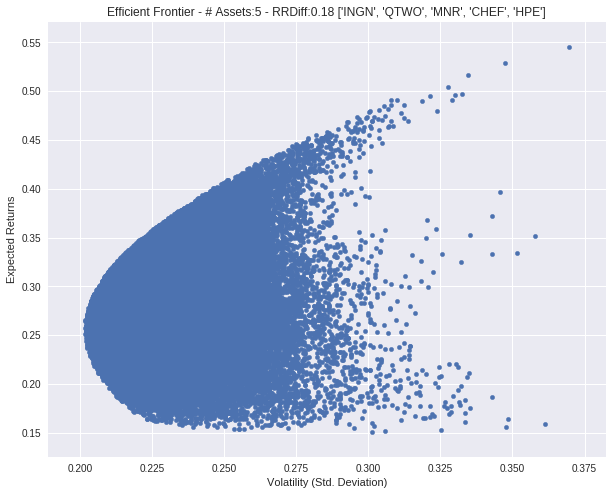

['ADUS', 'TUES', 'PRK', 'KALU', 'NOW']
# 6262 , RRDiff: 0.0555922072317
['NYNY', 'INDB', 'DNR', 'FLWS', 'SVVC']
# 6263 , RRDiff: -0.114919396376
['VPG', 'JMBA', 'SCVL', 'UHAL', 'TCBI']
# 6264 , RRDiff: -0.0994124944227
['MMI', 'PERI', 'IRM', 'COLM', 'IBTX']
# 6265 , RRDiff: 0.00784038374316
['TTPH', 'VNDA', 'LOV', 'STAA', 'WCG']
# 6266 , RRDiff: -0.0749103083503
['FRBK', 'GRC', 'MLAB', 'PERY', 'INT']
# 6267 , RRDiff: -0.019241590271
['WHF', 'RGEN', 'HEES', 'HI', 'OHI']
# 6268 , RRDiff: -0.0397498563827
['CRCM', 'SPSC', 'CUR', 'TFSL', 'GRC']
# 6269 , RRDiff: -0.0705879145219
['CHSP', 'RTEC', 'NTAP', 'LXU', 'BCOV']
# 6270 , RRDiff: -0.0942130995926
['APA', 'SGMO', 'BBW', 'RRGB', 'PKG']
# 6271 , RRDiff: -0.0724904405711
['SCS', 'CYTR', 'RLJ', 'AVHI', 'AMWD']
# 6272 , RRDiff: -0.12079694125
['CSGS', 'MPWR', 'AMAT', 'EQIX', 'ATRO']
# 6273 , RRDiff: -0.0470906486974
['HAYN', 'CHFN', 'ITCI', 'IPAR', 'STLD']
# 6274 , RRDiff: -0.0440116626439
['IRBT', 'CIA', 'TAST', 'TFX', 'DISCK']
# 6275 , RRD

KeyboardInterrupt: 

In [14]:
for drawnr in range (0,20000):
    selected = list(np.random.choice(stock_symbol_list, 5, replace=False))
    print selected

    '''
    data = quandl.get_table('WIKI/PRICES', ticker = selected,
                            qopts = { 'columns': ['date', 'ticker', 'adj_close'] },
                            date = { 'gte': '1999-1-1', 'lte': '2018-12-31' }, paginate=True)
    clean = data.set_index('date')
    table = clean.pivot(columns='ticker')
    table.columns = table.columns.droplevel()
    '''
    table = history_df[selected]


    # calculate daily and annual returns of the stocks
    returns_daily = table.pct_change()
    #print returns_daily
    returns_annual = returns_daily.mean() * 250

    # get daily and covariance of returns of the stock
    cov_daily = returns_daily.cov()
    cov_annual = cov_daily * 250
    #print cov_annual

    #print cov_daily

    # empty lists to store returns, volatility and weights of imiginary portfolios
    port_returns = []
    port_volatility = []
    port_return_risk_diff = []
    stock_weights = []

    # set the number of combinations for imaginary portfolios
    num_assets = len(selected)
    num_portfolios = 75000

    # populate the empty lists with each portfolios returns,risk and weights
    for single_portfolio in range(num_portfolios):
        weights = np.random.random(num_assets)
        #print "w",weights
        weights /= np.sum(weights)
        returns = np.dot(weights, returns_annual)
        #print "r",returns
        volatility = np.sqrt(np.dot(weights.T, np.dot(cov_annual, weights)))

        #print "v",volatility,"wT",weights.T,"cvA",cov_annual,"weig",weights
        port_returns.append(returns)
        port_volatility.append(volatility)
        stock_weights.append(weights)
        #print volatility
        ## calculate max diff between return and risk
        port_return_risk_diff.append(returns-volatility)


    print "#",drawnr,", RRDiff:", max(port_return_risk_diff)    
    ## plot only if risk lower than _pref_risk
    if max(port_return_risk_diff)>=0.10:

        
        # a dictionary for Returns and Risk values of each portfolio
        portfolio = {'Returns': port_returns,
                     'Volatility': port_volatility}

        # extend original dictionary to accomodate each ticker and weight in the portfolio
        for counter,symbol in enumerate(selected):
            portfolio[symbol+' Weight'] = [Weight[counter] for Weight in stock_weights]


    
        # make a nice dataframe of the extended dictionary
        df = pd.DataFrame(portfolio)

        # get better labels for desired arrangement of columns
        column_order = ['Returns', 'Volatility'] + [stock+' Weight' for stock in selected]

        # reorder dataframe columns
        df = df[column_order]

        # plot the efficient frontier with a scatter plot
        plt.style.use('seaborn')
        df.plot.scatter(x='Volatility', y='Returns', figsize=(10, 8), grid=True)
        plt.xlabel('Volatility (Std. Deviation)')
        plt.ylabel('Expected Returns')
        plt.title('Efficient Frontier - # Assets:' + str(len(selected))+" - RRDiff:"+str(round(max(port_return_risk_diff),2))+" "+str(selected))
        plt.show()

In [ ]:
'''
# ticker symbols
stuff = dff.columns.values
# all possible combinations
for L in range(10, len(stuff)+1):
    for subset in itertools.combinations(stuff, L):
        #calculate_portfolio(table[list(subset)], 50000)
        print subset
'''